In [1]:
from collections import defaultdict
import datetime

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
from scipy.stats import gaussian_kde, norm

WARNING (theano.link.c.cmodule): install mkl with `conda install mkl-service`: No module named 'mkl'


In [2]:
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 22})
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.options.mode.chained_assignment = None

In [3]:
# commission cutoffs for each market. 
# These cutoffs were determined by looking at the plots in buyside_commission_plots.ipynb
market_area_to_commission_cutoffs = {
    'Atlanta': [3, 2.5, 2],
    'Austin': [3, 2.5, 2],
    'Boston': [2.0, 2],
    'Buffalo': [3, 2.5, 2],
    'Camden': [2.5, 2],
    'Chicago': [2.5, 2],
    'Cleveland': [2.5, 2],
    'Columbus': [3, 2.5, 2],
    'DC metro area': [2.5, 2.0],
    'Dallas': [3, 2.5, 2],
    'Denver': [2.8, 2.5, 2],
    'Fort Lauderdale': [2.5, 2],
    'Hartford': [2.5, 2],
    'Houston': [3, 2.5, 2],
    'Indianapolis': [3, 2.5, 2],
    'Jersey Shore': [2.0, 2],
    'Kansas City': [3, 2.5, 2],
    'Los Angeles': [2.5, 2],
    'Nashville': [3, 2.5, 2],
    'Orange County': [2.0, 2],
    'Orlando': [2.5, 2],
    'Philadelphia': [2.5, 2],
    'Phoenix': [2.5, 2],
    'Pittsburgh': [2.5, 2],
    'Portland, OR': [2.5, 2.25, 2],
    'Providence': [2.0, 2],
    'Research-Triangle': [2.4, 2.2, 2],
    'Riverside': [2.0, 2],
    'San Antonio': [3.0, 2.5, 2],
    'San Diego': [2.5, 2],
    'Seattle': [2.5, 2],
    'St. Louis': [2.5, 2],
    'Virginia Beach': [3, 2.5, 2],
    'West Palm Beach': [2.5, 2]
}

In [4]:
market_areas_to_consider = set(market_area_to_commission_cutoffs)

# see paper for an explanation of why Nashville was excluded from the analysis
market_areas_to_consider -= {'Nashville'}

## Bayesian hierarchical logistic regression model

In [5]:
df = pd.read_csv('sale_outcome_info.csv')

In [6]:
df.head()

,external_id,created_date,address,city,state,zipcode,market_area,null_redfin_price_estimate,buyside_commission_range,created_month_index,price_range,year_built_range,price_difference_pct_range,avg_views_5,avg_views_10,avg_views_30,avg_views_100,avg_views_200,redfin_price_estimate,opendoor,zillow,offerpad,hoa,beds_range,baths_range,sqft_range,property_category_index,brokerage_index,brokerage_listings_pct_range,agent_name,brokerage,beds,baths,sqft,property_type,list_date,pending_date,sale_date,list_to_pending_days,dom,sale_price,days_until_sale,home_sold
0,13663942,2022-01-14,10 Terrace Ln,Des Plaines,IL,60019,Chicago,1,0,7,6,4,1,1888.153755,1684.743534,1518.060252,1231.980749,1049.688773,NaN,0,0,0,0,3,2,1,0,0,8,Kim Sibley,baird & warner,4.0,2,"1,273",Single Family Residential,2022-01-13,2022-01-16,2022-02-28,4,4,385000,46,1.0
1,23331416,2021-07-27,208 Meadowbrook Dr,Bolingbrook,IL,60440,Chicago,1,0,1,3,4,1,1243.320956,1097.936268,1113.508900,1262.284556,1204.498678,NaN,0,0,0,0,2,2,3,0,0,8,Kathy McVeigh,baird & warner,3.0,2,"1,811",Single Family Residential,2021-07-15,2021-07-18,2021-09-09,4,4,275000,56,1.0
2,13847488,2021-08-03,303 E Ivy Ln,Arlington Heights,IL,60004,Chicago,1,0,2,6,4,1,860.582481,943.937557,938.306499,1243.650506,1115.046550,NaN,0,0,0,0,2,2,1,0,0,8,Shaunna Burhop,baird & warner,3.0,2,"1,540",Single Family Residential,2021-07-23,2021-10-22,2021-12-03,92,92,365000,133,0.0
3,21765334,2021-11-10,202 Hemlock Ave,Romeoville,IL,60446,Chicago,1,0,5,2,4,1,896.332022,1171.125672,986.257433,896.232247,992.979730,NaN,0,0,0,0,3,2,0,0,0,8,Lynn Hayes,baird & warner,4.0,2,"1,170",Single Family Residential,2021-11-03,2021-11-09,2021-12-06,7,7,225000,33,1.0
4,13894291,2021-07-20,458 E Carpenter Dr,Palatine,IL,60074,Chicago,1,0,1,7,4,1,923.631107,1012.231276,915.941123,927.873459,803.631951,NaN,0,0,0,0,3,3,4,0,0,8,Cindy Eich,baird & warner,4.0,3.5,"2,468",Single Family Residential,2021-07-09,2021-07-12,2021-08-26,4,4,470000,48,1.0


In [7]:
df['home_sold'].value_counts(dropna=False) / len(df)

1.0    0.701338
0.0    0.229308
NaN    0.069354
Name: home_sold, dtype: float64

In [8]:
final_df = df[df['home_sold'].notna()]
print(len(final_df) / len(df))

0.9306463297785326


In [9]:
final_df['home_sold'].mean()

0.7536034754076405

In [10]:
final_df['buyside_commission_range'].value_counts() / len(final_df)

0    0.838693
2    0.098960
1    0.051633
3    0.010714
Name: buyside_commission_range, dtype: float64

In [11]:
# see paper for an explanation of why Virginia Beach excluded from the analysis
final_df_f = final_df[final_df['market_area'] != 'Virginia Beach']

In [138]:
sorted_market_areas = np.sort(final_df_f['market_area'].unique())

## Empirical statistics

In [149]:
stats_df = final_df_f.groupby(['market_area', 'buyside_commission_range']).agg(
    {'home_sold': 'mean', 'external_id': 'count'}).reset_index()
stats_df.columns = ['market_area', 'buyside_commission_range', 'frac_sold', 'count']

In [150]:
stats_df

,market_area,buyside_commission_range,frac_sold,count
0,Atlanta,0,0.846533,12374
1,Atlanta,1,0.804206,2140
2,Atlanta,2,0.699898,1956
3,Atlanta,3,0.849057,53
4,Austin,0,0.823557,8388
5,Austin,1,0.798969,1164
6,Austin,2,0.707182,181
7,Austin,3,0.619048,21
8,Boston,0,0.830336,8340
9,Boston,3,0.674699,83


## Bayesian model

In [139]:
market_area_to_index_df = pd.DataFrame.from_dict({'market_area': sorted_market_areas})
market_area_to_index_df['market_area_index'] = market_area_to_index_df.index

market_area_num = len(market_area_to_index_df)

In [140]:
market_area_num

32

In [15]:
final_df_f = final_df_f.merge(market_area_to_index_df, on='market_area', how='inner')

In [16]:
home_sale_values = final_df_f['home_sold'].to_numpy()
market_area_indices = final_df_f['market_area_index'].to_numpy()

In [17]:
commission_vals = final_df_f['buyside_commission_range'].nunique()
brokerage_listing_vals = final_df_f['brokerage_listings_pct_range'].nunique()
created_month_vals = final_df_f['created_month_index'].nunique()
top_brokerage_vals = final_df_f['brokerage_index'].nunique()
property_category_vals = final_df_f['property_category_index'].nunique()

In [18]:
feature_to_n_bins = {
    'beds': 4,
    'baths': 4,
    'sqft': 5,
    'price': 10,
    'year_built': 10,
    'price_difference_pct': 10
}

In [19]:
final_df_f.head()

,external_id,created_date,address,city,state,zipcode,market_area,null_redfin_price_estimate,buyside_commission_range,created_month_index,price_range,year_built_range,price_difference_pct_range,avg_views_5,avg_views_10,avg_views_30,avg_views_100,avg_views_200,redfin_price_estimate,opendoor,zillow,offerpad,hoa,beds_range,baths_range,sqft_range,property_category_index,brokerage_index,brokerage_listings_pct_range,agent_name,brokerage,beds,baths,sqft,property_type,list_date,pending_date,sale_date,list_to_pending_days,dom,sale_price,days_until_sale,home_sold,market_area_index
0,13663942,2022-01-14,10 Terrace Ln,Des Plaines,IL,60019,Chicago,1,0,7,6,4,1,1888.153755,1684.743534,1518.060252,1231.980749,1049.688773,NaN,0,0,0,0,3,2,1,0,0,8,Kim Sibley,baird & warner,4.0,2,"1,273",Single Family Residential,2022-01-13,2022-01-16,2022-02-28,4,4,385000,46,1.0,5
1,23331416,2021-07-27,208 Meadowbrook Dr,Bolingbrook,IL,60440,Chicago,1,0,1,3,4,1,1243.320956,1097.936268,1113.508900,1262.284556,1204.498678,NaN,0,0,0,0,2,2,3,0,0,8,Kathy McVeigh,baird & warner,3.0,2,"1,811",Single Family Residential,2021-07-15,2021-07-18,2021-09-09,4,4,275000,56,1.0,5
2,13847488,2021-08-03,303 E Ivy Ln,Arlington Heights,IL,60004,Chicago,1,0,2,6,4,1,860.582481,943.937557,938.306499,1243.650506,1115.046550,NaN,0,0,0,0,2,2,1,0,0,8,Shaunna Burhop,baird & warner,3.0,2,"1,540",Single Family Residential,2021-07-23,2021-10-22,2021-12-03,92,92,365000,133,0.0,5
3,21765334,2021-11-10,202 Hemlock Ave,Romeoville,IL,60446,Chicago,1,0,5,2,4,1,896.332022,1171.125672,986.257433,896.232247,992.979730,NaN,0,0,0,0,3,2,0,0,0,8,Lynn Hayes,baird & warner,4.0,2,"1,170",Single Family Residential,2021-11-03,2021-11-09,2021-12-06,7,7,225000,33,1.0,5
4,13894291,2021-07-20,458 E Carpenter Dr,Palatine,IL,60074,Chicago,1,0,1,7,4,1,923.631107,1012.231276,915.941123,927.873459,803.631951,NaN,0,0,0,0,3,3,4,0,0,8,Cindy Eich,baird & warner,4.0,3.5,"2,468",Single Family Residential,2021-07-09,2021-07-12,2021-08-26,4,4,470000,48,1.0,5


In [20]:
for col in final_df_f.columns:
    if col.startswith('avg_views'):
        final_df_f[col] /= 1000

In [21]:
sigma_prior = 1000

np.random.seed(5555)
with pm.Model() as model:
    mu_comm = pm.Normal('mu_comm', mu=0, sigma=100, shape=commission_vals)
    sigma_comm = pm.Exponential('sigma_comm', lam=0.001, shape=commission_vals)
    comm_offset = pm.Normal('comm_offset', mu=0, sigma=1, shape=(market_area_num, commission_vals))
    b_comm = pm.Deterministic('b_comm', mu_comm + comm_offset * sigma_comm)
    
    sigma_b = pm.Exponential('sigma_b', lam=0.001, shape=16)

    b_intercept = pm.Normal('b_intercept', mu=0, sigma=sigma_b[0], shape=market_area_num)
    b_hoa = pm.Normal('b_hoa', mu=0, sigma=sigma_b[1], shape=market_area_num)
    
    b_opendoor = pm.Normal('b_opendoor', mu=0, sigma=sigma_b[2], shape=market_area_num)
    b_zillow = pm.Normal('b_zillow', mu=0, sigma=sigma_b[3], shape=market_area_num)
    b_offerpad = pm.Normal('b_offerpad', mu=0, sigma=sigma_b[4], shape=market_area_num)
    
    b_avg_views_5 = pm.Normal('b_avg_views_5', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_10 = pm.Normal('b_avg_views_10', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_30 = pm.Normal('b_avg_views_30', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_100 = pm.Normal('b_avg_views_100', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_200 = pm.Normal('b_avg_views_200', mu=0, sigma=sigma_prior, shape=market_area_num)
    
    b_null_price = pm.Normal('b_null_price', mu=0, sigma=sigma_b[5], shape=market_area_num)
    b_price = pm.Normal('b_price', mu=0, sigma=sigma_b[6], shape=(market_area_num, feature_to_n_bins['price']))
    b_beds = pm.Normal('b_beds', mu=0, sigma=sigma_b[7], shape=(market_area_num, feature_to_n_bins['beds']))
    b_baths = pm.Normal('b_baths', mu=0, sigma=sigma_b[8], shape=(market_area_num, feature_to_n_bins['baths']))
    b_sqft = pm.Normal('b_sqft', mu=0, sigma=sigma_b[9], shape=(market_area_num, feature_to_n_bins['sqft']))
    b_year_built = pm.Normal('b_year_built', mu=0, sigma=sigma_b[10], 
                             shape=(market_area_num, feature_to_n_bins['year_built']))
    b_price_difference_pct = pm.Normal('b_price_difference_pct', mu=0, sigma=sigma_b[11], 
                                       shape=(market_area_num, feature_to_n_bins['price_difference_pct']))
    b_property_category = pm.Normal('b_property_category', mu=0, sigma=sigma_b[12], 
                                    shape=(market_area_num, property_category_vals))
    b_brokerage = pm.Normal('b_brokerage', mu=0, sigma=sigma_b[13], shape=(market_area_num, top_brokerage_vals))
    b_brokerage_listings_pct = pm.Normal('b_brokerage_listings_pct', mu=0, sigma=sigma_b[14], 
                                         shape=(market_area_num, brokerage_listing_vals))
    b_created_month = pm.Normal('b_created_month', mu=0, sigma=sigma_b[15], 
                                shape=(market_area_num, created_month_vals))

    lin_pred_func = pm.Deterministic(
        'lin_pred_func', 
        b_intercept[market_area_indices] +
        b_comm[market_area_indices, final_df_f['buyside_commission_range'].values] +
        b_hoa[market_area_indices] * final_df_f['hoa'] + 
        b_opendoor[market_area_indices] * final_df_f['opendoor'] +
        b_zillow[market_area_indices] * final_df_f['zillow'] +
        b_offerpad[market_area_indices] * final_df_f['offerpad'] +
        b_avg_views_5[market_area_indices] * final_df_f['avg_views_5'] + 
        b_avg_views_10[market_area_indices] * final_df_f['avg_views_10'] + 
        b_avg_views_30[market_area_indices] * final_df_f['avg_views_30'] +
        b_avg_views_100[market_area_indices] * final_df_f['avg_views_100'] +
        b_avg_views_200[market_area_indices] * final_df_f['avg_views_200'] +
        b_null_price[market_area_indices] * final_df_f['null_redfin_price_estimate'] + 
        b_price[market_area_indices, final_df_f['price_range'].values] + 
        b_beds[market_area_indices, final_df_f['beds_range'].values] + 
        b_baths[market_area_indices, final_df_f['baths_range'].values] + 
        b_sqft[market_area_indices, final_df_f['sqft_range'].values] + 
        b_year_built[market_area_indices, final_df_f['year_built_range'].values] + 
        b_price_difference_pct[market_area_indices, final_df_f['price_difference_pct_range'].values] +  
        b_property_category[market_area_indices, final_df_f['property_category_index'].values] +
        b_brokerage[market_area_indices, final_df_f['brokerage_index'].values] + 
        b_brokerage_listings_pct[market_area_indices, final_df_f['brokerage_listings_pct_range'].values] +
        b_created_month[market_area_indices, final_df_f['created_month_index'].values]
    ) 

    p = pm.math.invlogit(lin_pred_func)
    
    home_sold = pm.Bernoulli('home_sold', p=p, observed=home_sale_values)

In [22]:
rerun_sampler = False

In [23]:
# load trace (note: refitting the model will take around 36 hours)
with model:
    if rerun_sampler:
        trace = pm.sample(500, tune=1000, chains=4, target_accept=0.9, init='advi+adapt_diag', n_init=50_000)
    else:
        trace = pm.load_trace('prob_of_sale_120_days_trace')

In [24]:
var_names = [
    'b_price_difference_pct', 'b_year_built', 'b_price', 'b_avg_views_5', 'b_avg_views_10', 'b_avg_views_30', 
    'b_avg_views_100', 'b_avg_views_200', 'b_created_month', 'sigma_b', 'b_null_price', 'b_hoa', 
    'b_intercept', 'b_opendoor', 'b_zillow', 'b_offerpad', 'b_beds', 'b_baths', 'b_sqft', 'b_property_category',
    'b_brokerage', 'b_brokerage_listings_pct', 'b_comm', 'sigma_comm', 'mu_comm'
]

with model:
    summary_df = pm.summary(trace, var_names=var_names).round(4)

In [113]:
summary_df.shape

(2936, 9)

In [114]:
# confirm that MCMC sampler has converged (the vast majority of r_hat values should be very close to 1)
summary_df['r_hat'].value_counts()

1.00    2483
1.01     404
1.02      15
1.03      13
1.04      12
1.05       7
1.10       1
1.06       1
Name: r_hat, dtype: int64

In [24]:
mu_comm_samples = trace['mu_comm']
going_rate_samples = mu_comm_samples[:, 0]

In [25]:
i_to_title = {
    1: 'Commission rate category $\mathregular{c_2}$',
    2: 'Commission rate category $\mathregular{c_3}$',
    3: 'Commission rate category $\mathregular{c_4}$'
}

In [26]:
def plot_distributions(mu_comm_samples, going_rate_samples, alpha=0.1):
    for i in range(3):
        plt.figure(figsize=(20, 10))
        sample_diffs = np.exp(mu_comm_samples[:, i + 1] - going_rate_samples)
        print(f'{100 * (1 - alpha)}% credible interval:', np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)]))
        print('p value based on samples:', np.mean(sample_diffs > 1))
        
        mu = sample_diffs.mean()
        sigma = sample_diffs.std()
        print('p value based on normal distribution:', 1 - norm.cdf(1, mu, sigma))
        coef_vals = np.linspace(sample_diffs.min(), sample_diffs.max(), 1000)
        pdfs = norm.pdf(coef_vals, mu, sigma)
        
        plt.hist(sample_diffs, bins=20, density=True)
        plt.plot(coef_vals, pdfs)
        plt.xlabel('coefficient value')
        plt.ylabel('number of samples')
        plt.axvline(x=sample_diffs.mean(), color='r', linestyle='--', 
                    label=f'mean value: {round(sample_diffs.mean(), 3)}')
        plt.title(i_to_title[i + 1])
        plt.legend()
        plt.show()

90.0% credible interval: [0.7045474  0.85231416]
p value based on samples: 0.0
p value based on normal distribution: 3.787447562242363e-07


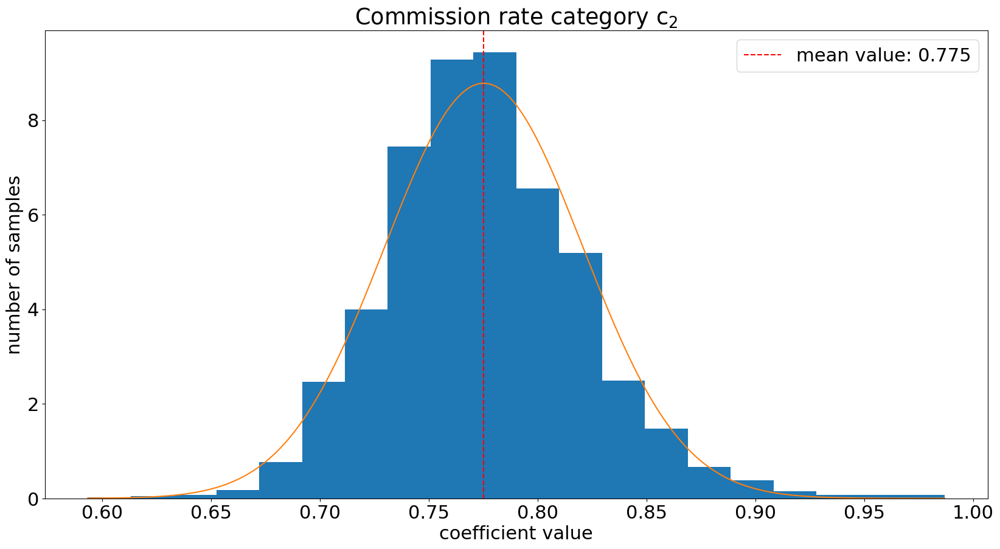

90.0% credible interval: [0.60423879 0.73522443]
p value based on samples: 0.0
p value based on normal distribution: 4.440892098500626e-16


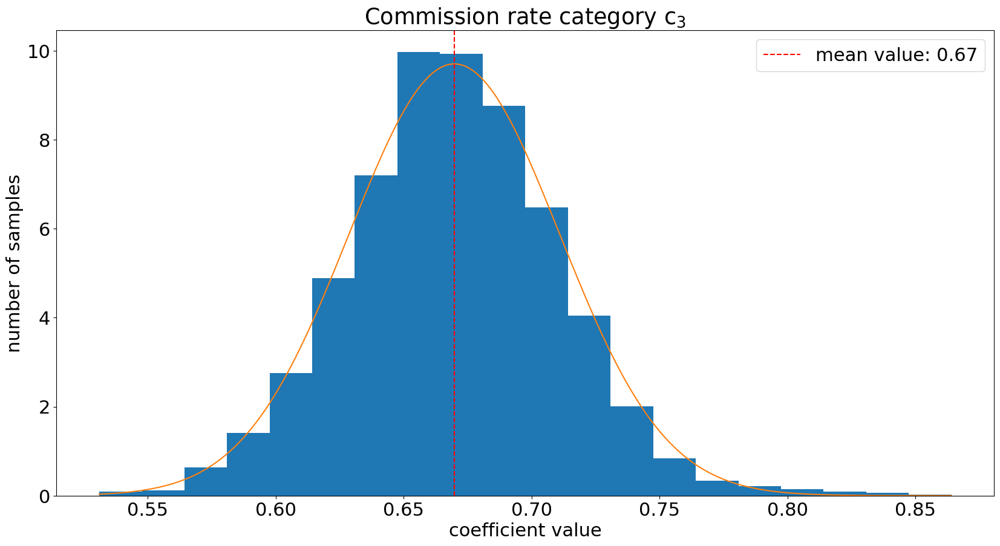

90.0% credible interval: [0.41812203 0.57162176]
p value based on samples: 0.0
p value based on normal distribution: 0.0


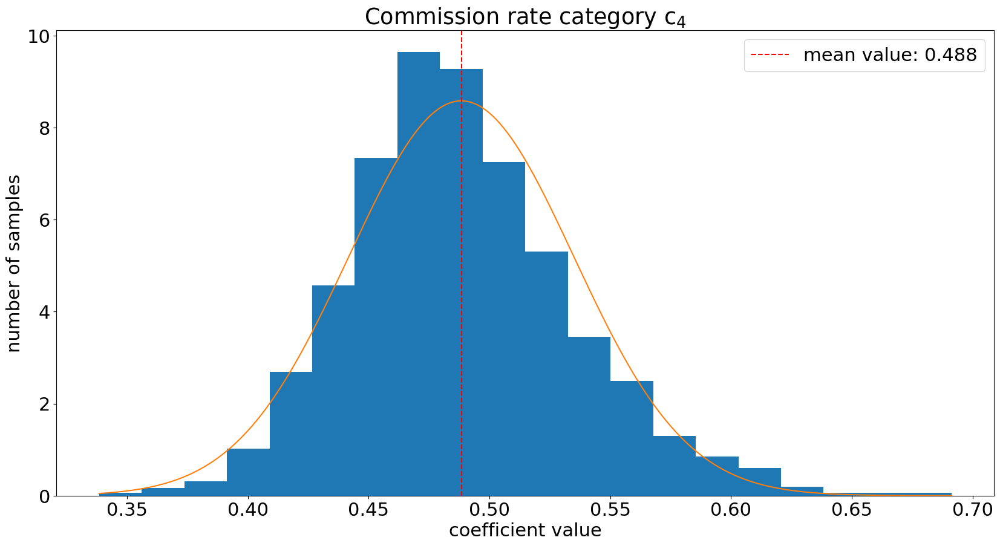

In [119]:
plot_distributions(mu_comm_samples, going_rate_samples)

In [120]:
diff_alpha = 0.05
sample_diffs_21 = (np.exp(mu_comm_samples[:, 2] - going_rate_samples) - 
                   np.exp(mu_comm_samples[:, 1] - going_rate_samples))
print(sample_diffs_21.mean())
print(np.quantile(sample_diffs_21, [diff_alpha / 2, 1 - (diff_alpha / 2)]))
print((sample_diffs_21 < 0).mean())

-0.10543895886281984
[-0.2207569   0.01338819]
0.9595


In [121]:
sample_diffs_31 = (np.exp(mu_comm_samples[:, 3] - going_rate_samples) - 
                   np.exp(mu_comm_samples[:, 1] - going_rate_samples))
print(sample_diffs_31.mean())
print(np.quantile(sample_diffs_31, [diff_alpha / 2, 1 - (diff_alpha / 2)]))
print((sample_diffs_31 < 0).mean())

-0.2868847856089079
[-0.41422496 -0.15885673]
1.0


In [122]:
sample_diffs_32 = (np.exp(mu_comm_samples[:, 3] - going_rate_samples) - 
                   np.exp(mu_comm_samples[:, 2] - going_rate_samples))
print(sample_diffs_32.mean())
print(np.quantile(sample_diffs_32, [diff_alpha / 2, 1 - (diff_alpha / 2)]))
print((sample_diffs_32 < 0).mean())

-0.1814458267460881
[-0.29698903 -0.05306829]
0.996


In [31]:
b_comm_samples = trace['b_comm']

In [32]:
b_comm_samples.shape

(2000, 32, 4)

In [33]:
def calculate_summary_statistics(b_comm_samples, mu_comm_samples, market_area_to_index_df, alpha=0.1):
    national_going_rate_samples = mu_comm_samples[:, 0]
    overall_lst = []

    lst = ['national']
    for i in range(3):
        sample_diffs = np.exp(mu_comm_samples[:, i + 1] - national_going_rate_samples)
        mean_diff = np.mean(sample_diffs)
        quantiles = np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)])
        lst.extend([mean_diff] + list(quantiles) + [(sample_diffs >= 1).mean()])

    overall_lst.append(lst)

    for market_area_index in range(market_area_num):
        market_area = market_area_to_index_df[
            market_area_to_index_df['market_area_index'] == market_area_index]['market_area'].iloc[0]
        market_area_samples = b_comm_samples[:, market_area_index, :]
        going_rate_samples = market_area_samples[:, 0]
        lst = [market_area]
        for i in range(1, 4):
            samples = market_area_samples[:, i]
            sample_diffs = np.exp(samples - going_rate_samples)
            mean_diff = np.mean(sample_diffs)
            quantiles = np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)])
            lst.extend([mean_diff] + list(quantiles) + [(sample_diffs >= 1).mean()])
        overall_lst.append(lst)

    columns = ['market_area', 'mean1', 'lower1', 'upper1', 'pvalue1', 'mean2', 'lower2', 'upper2', 'pvalue2',
               'mean3', 'lower3', 'upper3', 'pvalue3']
    effect_df = pd.DataFrame(overall_lst, columns=columns)
    effect_df['is_national'] = effect_df['market_area'].apply(lambda x: int(x == 'national'))
    return effect_df

In [34]:
effect_df = calculate_summary_statistics(b_comm_samples, mu_comm_samples, market_area_to_index_df)

In [35]:
effect_df.head()

,market_area,mean1,lower1,upper1,pvalue1,mean2,lower2,upper2,pvalue2,mean3,lower3,upper3,pvalue3,is_national
0,national,0.775235,0.704547,0.852314,0.0000,0.669796,0.604239,0.735224,0.0000,0.488350,0.418122,0.571622,0.0000,1
1,Atlanta,0.651649,0.584202,0.723189,0.0000,0.397068,0.336180,0.465545,0.0000,0.776656,0.464373,1.249948,0.1580,0
2,Austin,0.792257,0.692067,0.907559,0.0050,0.597804,0.466718,0.751266,0.0000,0.555890,0.331306,0.878158,0.0230,0
3,Boston,0.778236,0.579335,1.014362,0.0575,0.683826,0.435255,1.003914,0.0515,0.535383,0.370067,0.751947,0.0015,0
4,Buffalo,0.718891,0.585416,0.848707,0.0025,0.698087,0.483452,0.965596,0.0380,0.445868,0.233596,0.732296,0.0060,0


In [36]:
def plot_effects(effect_df):
    just_under_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                               if len(cutoffs) == 3 and market_area in market_areas_to_consider]

    just_under_market_areas = ['national'] + just_under_market_areas

    above_2_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                            if cutoffs[0] != 2]

    above_2_market_areas = ['national'] + above_2_market_areas

    for i in range(1, 4):
        if i == 1:
            df = effect_df[effect_df['market_area'].isin(just_under_market_areas)]
        elif i == 2:
            df = effect_df[effect_df['market_area'].isin(above_2_market_areas)]
        else:
            df = effect_df.copy()
        df.sort_values(['is_national', f'upper{i}'], ascending=[False, True], inplace=True)
        
        
        plt.figure(figsize=(20, max(10, len(df) / 2)))
        y = [x for x in range(len(df), 0, -1)]
        x = df[f'mean{i}']
        xerr = (np.abs(df[[f'lower{i}', f'upper{i}']].to_numpy() -
                       df[f'mean{i}'].to_numpy().reshape(-1, 1)).T)
        is_significant = df[f'upper{i}'] < 1
        colors = ['g' if x else 'r' for x in is_significant]
        plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=colors, capsize=0, marker='o', markersize=10, 
                     ls='none')
        plt.axvline(x=1, linestyle='--', color='k')
        
        yticks = []
        for market_area in df['market_area']:
            if market_area == 'national':
                num_listings = len(final_df_f[final_df_f['buyside_commission_range'] == i])
                p_value = df[df['market_area'] == 'national'][f'pvalue{i}'].iloc[0]
            else:
                num_listings = len(final_df_f[(final_df_f['buyside_commission_range'] == i) &
                                              (final_df_f['market_area'] == market_area)])
                p_value = df[df['market_area'] == market_area][f'pvalue{i}'].iloc[0]
            
            prob_below_one = 100 * (1 - p_value)
            yticks.append(f'{market_area} (N={num_listings}, p={round(prob_below_one)}%)')
        
        plt.yticks(y, yticks)
        plt.xlabel('odds of selling divided by odds of selling when offering going rate commission')
        xticks = plt.xticks()[0]
        for xtick in xticks[1: -1]:
            plt.axvline(x=xtick, color='k', linestyle='-', alpha=0.2)
        plt.title(i_to_title[i])
        
        yticks = plt.yticks()[0]
        for ytick in yticks:
            plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
        plt.show()

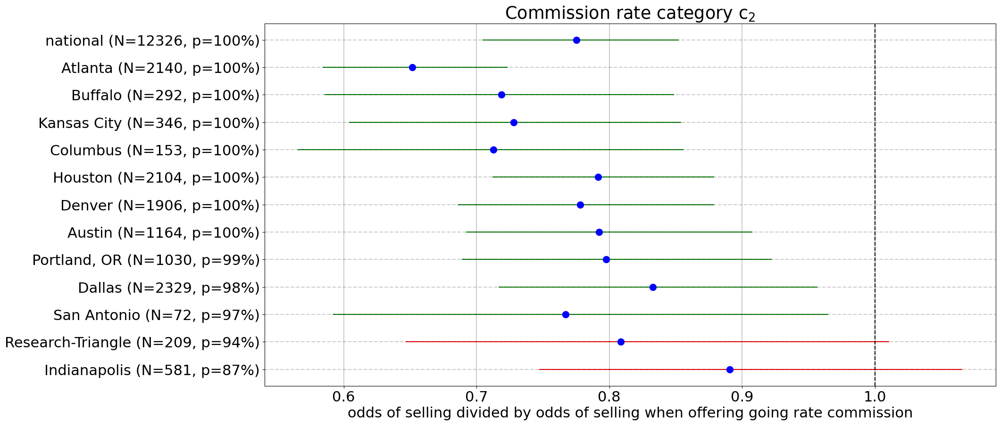

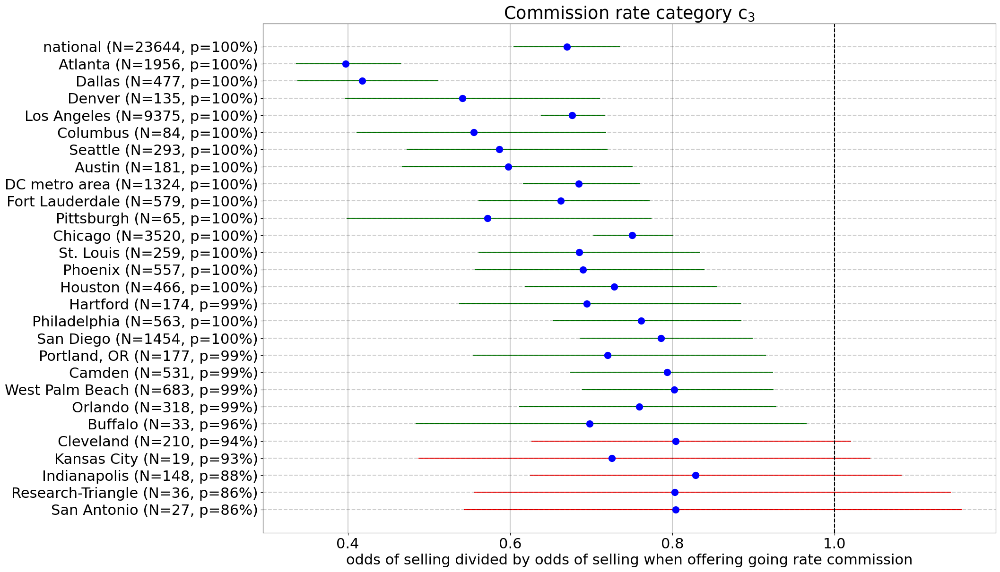

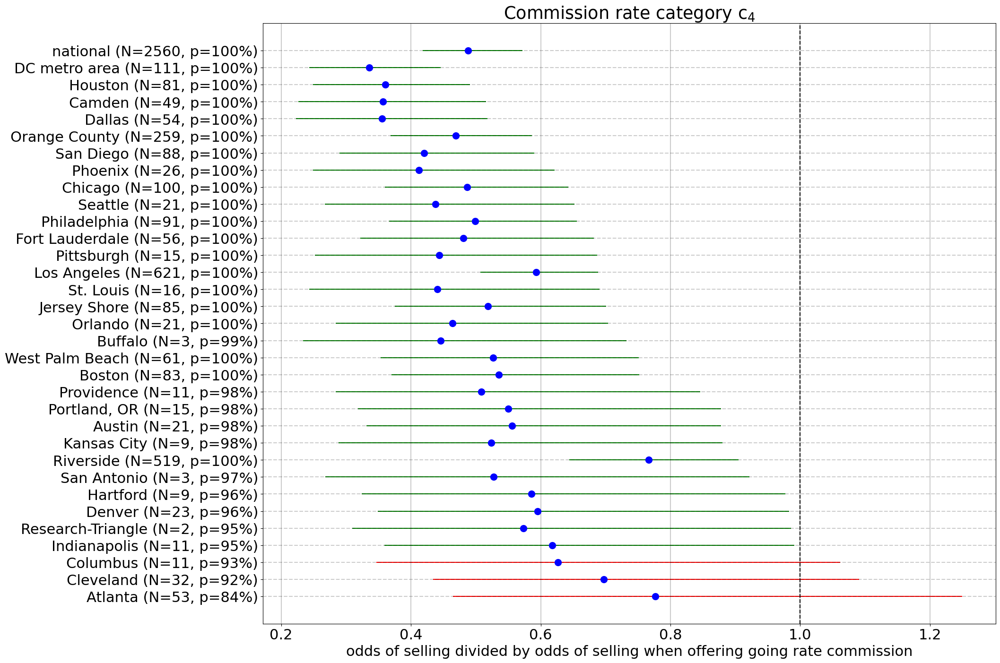

In [37]:
plot_effects(effect_df)

In [38]:
def plot_national_effects(effect_df):
    national_row = effect_df[effect_df['market_area'] == 'national']
    
    plt.figure(figsize=(20, 10))
    for i in range(1, 4):
        y = 4 - i
        x = national_row[f'mean{i}']
        xerr = (np.abs(national_row[[f'lower{i}', f'upper{i}']].to_numpy() -
                       national_row[f'mean{i}'].to_numpy().reshape(-1, 1)).T)
        is_significant = (national_row[f'upper{i}'] < 1).iloc[0]
        color = 'g' if is_significant else 'r'
        plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=color, capsize=0, marker='o', markersize=10, 
                     ls='none')
    plt.axvline(x=1, linestyle='--', color='k')
    plt.xlabel('odds of selling divided by odds of selling when offering going rate commission')
    xticks = plt.xticks()[0]
    first = 1 if i != 3 else 1
    for xtick in xticks[first: -1]:
        plt.axvline(x=xtick, color='k', linestyle='--', alpha=0.2)
        
    plt.ylabel('commission rate category')
    plt.yticks([1, 2, 3], ['$\mathregular{c_4}$', '$\mathregular{c_3}$', '$\mathregular{c_2}$'])
    # plt.title('Selling within 120 days')
    plt.show()

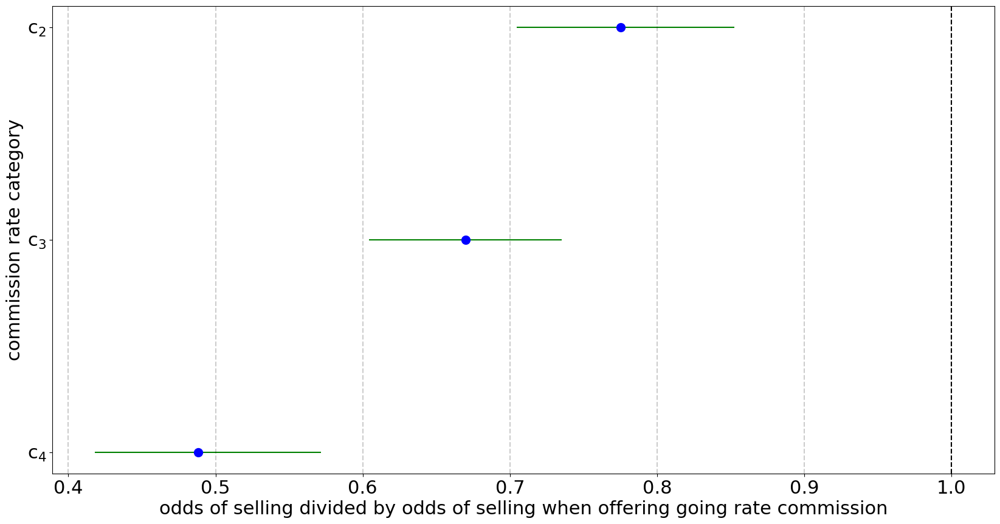

In [39]:
plot_national_effects(effect_df)

## get probabilities by market

In [40]:
def inv_logit(p):
    return 1 / (1 + np.exp(-p))

In [41]:
property_category_to_index_df = pd.read_csv('property_category_to_index_df.csv')
brokerage_to_index_df = pd.read_csv('brokerage_to_index_df.csv')

generic_brokerage_index = brokerage_to_index_df[
    brokerage_to_index_df['processed_brokerage'] == 'none']['brokerage_index'].iloc[0]

single_family_index = property_category_to_index_df[
    property_category_to_index_df['property_category'] == 'single_family']['property_category_index'].iloc[0]

In [42]:
final_df_f.groupby('market_area')['property_category_index'].agg(pd.Series.mode)

market_area
Atlanta              0
Austin               0
Boston               0
Buffalo              0
Camden               0
Chicago              0
Cleveland            0
Columbus             0
DC metro area        0
Dallas               0
Denver               0
Fort Lauderdale      0
Hartford             0
Houston              0
Indianapolis         0
Jersey Shore         0
Kansas City          0
Los Angeles          0
Orange County        0
Orlando              0
Philadelphia         2
Phoenix              0
Pittsburgh           0
Portland, OR         0
Providence           0
Research-Triangle    0
Riverside            0
San Antonio          0
San Diego            0
Seattle              0
St. Louis            0
West Palm Beach      0
Name: property_category_index, dtype: int64

In [43]:
final_df_f.groupby('market_area')['brokerage_index'].agg(pd.Series.mode)

market_area
Atlanta              0
Austin               0
Boston               0
Buffalo              0
Camden               0
Chicago              0
Cleveland            0
Columbus             0
DC metro area        0
Dallas               0
Denver               0
Fort Lauderdale      0
Hartford             0
Houston              0
Indianapolis         0
Jersey Shore         0
Kansas City          0
Los Angeles          0
Orange County        0
Orlando              0
Philadelphia         0
Phoenix              0
Pittsburgh           0
Portland, OR         0
Providence           0
Research-Triangle    0
Riverside            0
San Antonio          0
San Diego            0
Seattle              0
St. Louis            0
West Palm Beach      0
Name: brokerage_index, dtype: int64

In [44]:
alpha = 0.1
lst_of_lsts = []

for _, row in market_area_to_index_df.iterrows():
    market_area = row['market_area']
    idx = row['market_area_index']
    lst = [market_area]
    
    market_area_df = final_df_f[final_df_f['market_area'] == market_area]
    hoa = market_area_df['hoa'].median()
    opendoor = market_area_df['opendoor'].median()
    zillow = market_area_df['zillow'].median()
    offerpad = market_area_df['offerpad'].median()
    avg_views_5 = market_area_df['avg_views_5'].median()
    avg_views_10 = market_area_df['avg_views_10'].median()
    avg_views_30 = market_area_df['avg_views_30'].median()
    avg_views_100 = market_area_df['avg_views_100'].median()
    avg_views_200 = market_area_df['avg_views_200'].median()
    null_price = int(market_area_df['null_redfin_price_estimate'].median())
    price_indicator = int(market_area_df['price_range'].median())
    beds_indicator = int(market_area_df['beds_range'].median())
    baths_indicator = int(market_area_df['baths_range'].median())
    sqft_indicator = int(market_area_df['sqft_range'].median())
    year_built_indicator = int(market_area_df['year_built_range'].median())
    price_difference_pct_indicator = int(market_area_df['price_difference_pct_range'].median())
    brokerage_listings_pct_indicator = int(market_area_df['brokerage_listings_pct_range'].median())
    created_month_indicator = int(market_area_df['created_month_index'].median())
    
    common_lin_pred_func = (
        trace['b_intercept'][:, idx] +
        hoa * trace['b_hoa'][:, idx] +
        opendoor * trace['b_opendoor'][:, idx] +
        zillow * trace['b_zillow'][:, idx] +
        offerpad * trace['b_offerpad'][:, idx] +
        avg_views_5 * trace['b_avg_views_5'][:, idx] +
        avg_views_10 * trace['b_avg_views_10'][:, idx] +
        avg_views_30 * trace['b_avg_views_30'][:, idx] + 
        avg_views_100 * trace['b_avg_views_100'][:, idx] +
        avg_views_200 * trace['b_avg_views_200'][:, idx] +
        null_price * trace['b_null_price'][:, idx] +
        trace['b_price'][:, idx, price_indicator] +
        trace['b_beds'][:, idx, beds_indicator] +
        trace['b_baths'][:, idx, baths_indicator] +
        trace['b_sqft'][:, idx, sqft_indicator] +
        trace['b_year_built'][:, idx, year_built_indicator] +
        trace['b_price_difference_pct'][:, idx, price_difference_pct_indicator] +
        trace['b_property_category'][:, idx, single_family_index] + 
        trace['b_brokerage'][:, idx, generic_brokerage_index] + 
        trace['b_brokerage_listings_pct'][:, idx, brokerage_listings_pct_indicator] +
        trace['b_created_month'][:, idx, created_month_indicator]
    )
    
    c0_lin_pred_func = common_lin_pred_func + trace['b_comm'][:, idx, 0]
    c0_probs = 1 - inv_logit(c0_lin_pred_func)
    lst.append(100 * c0_probs.mean())
    
    for i in range(1, 4):
        lin_pred_func = common_lin_pred_func + trace['b_comm'][:, idx, i]
        probs = 1 - inv_logit(lin_pred_func)
        probs_pct_diff = 100 * ((probs / c0_probs) - 1)
        mean_probs_pct_diff = np.mean(probs_pct_diff)
        quantiles = np.quantile(probs_pct_diff, [alpha / 2, 1 - (alpha / 2)])
        lst.extend([mean_probs_pct_diff] + list(quantiles) + [(probs_pct_diff <= 0).mean()])
    lst_of_lsts.append(lst)

    
columns = ['market_area', 'c0_prob', 'mean1', 'lower1', 'upper1', 'pvalue1', 'mean2', 'lower2', 'upper2', 
           'pvalue2', 'mean3', 'lower3', 'upper3', 'pvalue3']
probs_pct_diff_df = pd.DataFrame(lst_of_lsts, columns=columns)

In [45]:
just_under_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                               if len(cutoffs) == 3 and market_area in market_areas_to_consider]

above_2_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                        if cutoffs[0] != 2]

In [46]:
for i in range(1, 4):
    show_df = probs_pct_diff_df[probs_pct_diff_df['market_area'].isin(
        final_df_f[final_df_f['buyside_commission_range'] == i]['market_area'].unique())][
        ['market_area'] + [col for col in probs_pct_diff_df.columns if col.endswith(str(i))]]
    
    show_df.sort_values('market_area', inplace=True)
    
    def get_interval(row):
        lower = round(row[f'lower{i}'], 1)
        upper = round(row[f'upper{i}'], 1)
        return f'[{lower}%; {upper}%]'  
    
    show_df['90% interval'] = show_df.apply(get_interval, axis=1)
    show_df.drop(columns=[f'lower{i}', f'upper{i}'], inplace=True)
    show_df[f'mean{i}'] = show_df[f'mean{i}'].round(1)
    show_df['prob_above_zero'] = (100 * (1 - show_df[f'pvalue{i}'])).round(1)
    show_df['prob_above_zero'] = show_df['prob_above_zero'].apply(lambda x: f'{x}%')
    show_df = show_df[['market_area', f'mean{i}', '90% interval', 'prob_above_zero']]
    print(len(show_df))
    display(show_df)
    
    # show_df.to_csv(f'~/downloads/prob_df_{i}.csv', index=False)

12


,market_area,mean1,90% interval,prob_above_zero
0,Atlanta,45.0,[31.9%; 58.6%],100.0%
1,Austin,21.1,[8.3%; 34.0%],99.5%
3,Buffalo,31.5,[14.0%; 53.1%],99.8%
7,Columbus,31.9,[13.3%; 54.9%],99.9%
9,Dallas,19.0,[4.1%; 35.6%],97.8%
10,Denver,25.2,[12.0%; 38.9%],100.0%
13,Houston,19.1,[10.1%; 28.3%],100.0%
14,Indianapolis,10.2,[-4.9%; 25.5%],86.6%
16,Kansas City,30.0,[13.6%; 50.1%],99.8%
23,"Portland, OR",22.1,[7.2%; 37.8%],99.0%


27


,market_area,mean2,90% interval,prob_above_zero
0,Atlanta,115.5,[88.0%; 143.9%],100.0%
1,Austin,51.0,[25.1%; 78.4%],100.0%
3,Buffalo,37.4,[2.8%; 78.5%],96.2%
4,Camden,17.5,[5.6%; 30.3%],99.2%
5,Chicago,23.9,[17.9%; 30.1%],100.0%
6,Cleveland,9.8,[-0.7%; 22.1%],94.2%
7,Columbus,59.7,[29.1%; 96.4%],100.0%
8,DC metro area,30.6,[21.4%; 40.2%],100.0%
9,Dallas,118.2,[82.0%; 160.0%],100.0%
10,Denver,72.4,[34.3%; 116.8%],100.0%


32


,market_area,mean3,90% interval,prob_above_zero
0,Atlanta,33.1,[-18.0%; 90.8%],84.2%
1,Austin,64.4,[11.5%; 121.5%],97.7%
2,Boston,77.0,[28.5%; 129.9%],99.9%
3,Buffalo,96.2,[27.9%; 183.6%],99.4%
4,Camden,85.8,[50.5%; 128.6%],100.0%
5,Chicago,67.5,[37.5%; 97.9%],100.0%
6,Cleveland,16.4,[-3.4%; 37.2%],92.1%
7,Columbus,53.4,[-5.0%; 116.2%],93.2%
8,DC metro area,98.0,[67.4%; 130.3%],100.0%
9,Dallas,156.8,[78.6%; 249.5%],100.0%


In [47]:
def plot_prob_diff_effects(effect_df):
    just_under_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                               if len(cutoffs) == 3 and market_area in market_areas_to_consider]

    above_2_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                            if cutoffs[0] != 2]

    for i in range(1, 4):
        if i == 1:
            df = effect_df[effect_df['market_area'].isin(just_under_market_areas)]
        elif i == 2:
            df = effect_df[effect_df['market_area'].isin(above_2_market_areas)]
        else:
            df = effect_df.copy()
        df.sort_values(f'lower{i}', ascending=False, inplace=True)
        
        plt.figure(figsize=(20, max(10, len(df) / 2)))
        y = [x for x in range(len(df), 0, -1)]
        x = df[f'mean{i}']
        xerr = (np.abs(df[[f'lower{i}', f'upper{i}']].to_numpy() -
                       df[f'mean{i}'].to_numpy().reshape(-1, 1)).T)
        is_significant = df[f'lower{i}'] > 0
        colors = ['g' if x else 'r' for x in is_significant]
        plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=colors, capsize=0, marker='o', markersize=10, 
                     ls='none')
        plt.axvline(x=0, linestyle='--', color='k')
        
        yticks = []
        for market_area in df['market_area']:
            p_value = df[df['market_area'] == market_area][f'pvalue{i}'].iloc[0]
            prob_above_zero = 100 * (1 - p_value)
            num_listings = len(final_df_f[(final_df_f['buyside_commission_range'] == i) &
                                          (final_df_f['market_area'] == market_area)])
            c0_prob = df[df['market_area'] == market_area]['c0_prob'].iloc[0]
            first_part = f'{market_area} (N={num_listings}, '
            ytick = first_part + f'p={round(prob_above_zero)}%, $Pr(c_1)$={round(c0_prob, 1)}%)'
            yticks.append(ytick)
        
        plt.yticks(y, yticks)
        plt.xlabel(('percent difference in probability of not selling compared ' +
                    'to listings offering going rate commission'))
        xticks = plt.xticks()[0]
        for xtick in xticks[1: -1]:
            plt.axvline(x=xtick, color='k', linestyle='-', alpha=0.2)
        plt.title(i_to_title[i])
        
        yticks = plt.yticks()[0]
        for ytick in yticks:
            plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
        plt.gca().set_xticklabels([f'{x/100:.0%}' for x in plt.gca().get_xticks()])
        plt.show()

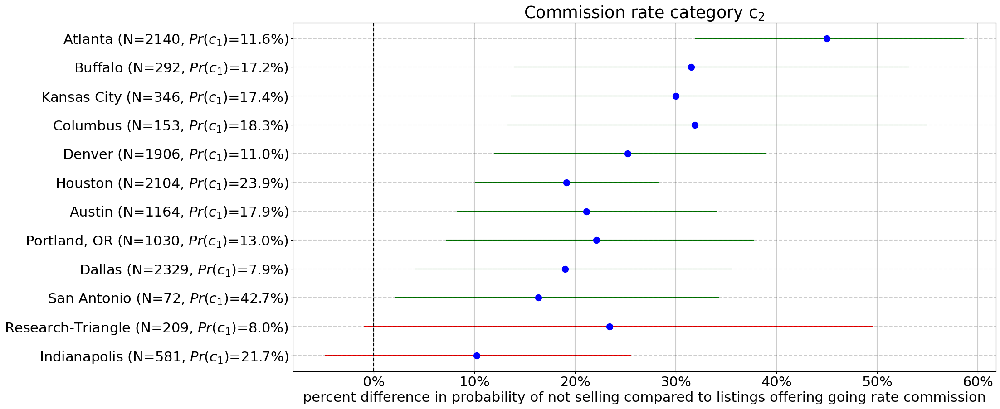

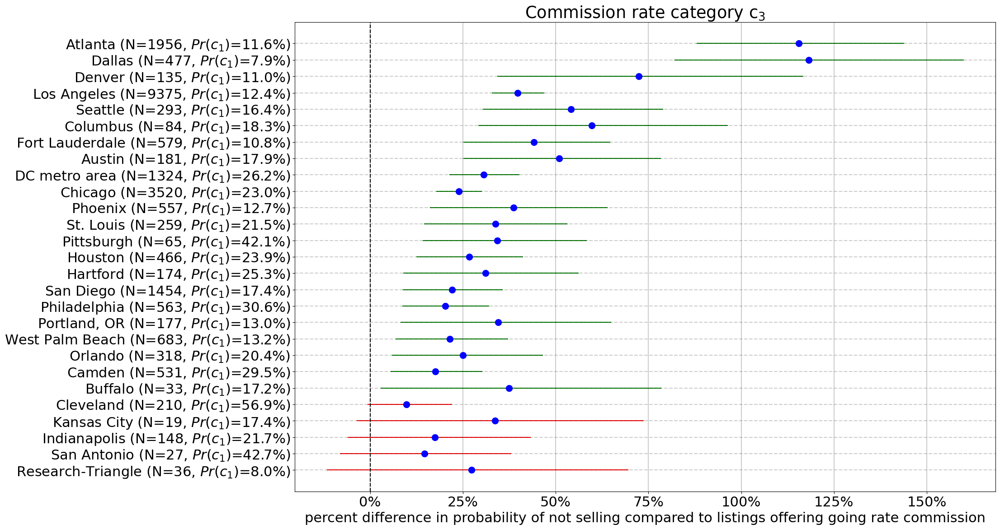

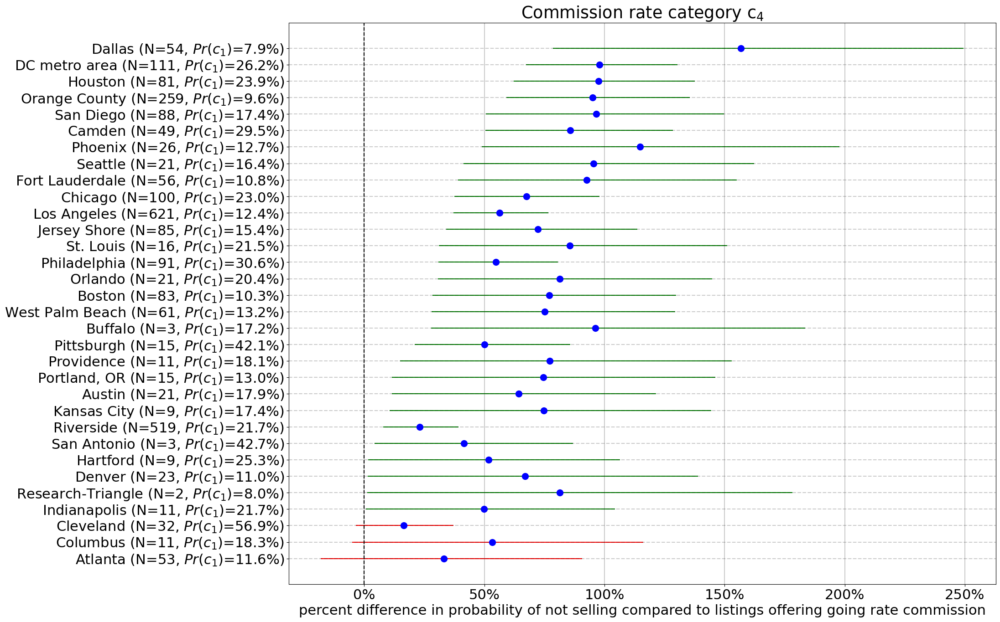

In [48]:
plot_prob_diff_effects(probs_pct_diff_df)

## prob of sale for iBuyers

In [49]:
def calculate_summary_statistics_ibuyer(ibuyer_name, market_area_to_index_df, alpha=0.1, min_sales=40):
    b_ibuyer_samples = trace[f'b_{ibuyer_name}']
    overall_lst = []
    
    ibuyer_to_indicator = defaultdict(int)
    ibuyer_to_indicator[ibuyer_name] = 1

    for market_area_index in range(market_area_num):
        market_area = market_area_to_index_df[
            market_area_to_index_df['market_area_index'] == market_area_index]['market_area'].iloc[0]
        n_ibuyer_listings = final_df_f[final_df_f['market_area'] == market_area][ibuyer_name].sum()
        if n_ibuyer_listings < min_sales:
            continue
            
#         print(market_area)
#         display(summary_df[summary_df.index.str.startswith(f'b_{ibuyer_name}[{market_area_index}]')])
        
        idx = market_area_index
        market_area_df = final_df_f[final_df_f['market_area'] == market_area]
        hoa = market_area_df['hoa'].median()
        avg_views_5 = market_area_df['avg_views_5'].median()
        avg_views_10 = market_area_df['avg_views_10'].median()
        avg_views_30 = market_area_df['avg_views_30'].median()
        avg_views_100 = market_area_df['avg_views_100'].median()
        avg_views_200 = market_area_df['avg_views_200'].median()
        null_price = int(market_area_df['null_redfin_price_estimate'].median())
        price_indicator = int(market_area_df['price_range'].median())
        beds_indicator = int(market_area_df['beds_range'].median())
        baths_indicator = int(market_area_df['baths_range'].median())
        sqft_indicator = int(market_area_df['sqft_range'].median())
        year_built_indicator = int(market_area_df['year_built_range'].median())
        price_difference_pct_indicator = int(market_area_df['price_difference_pct_range'].median())
        brokerage_listings_pct_indicator = int(market_area_df['brokerage_listings_pct_range'].median())
        created_month_indicator = int(market_area_df['created_month_index'].median())
    
        common_lin_pred_func = (
            trace['b_intercept'][:, idx] +
            trace['b_comm'][:, idx, 0] +
            hoa * trace['b_hoa'][:, idx] +
            0 * trace['b_opendoor'][:, idx] +
            0 * trace['b_zillow'][:, idx] +
            0 * trace['b_offerpad'][:, idx] +
            avg_views_5 * trace['b_avg_views_5'][:, idx] +
            avg_views_10 * trace['b_avg_views_10'][:, idx] +
            avg_views_30 * trace['b_avg_views_30'][:, idx] + 
            avg_views_100 * trace['b_avg_views_100'][:, idx] +
            avg_views_200 * trace['b_avg_views_200'][:, idx] +
            null_price * trace['b_null_price'][:, idx] +
            trace['b_price'][:, idx, price_indicator] +
            trace['b_beds'][:, idx, beds_indicator] +
            trace['b_baths'][:, idx, baths_indicator] +
            trace['b_sqft'][:, idx, sqft_indicator] +
            trace['b_year_built'][:, idx, year_built_indicator] +
            trace['b_price_difference_pct'][:, idx, price_difference_pct_indicator] +
            trace['b_property_category'][:, idx, single_family_index] + 
            trace['b_brokerage'][:, idx, generic_brokerage_index] + 
            trace['b_brokerage_listings_pct'][:, idx, brokerage_listings_pct_indicator] +
            trace['b_created_month'][:, idx, created_month_indicator]
        )

        baseline_probs = 1 - inv_logit(common_lin_pred_func)
        # lst.append(100 * c0_probs.mean())
        
        lin_pred_func = common_lin_pred_func + trace[f'b_{ibuyer_name}'][:, idx]

        probs = 1 - inv_logit(lin_pred_func)
#         print('baseline probs:', round(baseline_probs.mean(), 3))
#         print('probs:', round(probs.mean(), 3))
        probs_pct_diff = 100 * ((probs / baseline_probs) - 1)
        mean_probs_pct_diff = np.mean(probs_pct_diff)
        quantiles = np.quantile(probs_pct_diff, [alpha / 2, 1 - (alpha / 2)])
        lst = ([market_area, mean_probs_pct_diff, n_ibuyer_listings] + 
               list(quantiles) + [(probs_pct_diff <= 0).mean()])
        overall_lst.append(lst)
            
    columns = ['market_area', 'mean', 'n', 'lower', 'upper', 'pvalue']
    effect_df = pd.DataFrame(overall_lst, columns=columns)
    return effect_df

def plot_effects_ibuyer(ibuyer_name, effect_df):
    ibuyer_name = ibuyer_name.capitalize()
    df = effect_df.copy()
    df.sort_values('lower', ascending=False, inplace=True)

    plt.figure(figsize=(20, max(10, len(df) / 2)))
    y = [x for x in range(len(df), 0, -1)]
    x = df['mean']
    xerr = (np.abs(df[['lower', 'upper']].to_numpy() -
                   df['mean'].to_numpy().reshape(-1, 1)).T)
    is_significant = df['lower'] > 0
    colors = ['g' if x else 'r' for x in is_significant]
    plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=colors, capsize=0, marker='o', markersize=10, 
                 ls='none')
    plt.axvline(x=0, linestyle='--', color='k')

    yticks = []
    for market_area in df['market_area']:
        market_area_df = df[df['market_area'] == market_area]
        
        num_listings = market_area_df['n'].iloc[0]
        p_value = market_area_df['pvalue'].iloc[0]

        prob_above_zero = 100 * (1 - p_value)
        yticks.append(f'{market_area} (N={num_listings}, p={round(prob_above_zero)}%)')

    plt.yticks(y, yticks)
    plt.xlabel((f'percent difference in probability of not selling for {ibuyer_name} listings compared ' +
                 'to non-iBuyer listings'))
    xticks = plt.xticks()[0]
    for xtick in xticks[1: -1]:
        plt.axvline(x=xtick, color='k', linestyle='-', alpha=0.2)

    yticks = plt.yticks()[0]
    for ytick in yticks:
        plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
    plt.gca().set_xticklabels([f'{x/100:.0%}' for x in plt.gca().get_xticks()]) 
    plt.title(ibuyer_name)
    plt.show()

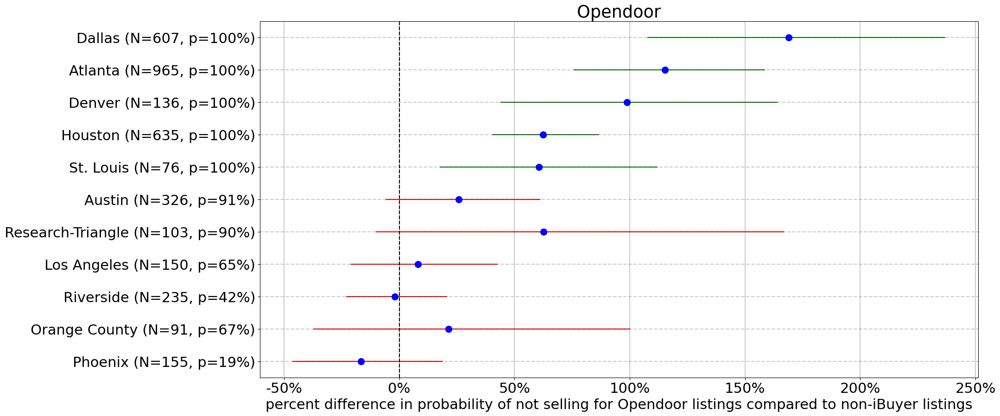

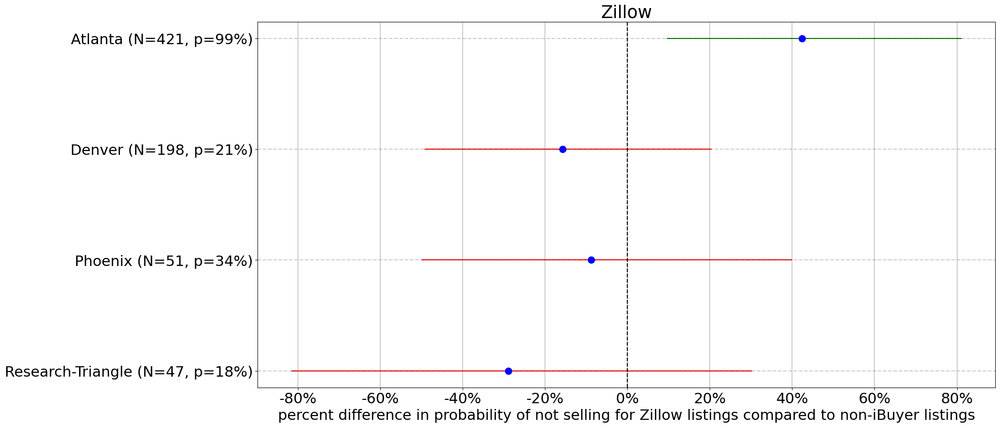

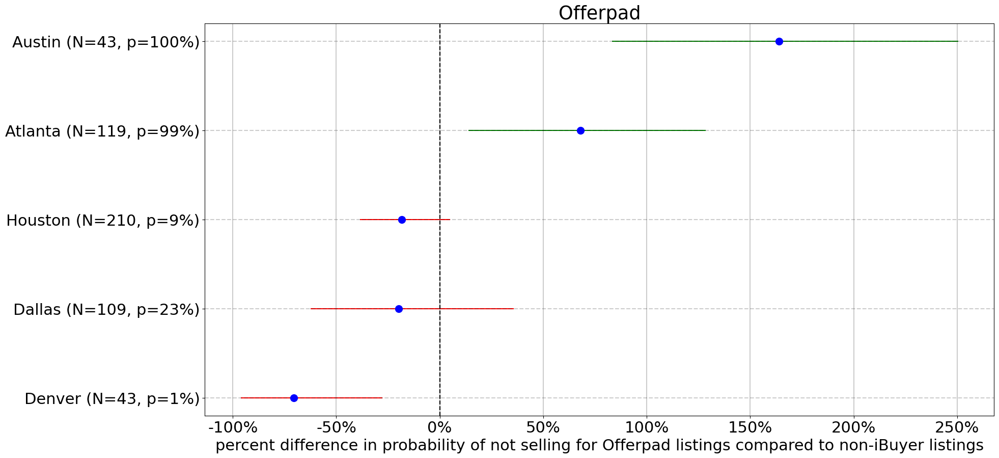

In [50]:
for ibuyer_name in ['opendoor', 'zillow', 'offerpad']:
    effect_df_ibuyer = calculate_summary_statistics_ibuyer(ibuyer_name, market_area_to_index_df)
    plot_effects_ibuyer(ibuyer_name, effect_df_ibuyer)

## explore results

In [129]:
b_avg_views_sum = np.zeros(trace['b_avg_views_5'].shape)
for var in ['b_avg_views_5', 'b_avg_views_10', 'b_avg_views_30', 'b_avg_views_100', 'b_avg_views_200']:
    b_avg_views_sum += trace[var]
b_avg_views_sum /= 1000

In [144]:
alpha = 0.05
mean_sums = np.mean(b_avg_views_sum, axis=0)
lower_bounds = np.quantile(b_avg_views_sum, q=[alpha / 2], axis=0)[0]
print('number of markets:', len(mean_sums))
print('number of markets where mean sum is positive:', np.sum(mean_sums > 0))
print('number of markets where sum is statistically significantly positive:', np.sum(lower_bounds > 0))

number of markets: 32
number of markets where mean sum is positive: 30
number of markets where sum is statistically significantly positive: 19


In [146]:
final_df_f['market_area'].value_counts()

Chicago              30491
Los Angeles          26146
Houston              17296
Atlanta              16523
DC metro area        15675
Riverside            13791
Philadelphia         12763
Dallas               11919
Austin                9754
Orange County         9378
Boston                8423
West Palm Beach       7723
Denver                6303
Camden                6183
Fort Lauderdale       5910
Seattle               5900
Jersey Shore          5328
Portland, OR          4254
St. Louis             3928
San Diego             3925
Kansas City           2273
Phoenix               2160
Pittsburgh            1982
Indianapolis          1963
Columbus              1898
Orlando               1475
Hartford              1287
Buffalo               1239
Cleveland             1132
Research-Triangle      822
Providence             595
San Antonio            418
Name: market_area, dtype: int64

In [148]:
np.array(sorted_market_areas)[lower_bounds < 0]

array(['Boston', 'Buffalo', 'Cleveland', 'Columbus', 'DC metro area',
       'Denver', 'Hartford', 'Jersey Shore', 'Orlando', 'Phoenix',
       'Pittsburgh', 'Providence', 'San Antonio'], dtype=object)

In [51]:
d = {
    'redfin': 'Redfin',
    'none': 'other brokerage',
    'keller williams': 'Keller Williams',
    'berkshire hathaway': 'Berkshire Hathaway',
    'remax': 'RE/MAX',
    'century 21': 'Century 21',
    'coldwell banker': 'Coldwell Banker',
    'compass': 'Compass',
    'exp realty': 'EXp Realty'
}


brokerage_to_index_df2 = brokerage_to_index_df.copy()
brokerage_to_index_df2['processed_brokerage'].replace(d, inplace=True)
brokerage_to_index_df2 = brokerage_to_index_df2.sort_values('processed_brokerage').reset_index(drop=True)
brokerage_to_index_df2['processed_brokerage'].replace(
    {'other brokerage': 'Other brokerage', 'EXp Realty': 'eXp Realty'}, inplace=True)

number of Redfin listings: 128


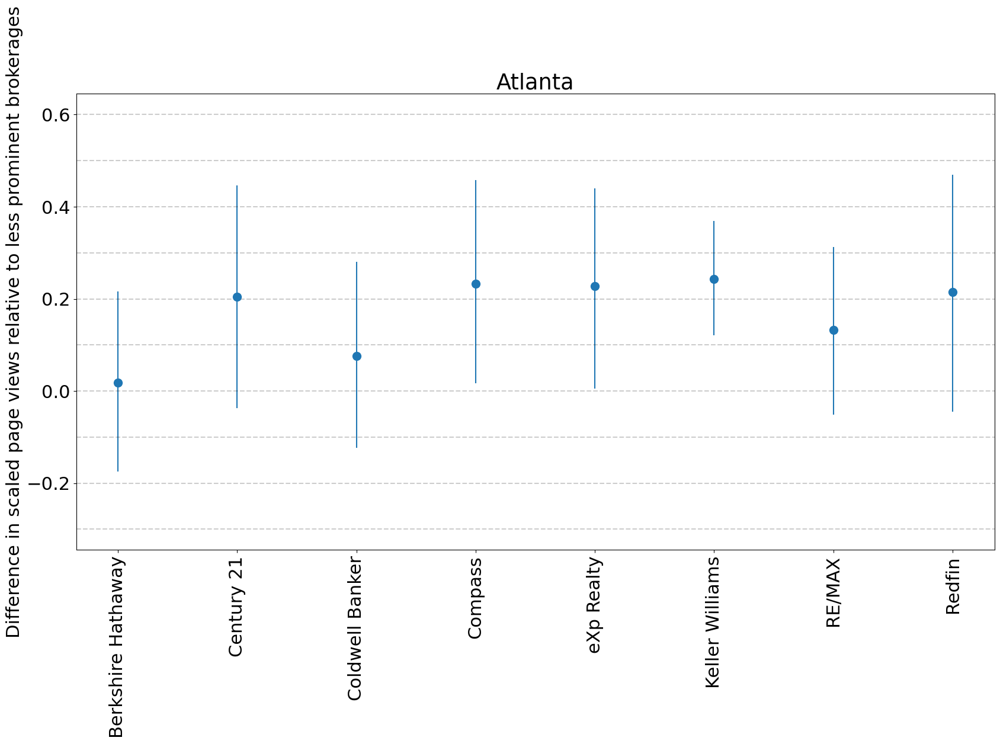

number of Redfin listings: 176


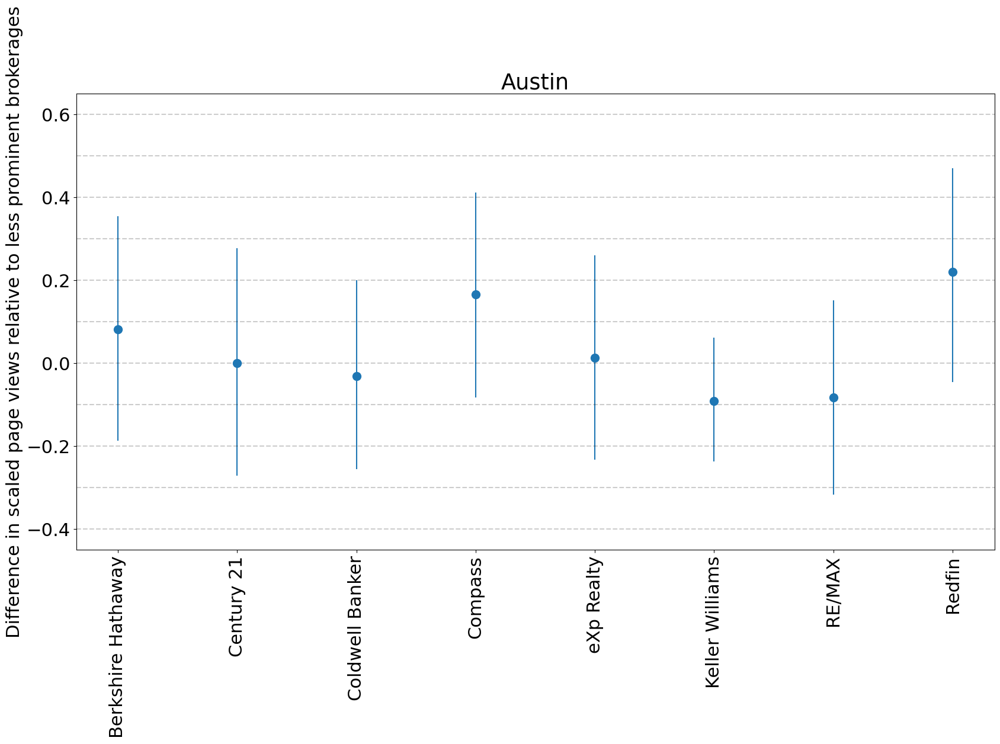

number of Redfin listings: 794


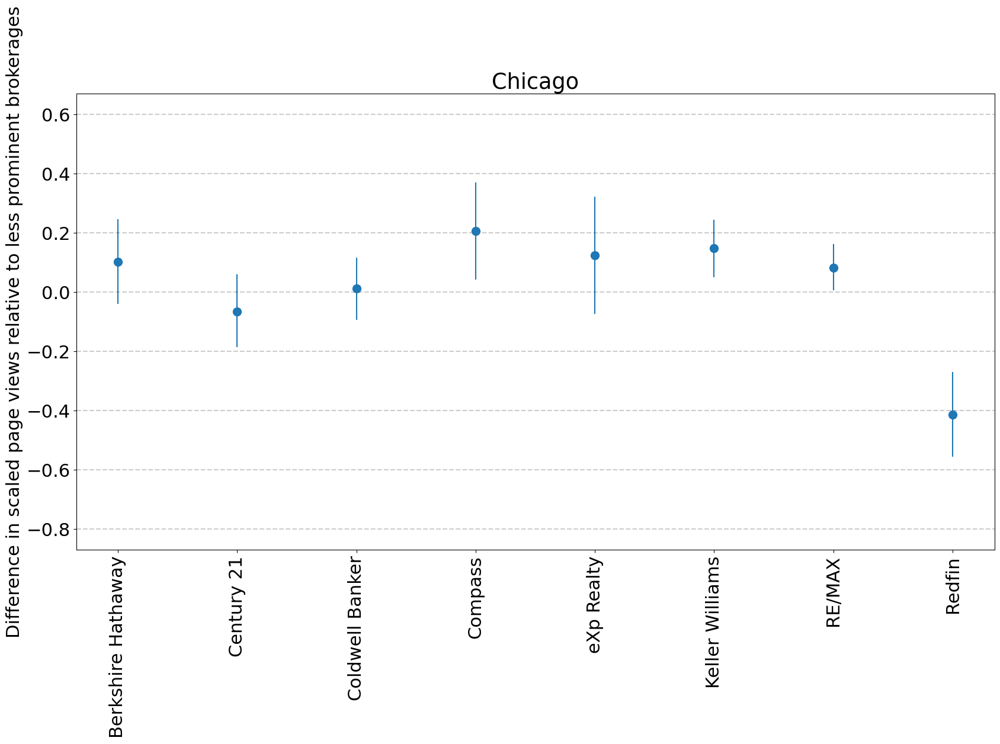

number of Redfin listings: 554


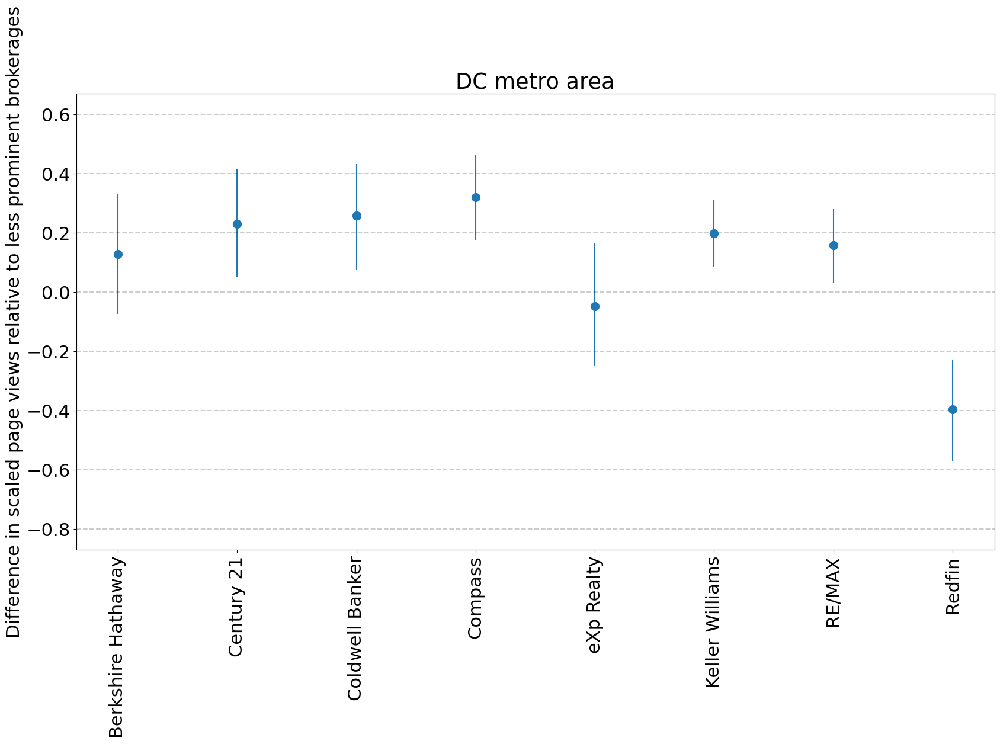

number of Redfin listings: 114


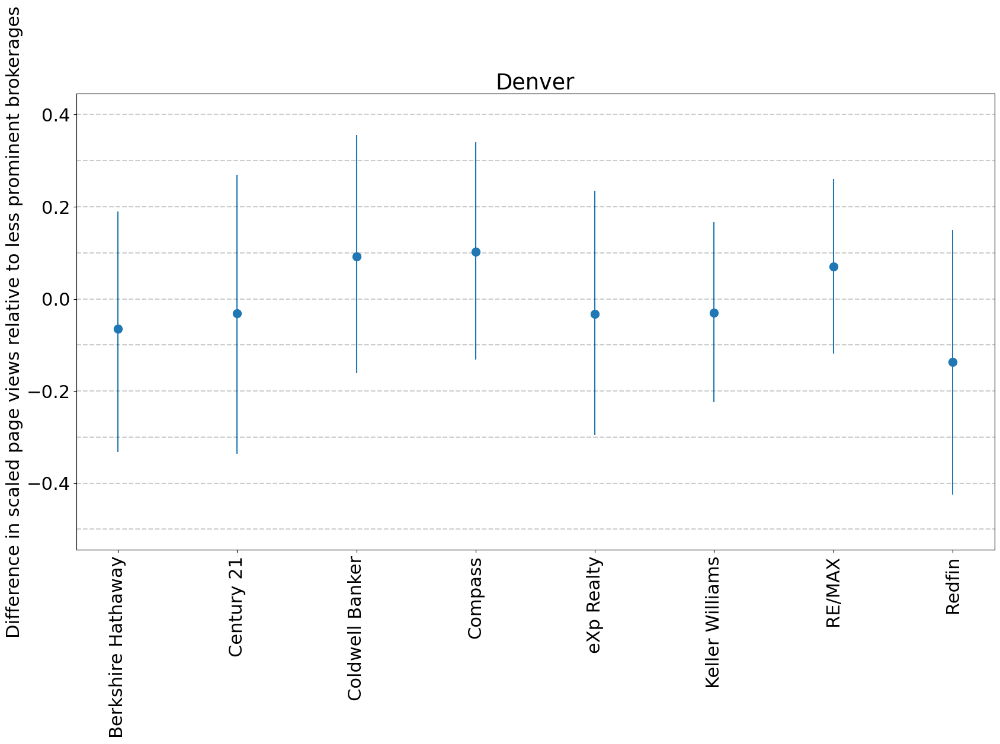

number of Redfin listings: 138


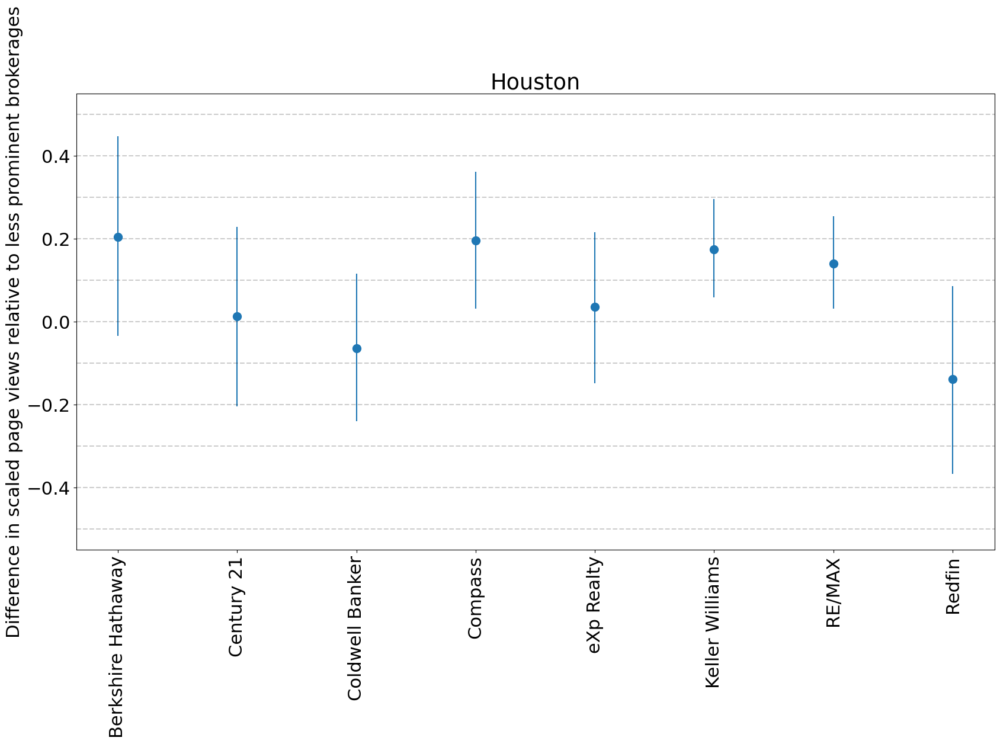

number of Redfin listings: 403


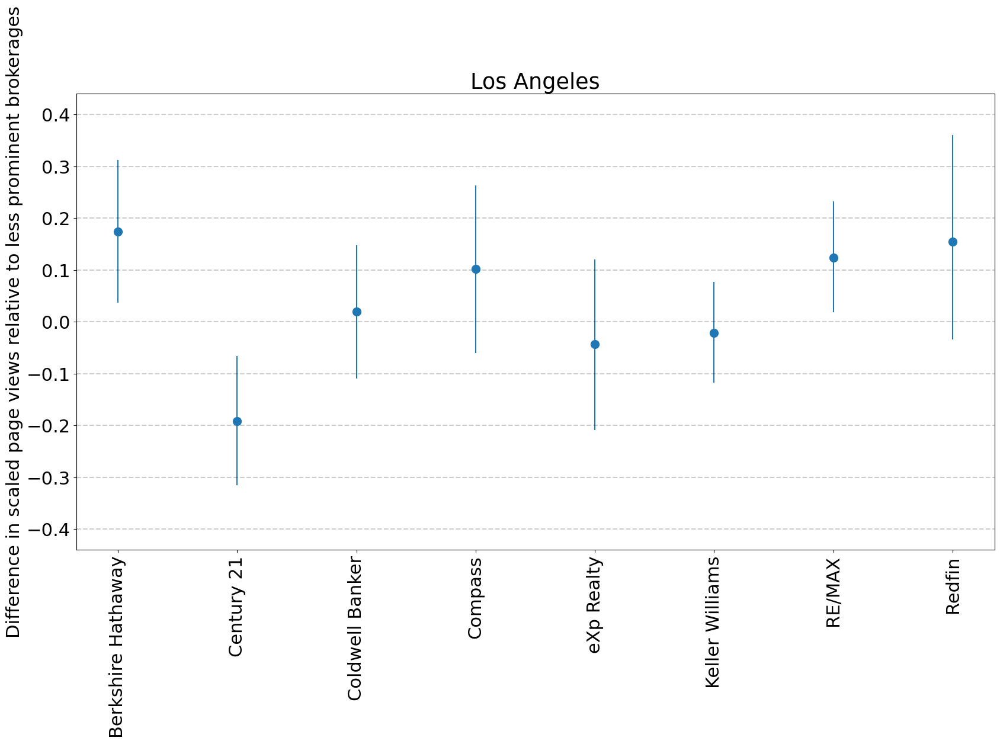

number of Redfin listings: 188


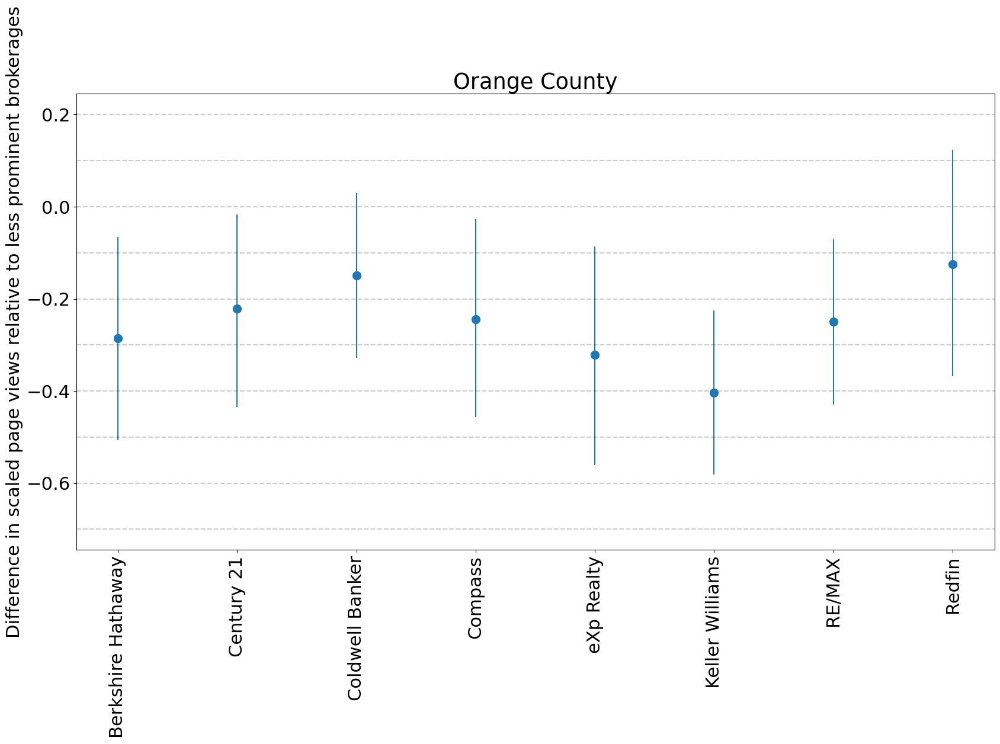

number of Redfin listings: 227


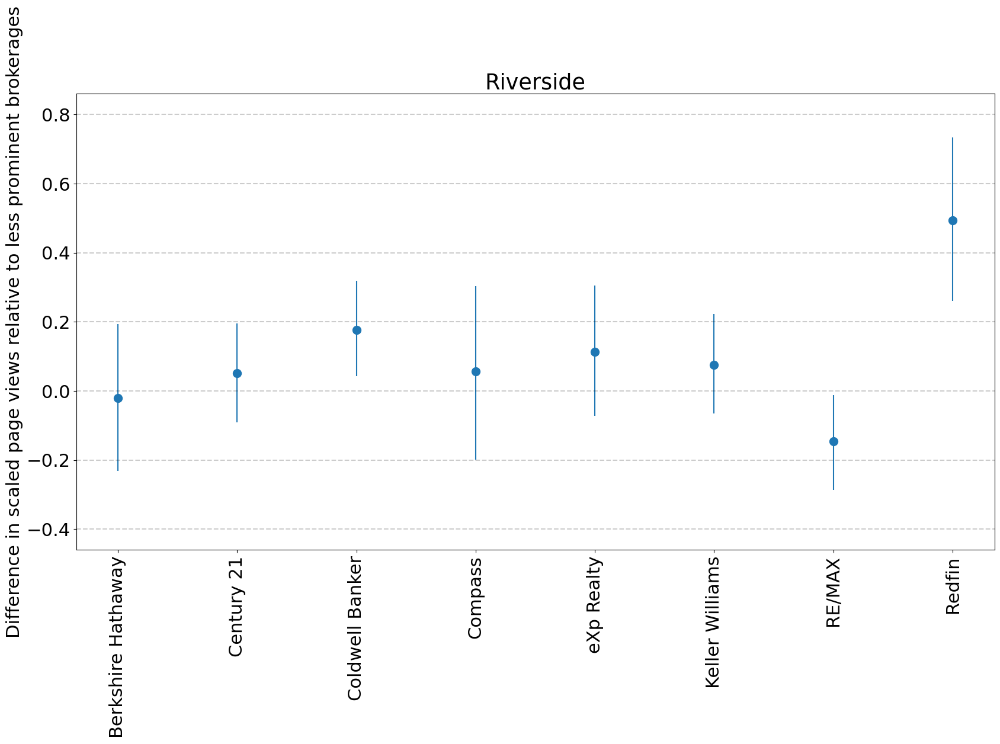

number of Redfin listings: 154


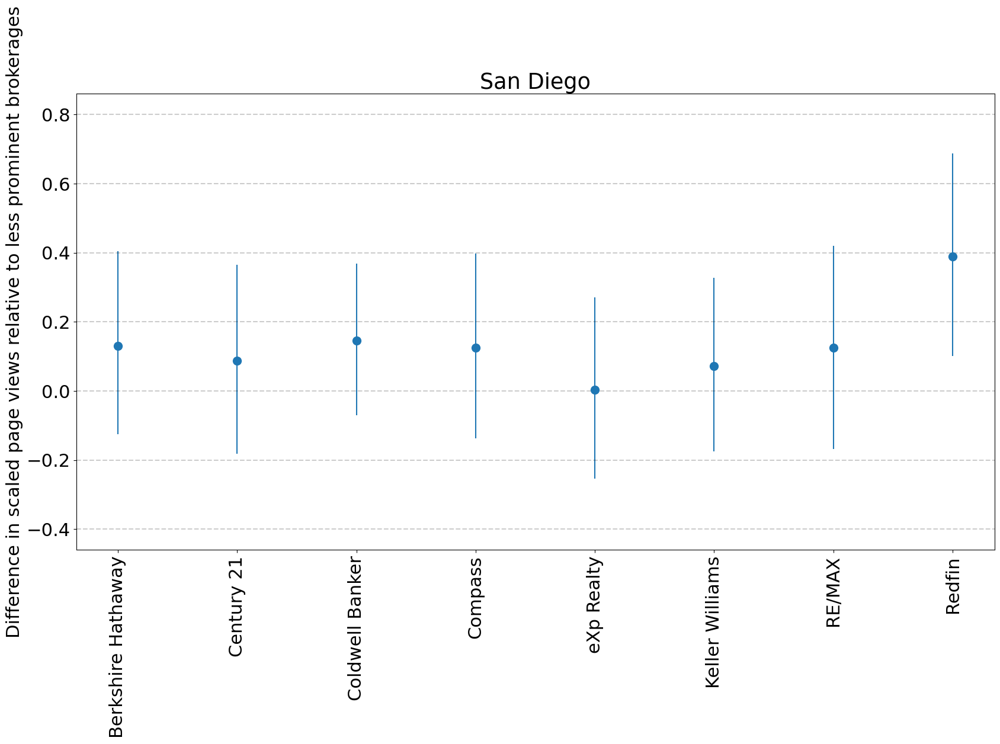

number of Redfin listings: 348


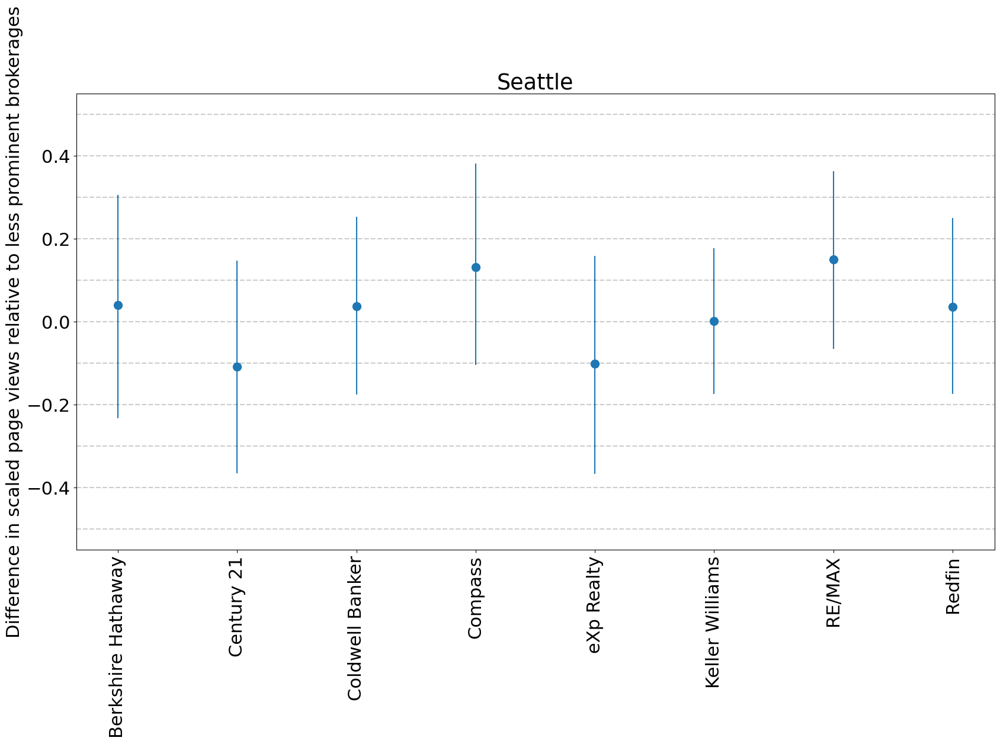

In [53]:
b_brokerage_mat = trace['b_brokerage']

other_brokerage_index = brokerage_to_index_df2[
        brokerage_to_index_df2['processed_brokerage'] == 'Other brokerage'].iloc[0]['brokerage_index']
    
for _, row in market_area_to_index_df.iterrows():
    market_area = row['market_area']
    market_area_index = row['market_area_index']
    b_samples = b_brokerage_mat[:, market_area_index, :]
    redfin_index = brokerage_to_index_df2[
        brokerage_to_index_df2['processed_brokerage'] == 'Redfin'].iloc[0]['brokerage_index']
    redfin_listings_df = final_df_f[(final_df_f['market_area'] == market_area) &
                                    (final_df_f['brokerage_index'] == redfin_index)]
    
    # ignore markets that have fewer than 100 Redfin listings
    if len(redfin_listings_df) < 100:
        continue
    print('number of Redfin listings:', len(redfin_listings_df))
    plt.figure(figsize=(20, 10))
    x_vals = []
    y_vals = []
    y_err = np.zeros((2, top_brokerage_vals - 1))
    for i in range(top_brokerage_vals - 1):
        idx = brokerage_to_index_df2.iloc[i]['brokerage_index']
        samples = b_samples[:, idx] - b_samples[:, other_brokerage_index]
        x_vals.append(i)
        sample_mean = np.mean(samples)
        y_vals.append(sample_mean)
        quantiles = np.quantile(samples, [alpha / 2, 1 - (alpha / 2)])
        errors = np.abs(quantiles - sample_mean)
        y_err[:, i] = errors

    plt.errorbar(x=x_vals, y=y_vals, yerr=y_err, capsize=0, marker='o', markersize=10, ls='none')
    plt.xticks(x_vals, brokerage_to_index_df2['processed_brokerage'][:-1], rotation=90)
    plt.ylabel('Difference in scaled page views relative to less prominent brokerages')
    plt.title(market_area)

    yticks = plt.yticks()[0]
    for ytick in yticks:
            plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)

    plt.show()

In [52]:
def plot_effect_of_variables(variable, 
                             x_label=None, 
                             y_label='beta coefficient value', 
                             alpha=0.05):

    b_samples_mat = trace[variable]
    
    for _, row in market_area_to_index_df.iterrows():
        market_area = row['market_area']
        market_area_index = row['market_area_index']
        b_samples = b_samples_mat[:, market_area_index, :]
        range_vals = b_samples.shape[1]

        null_frac = final_df_f[
            final_df_f['market_area'] == market_area]['null_redfin_price_estimate'].mean()
        
        if variable == 'b_price_difference_pct':
            print('fraction of homes with null Redfin price estimate:', round(null_frac, 3))
            
        plt.figure(figsize=(20, 10))
        x_vals = []
        y_vals = []
        y_err = np.zeros((2, range_vals - 1))
        for i in range(range_vals - 1):
            samples = b_samples[:, i + 1] - b_samples[:, 0]
            x_vals.append(i + 2)
            sample_mean = np.mean(samples)
            y_vals.append(sample_mean)
            quantiles = np.quantile(samples, [alpha / 2, 1 - (alpha / 2)])
            errors = np.abs(quantiles - sample_mean)
            y_err[:, i] = errors

        plt.errorbar(x=x_vals, y=y_vals, yerr=y_err, capsize=0, marker='o', markersize=10, ls='none')
        plt.xlabel(x_label)
        plt.ylabel(y_label)
        plt.title(market_area)

        yticks = plt.yticks()[0]
        for ytick in yticks[1: -1]:
                plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)

        plt.show()

fraction of homes with null Redfin price estimate: 0.054


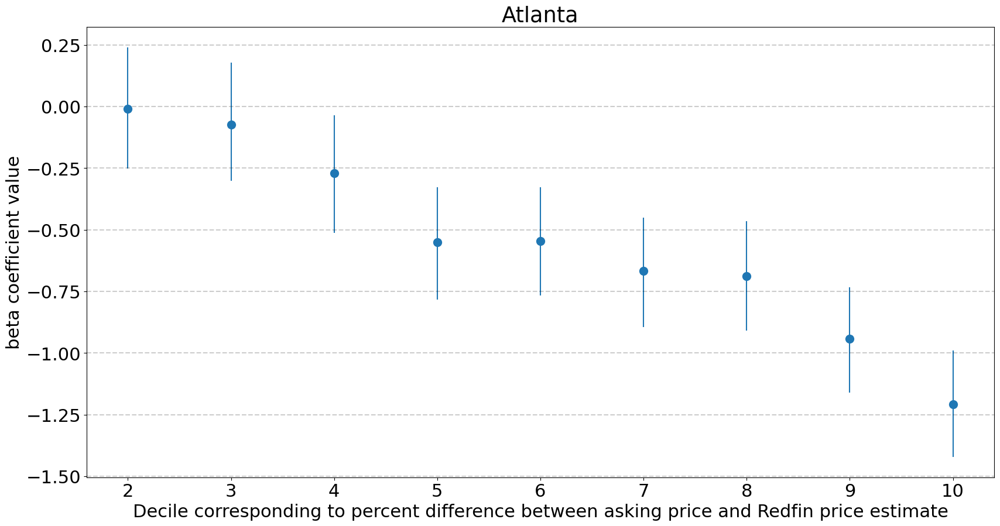

fraction of homes with null Redfin price estimate: 0.745


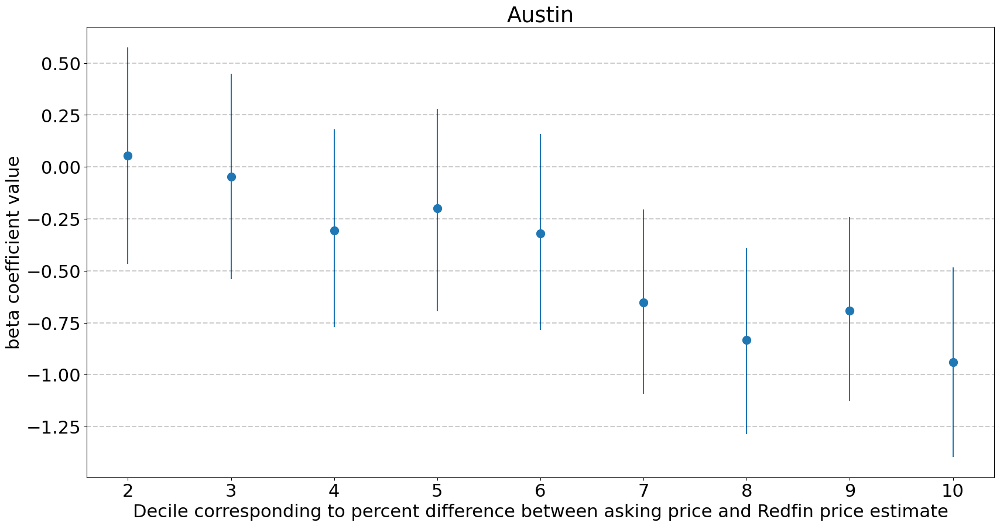

fraction of homes with null Redfin price estimate: 0.052


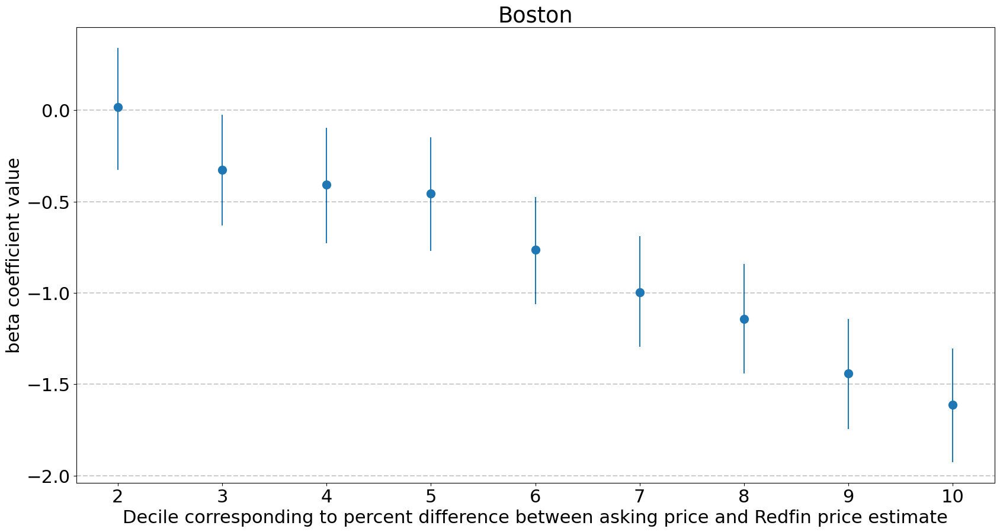

fraction of homes with null Redfin price estimate: 0.343


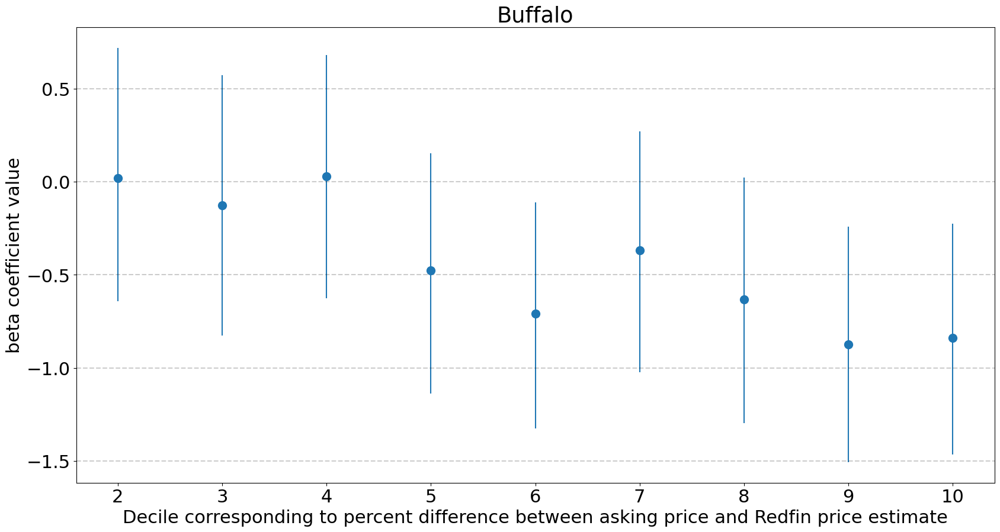

fraction of homes with null Redfin price estimate: 0.198


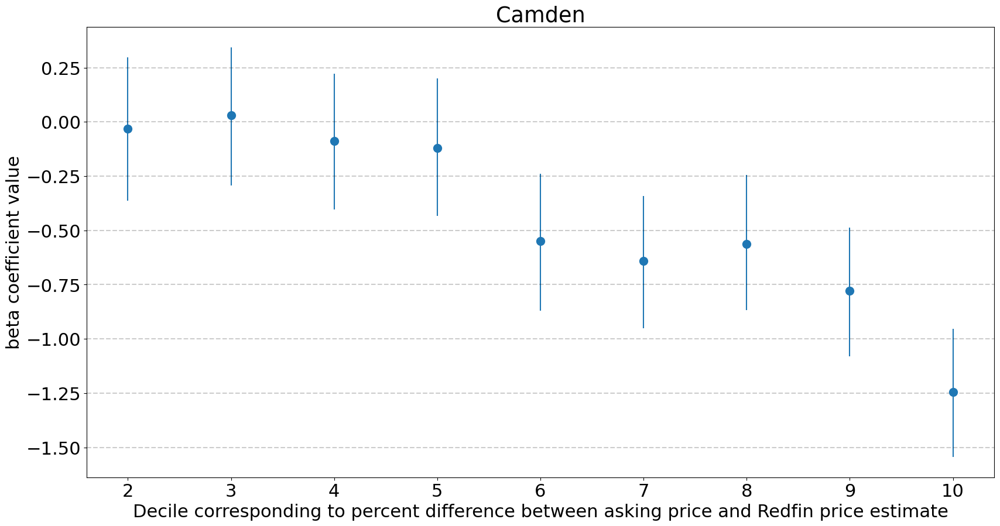

fraction of homes with null Redfin price estimate: 0.714


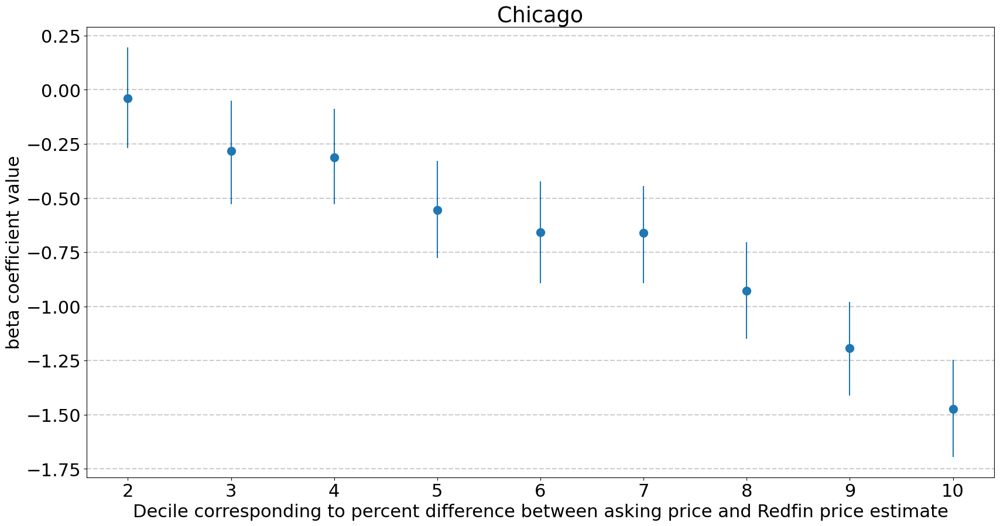

fraction of homes with null Redfin price estimate: 0.008


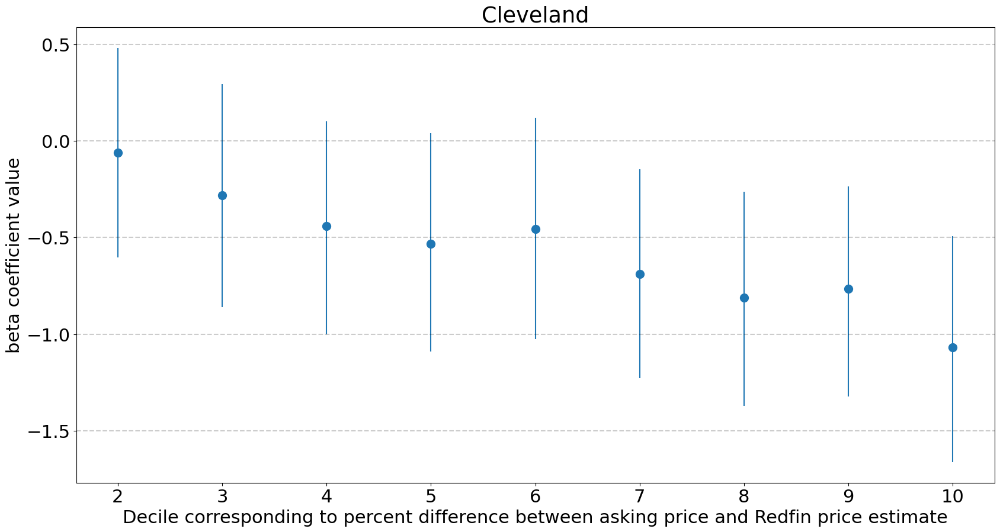

fraction of homes with null Redfin price estimate: 0.916


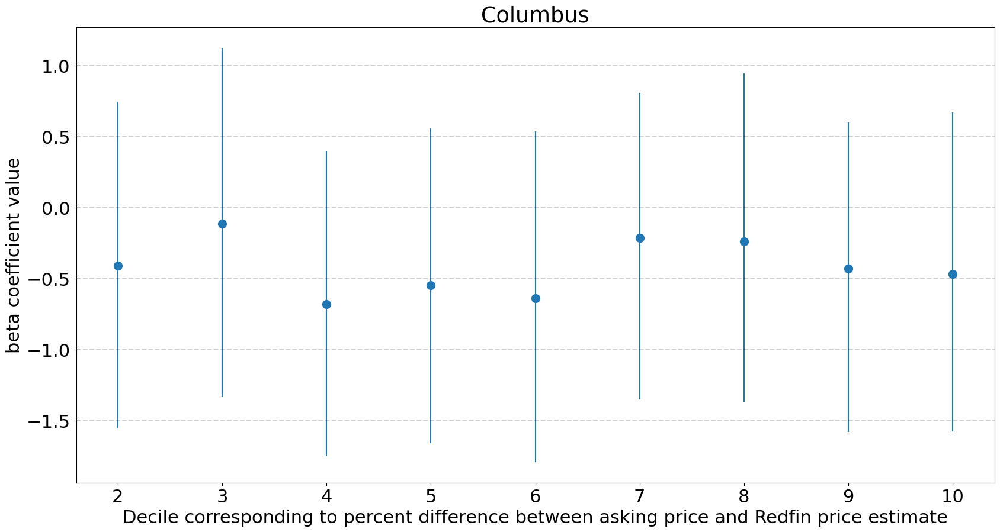

fraction of homes with null Redfin price estimate: 0.185


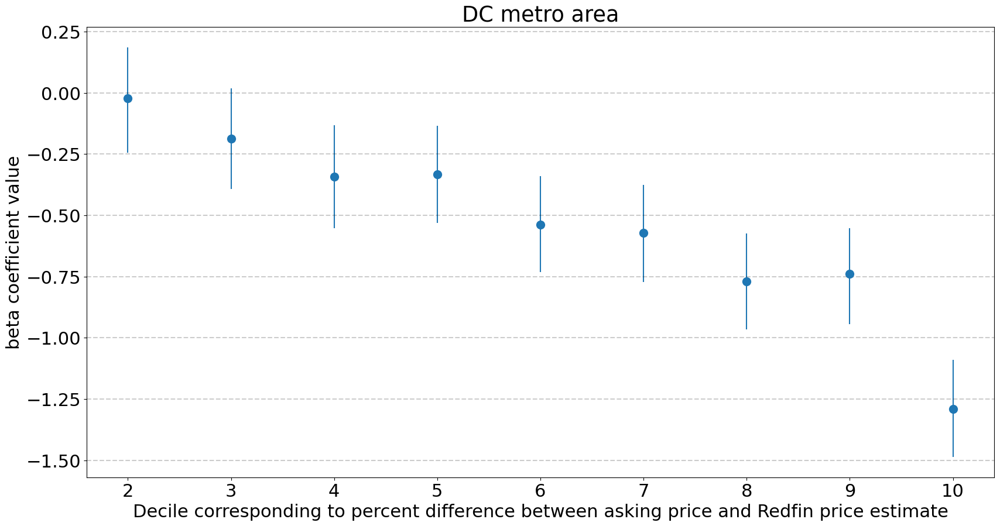

fraction of homes with null Redfin price estimate: 0.303


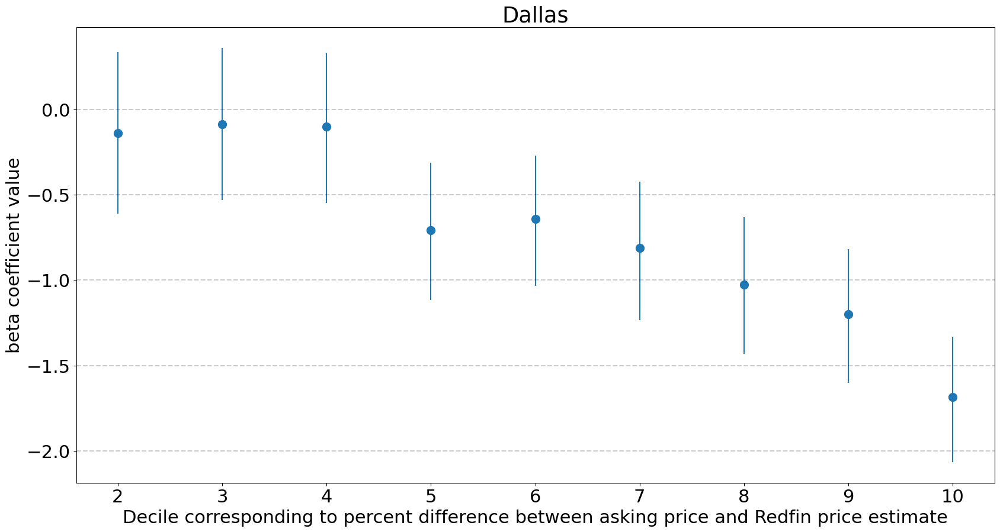

fraction of homes with null Redfin price estimate: 0.145


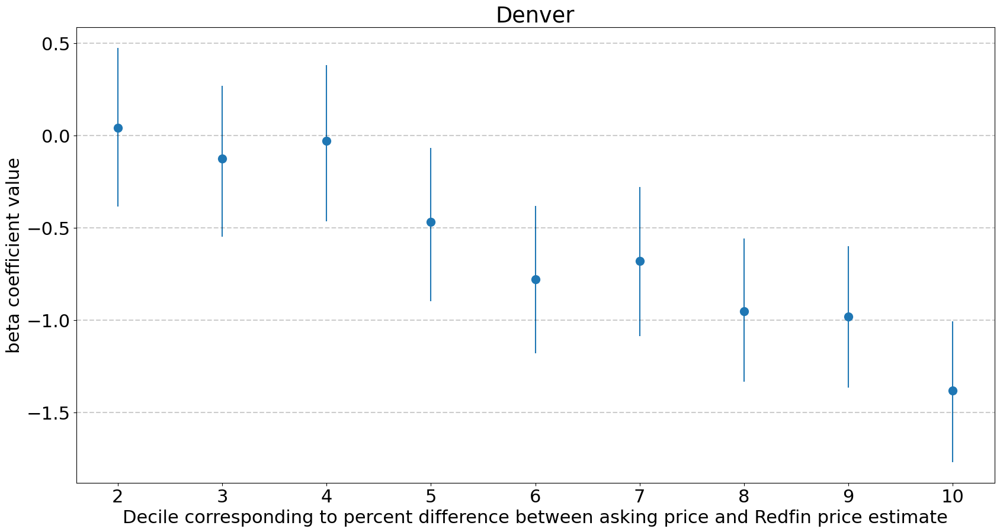

fraction of homes with null Redfin price estimate: 0.229


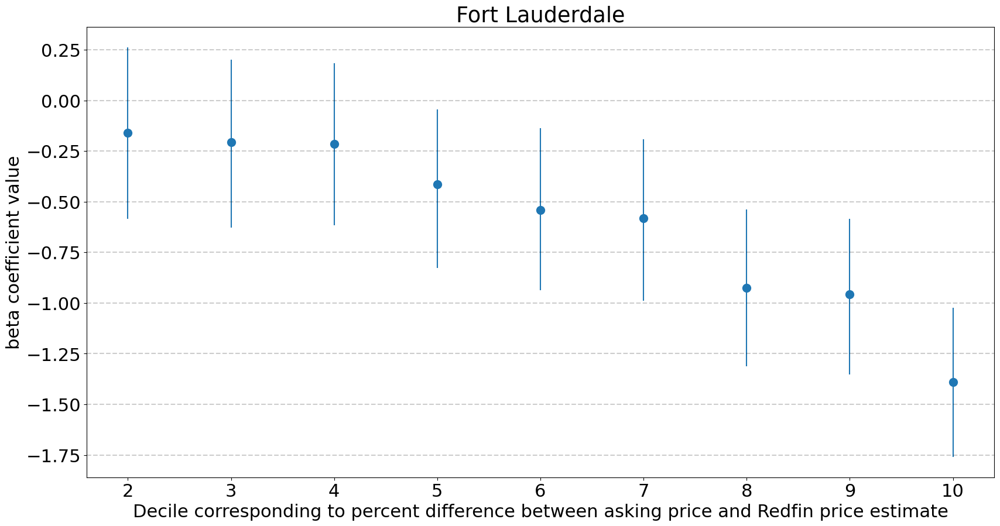

fraction of homes with null Redfin price estimate: 0.363


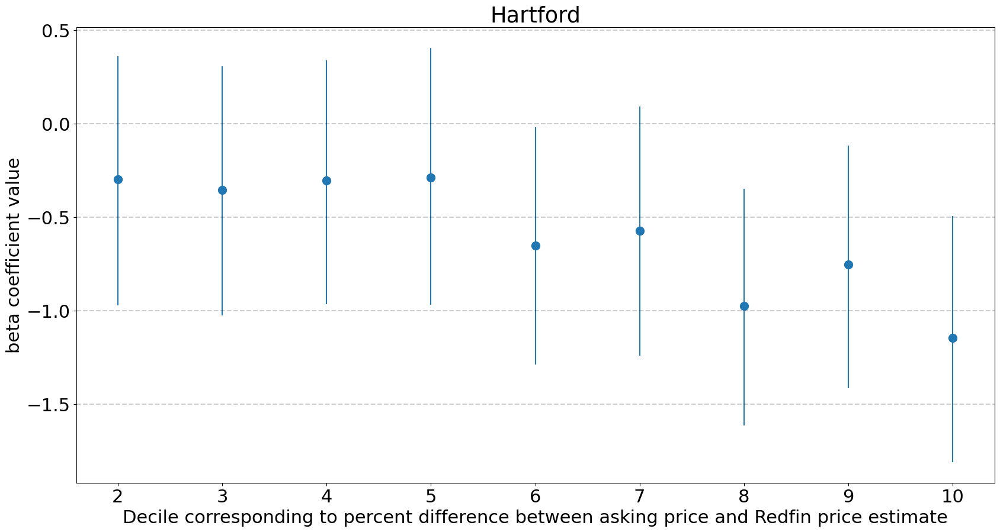

fraction of homes with null Redfin price estimate: 0.051


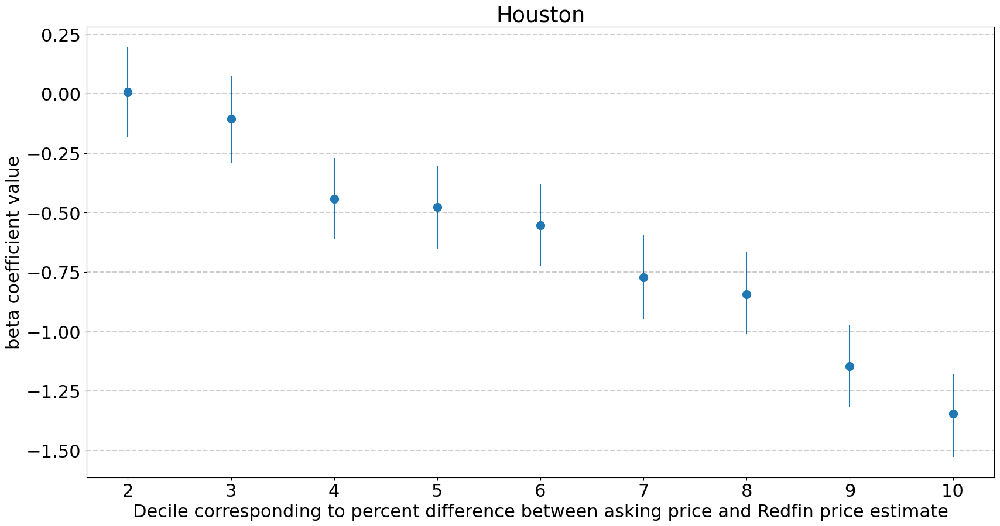

fraction of homes with null Redfin price estimate: 0.736


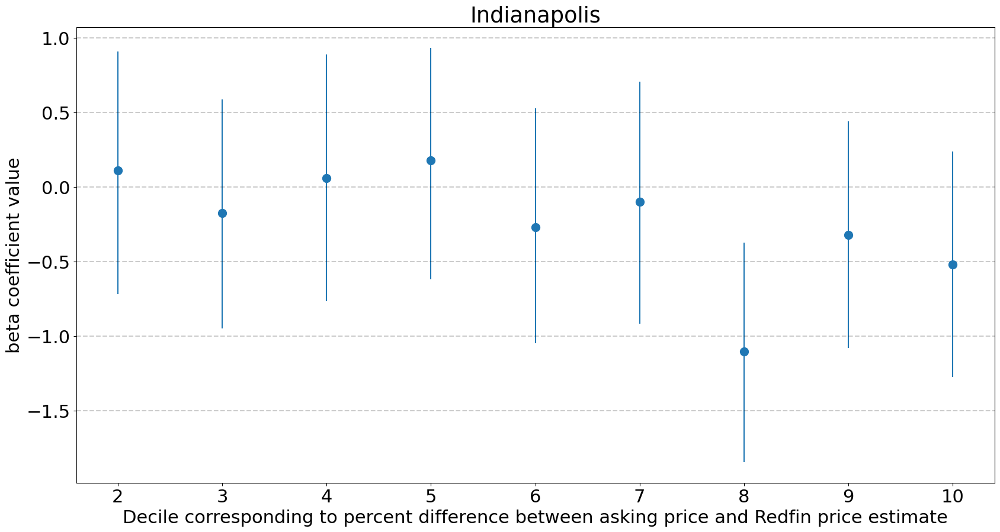

fraction of homes with null Redfin price estimate: 0.208


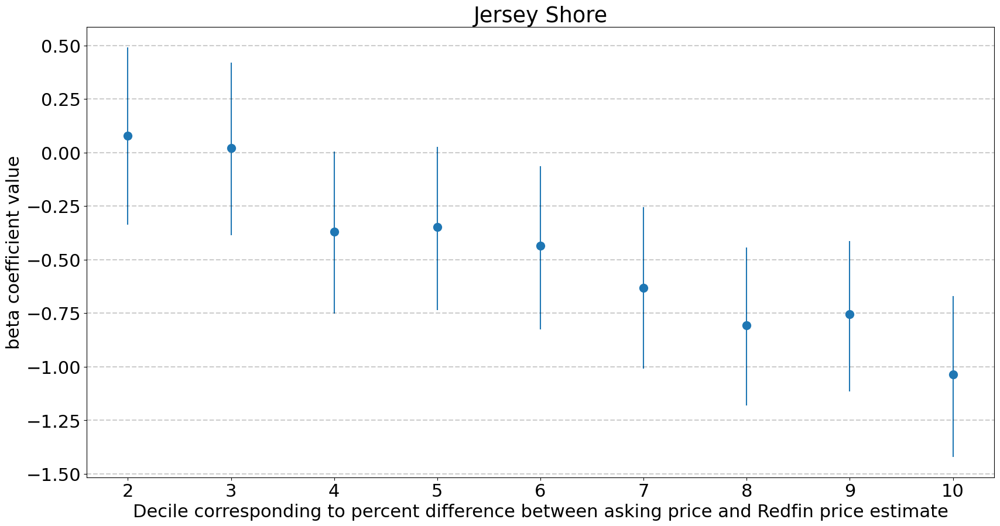

fraction of homes with null Redfin price estimate: 0.966


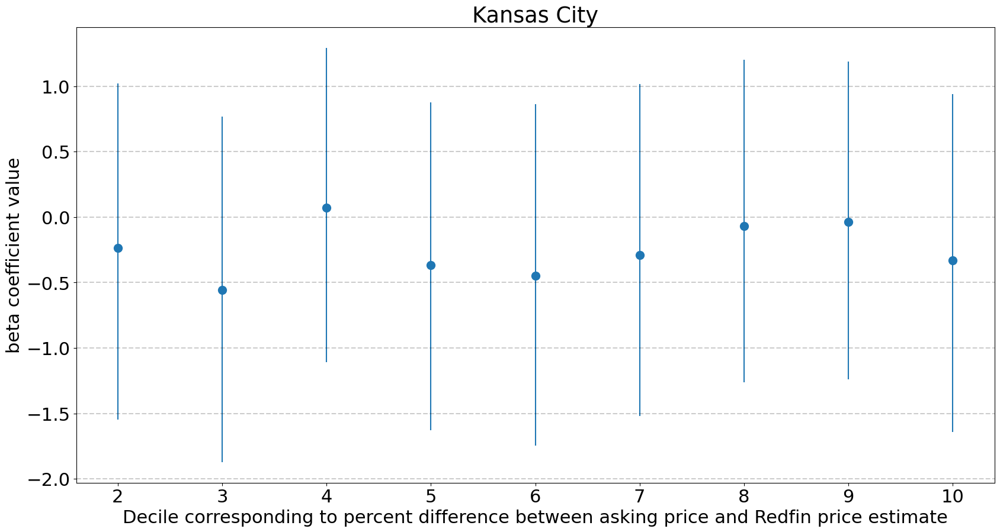

fraction of homes with null Redfin price estimate: 0.16


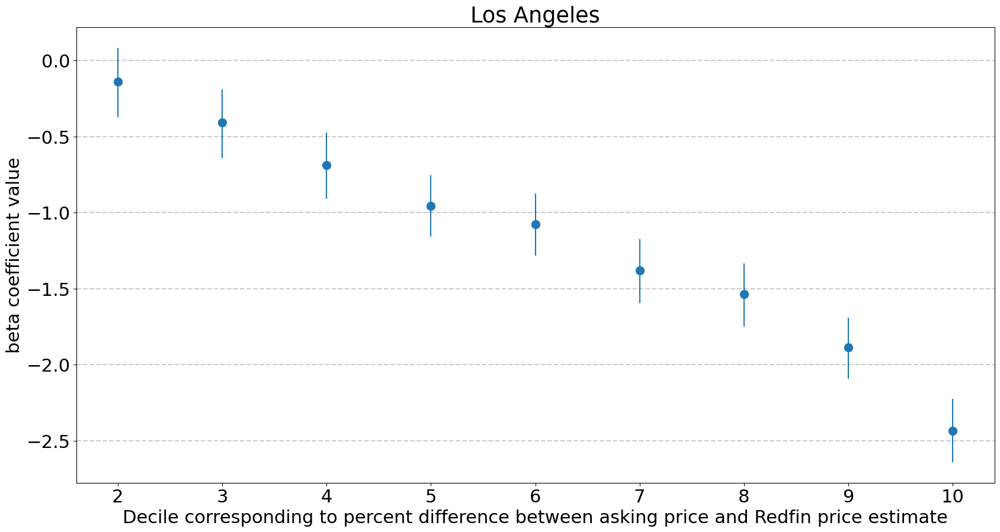

fraction of homes with null Redfin price estimate: 0.24


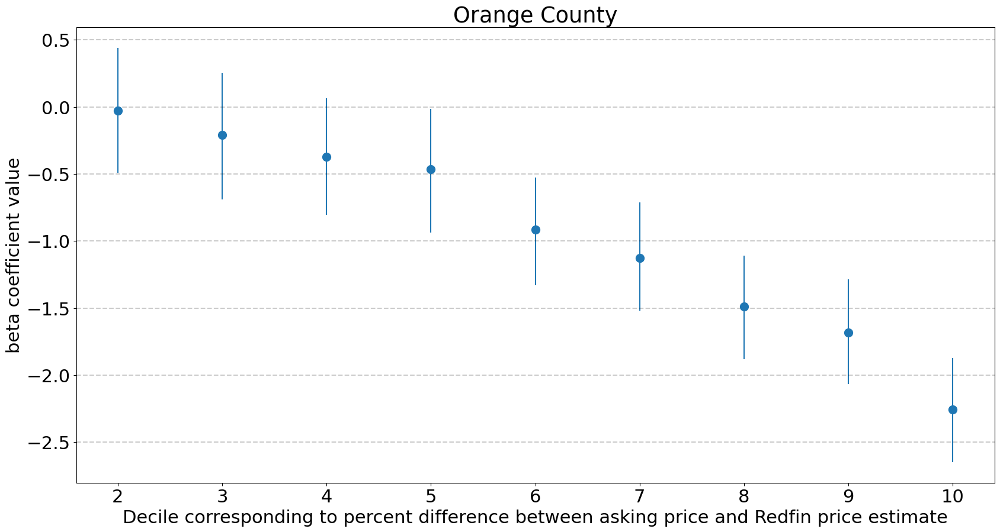

fraction of homes with null Redfin price estimate: 0.315


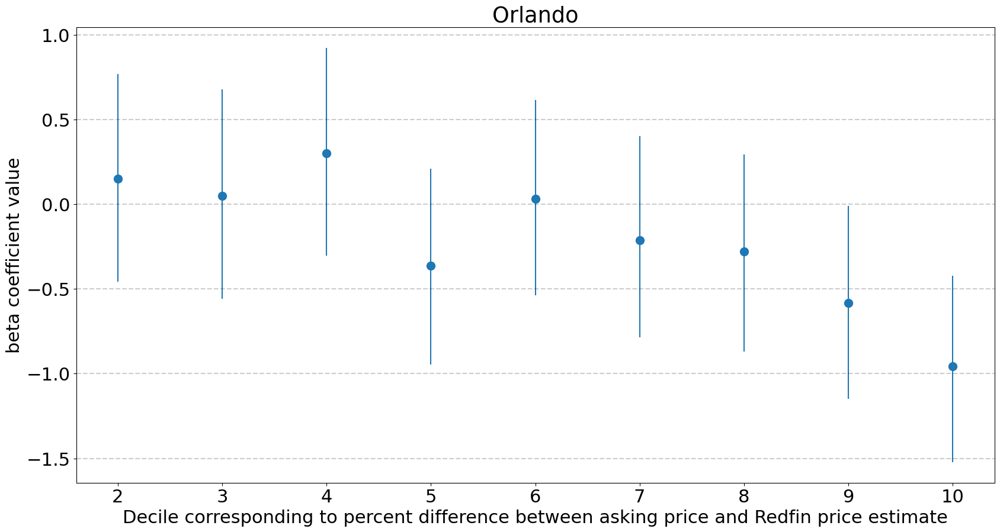

fraction of homes with null Redfin price estimate: 0.133


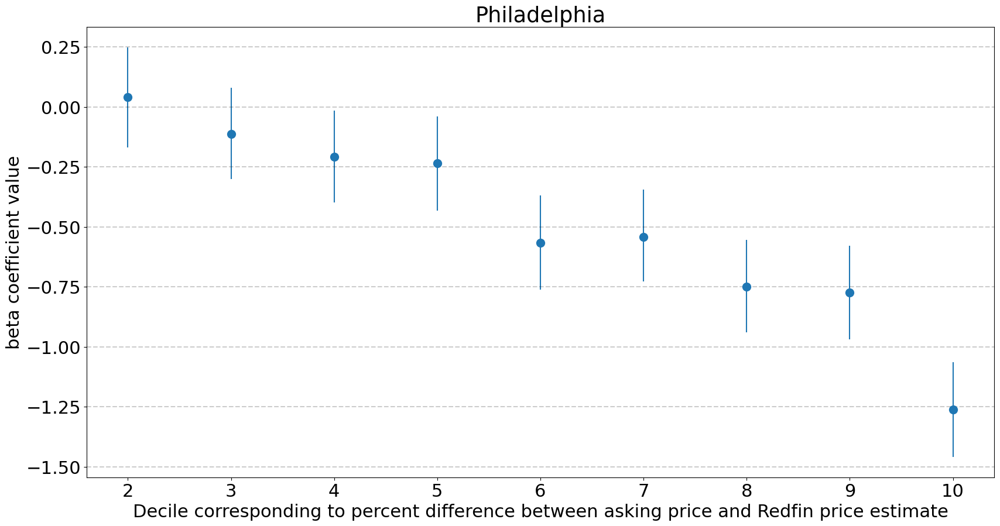

fraction of homes with null Redfin price estimate: 0.958


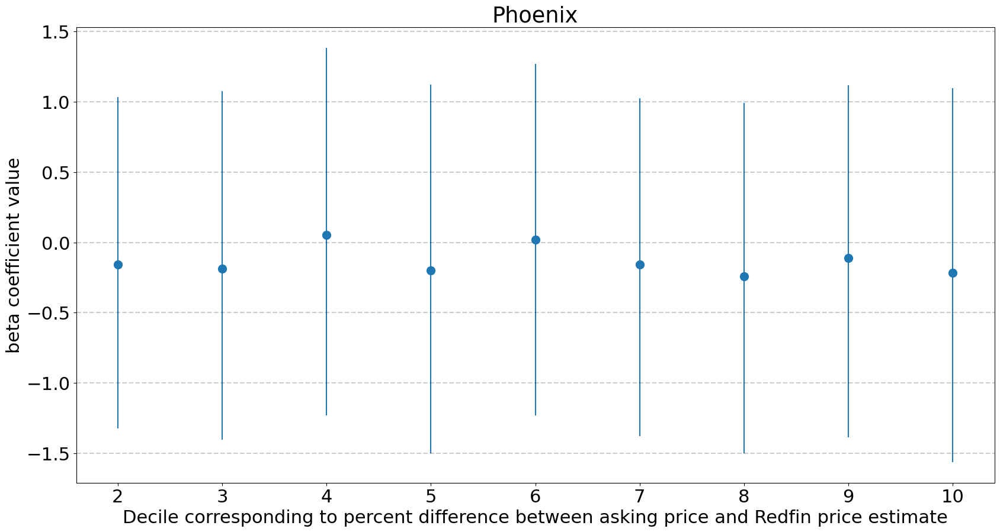

fraction of homes with null Redfin price estimate: 0.009


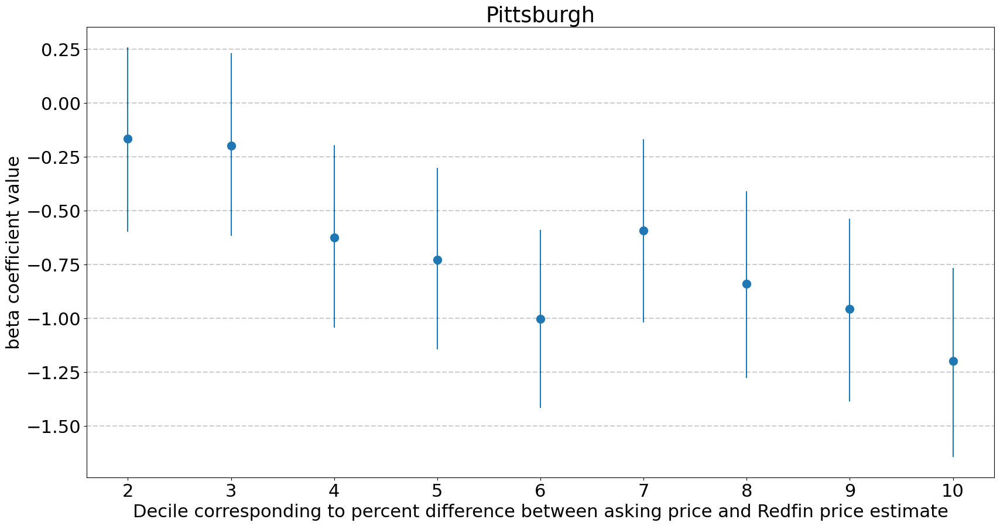

fraction of homes with null Redfin price estimate: 0.264


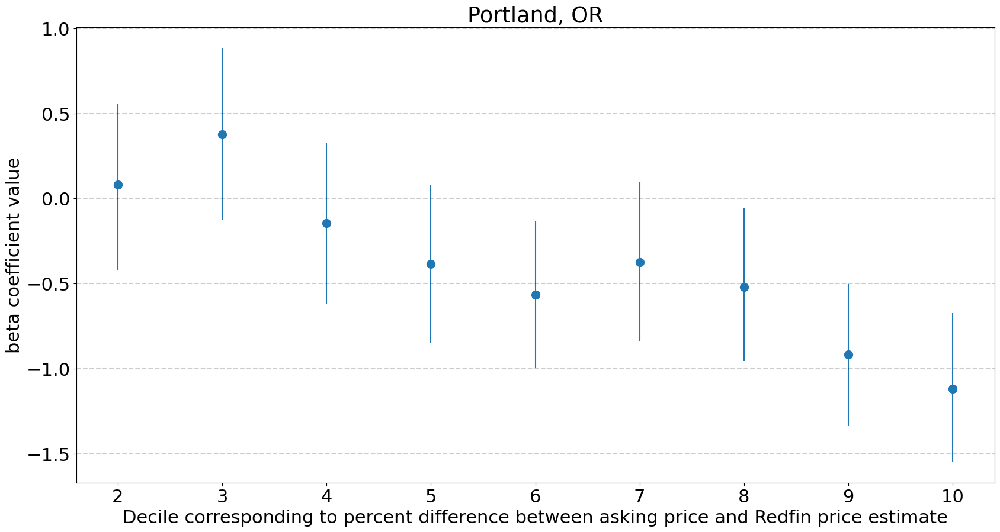

fraction of homes with null Redfin price estimate: 0.313


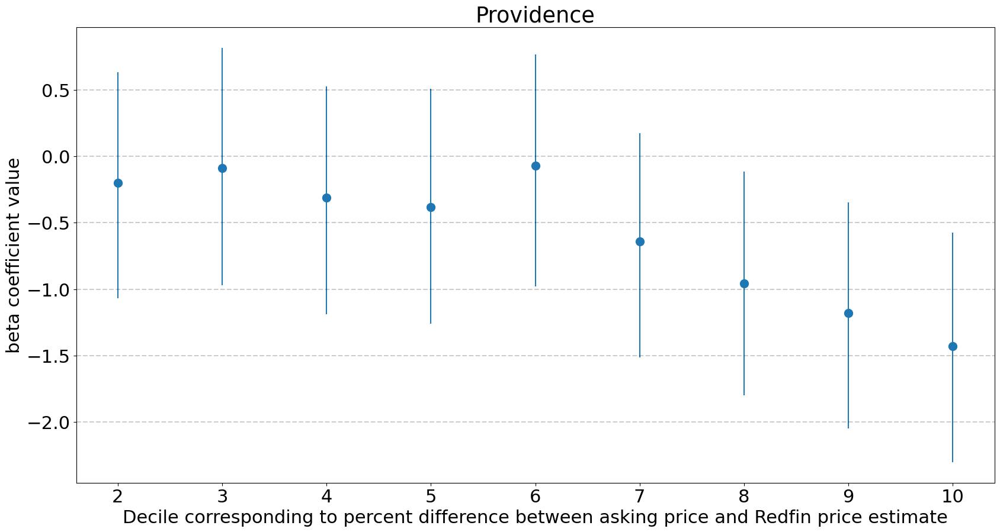

fraction of homes with null Redfin price estimate: 0.461


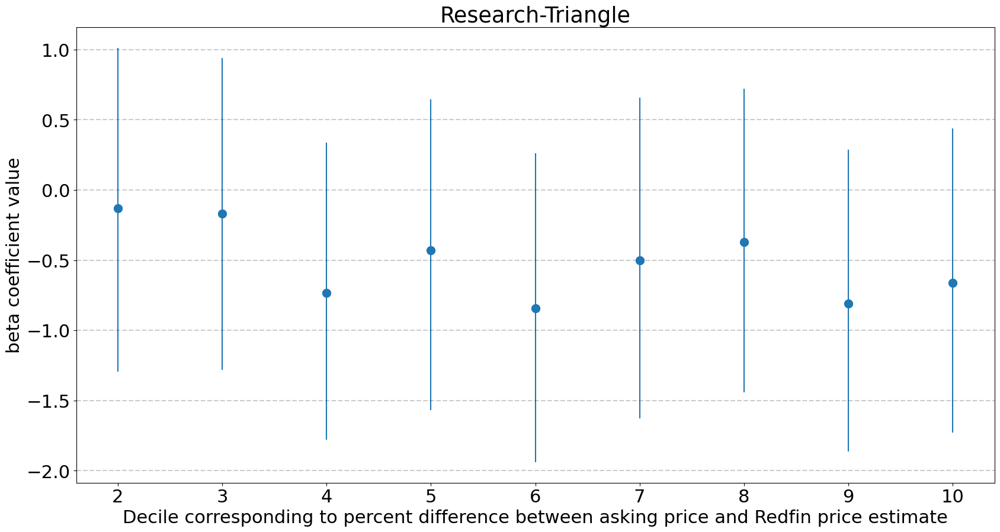

fraction of homes with null Redfin price estimate: 0.221


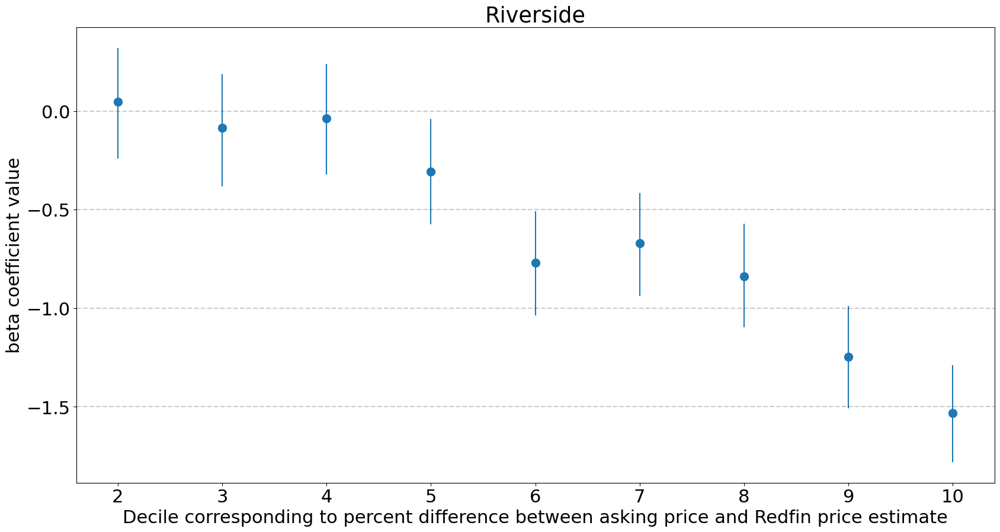

fraction of homes with null Redfin price estimate: 0.675


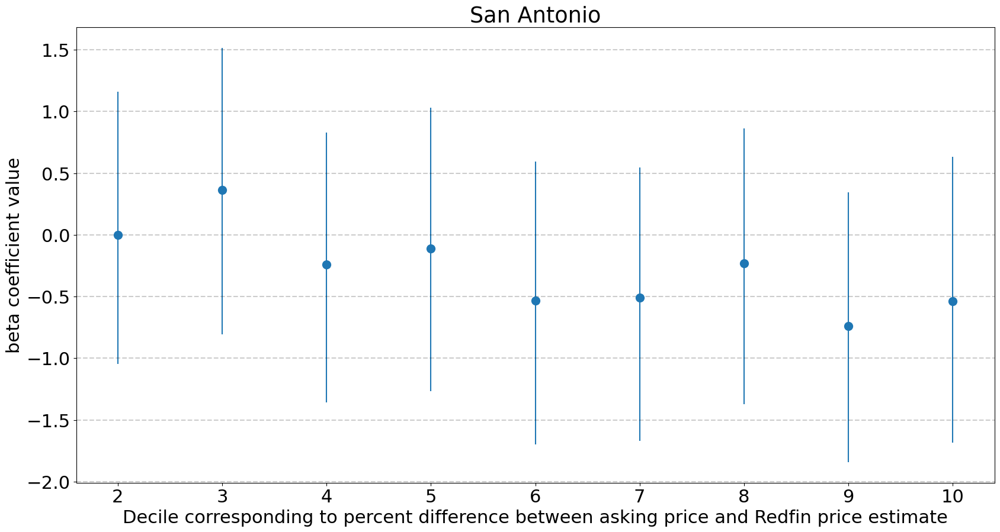

fraction of homes with null Redfin price estimate: 0.26


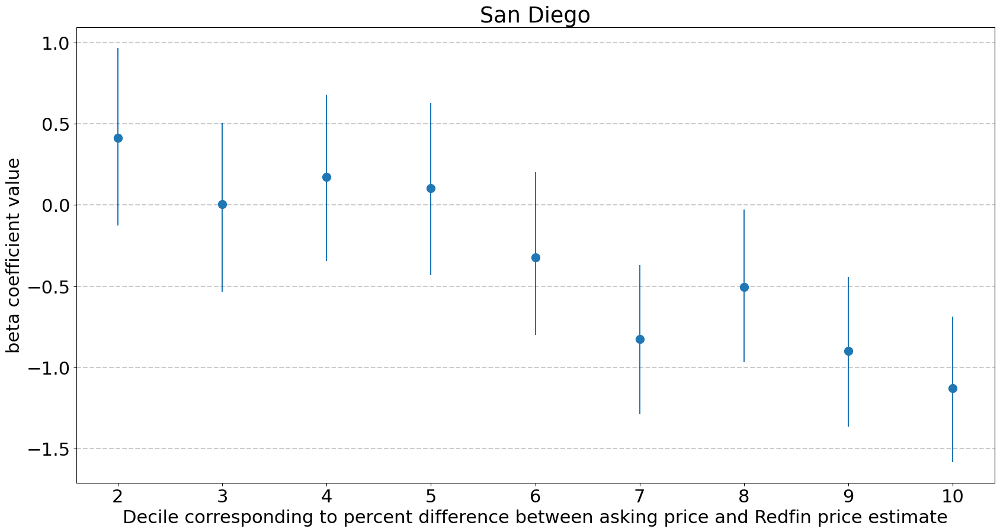

fraction of homes with null Redfin price estimate: 0.159


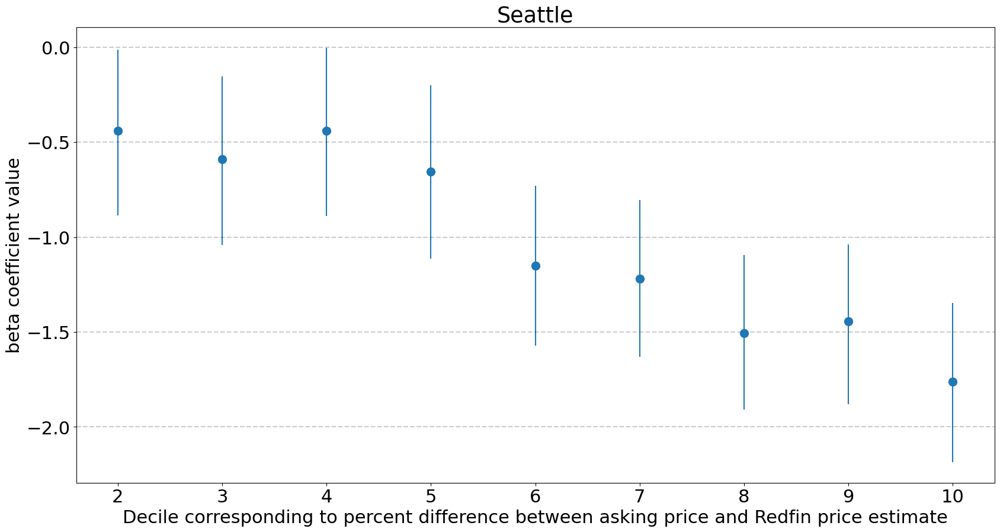

fraction of homes with null Redfin price estimate: 0.328


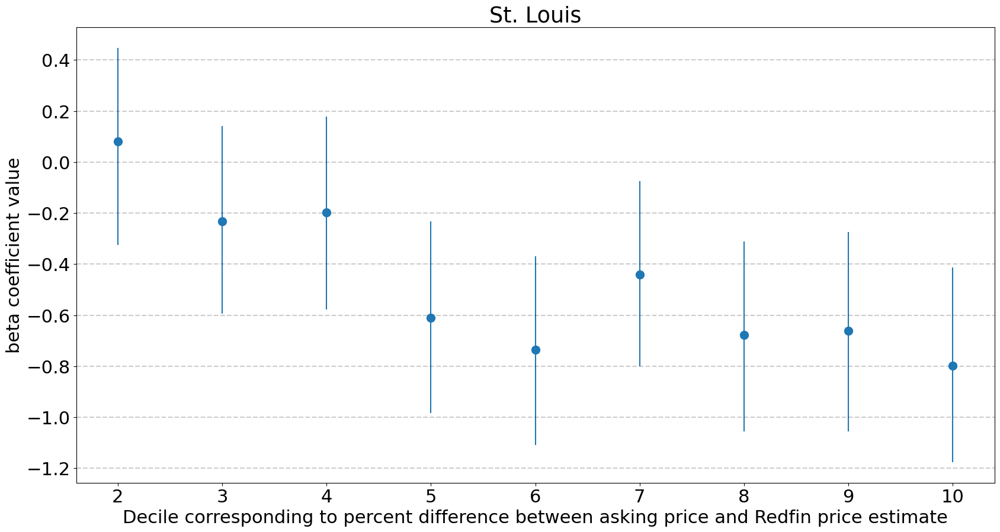

fraction of homes with null Redfin price estimate: 0.173


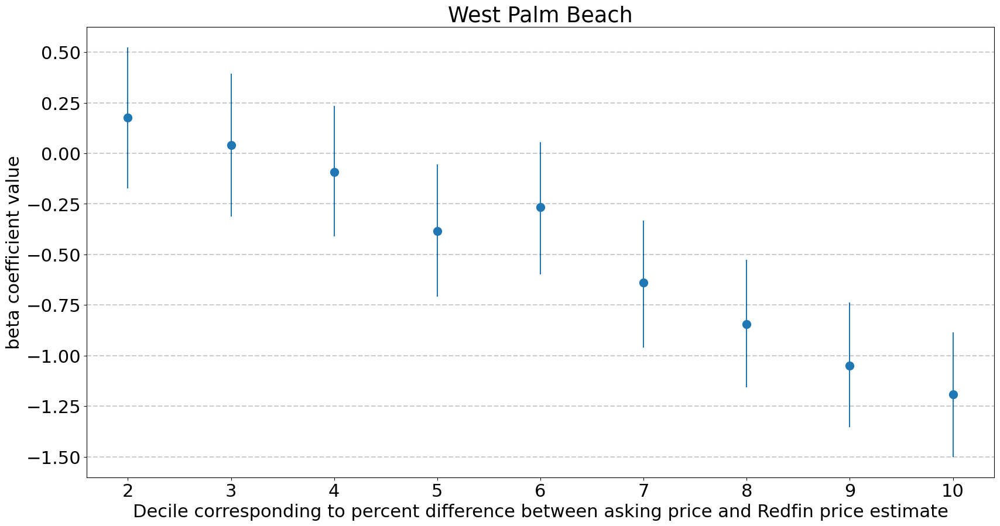

In [53]:
plot_effect_of_variables(
    'b_price_difference_pct', 
    x_label='Decile corresponding to percent difference between asking price and Redfin price estimate')

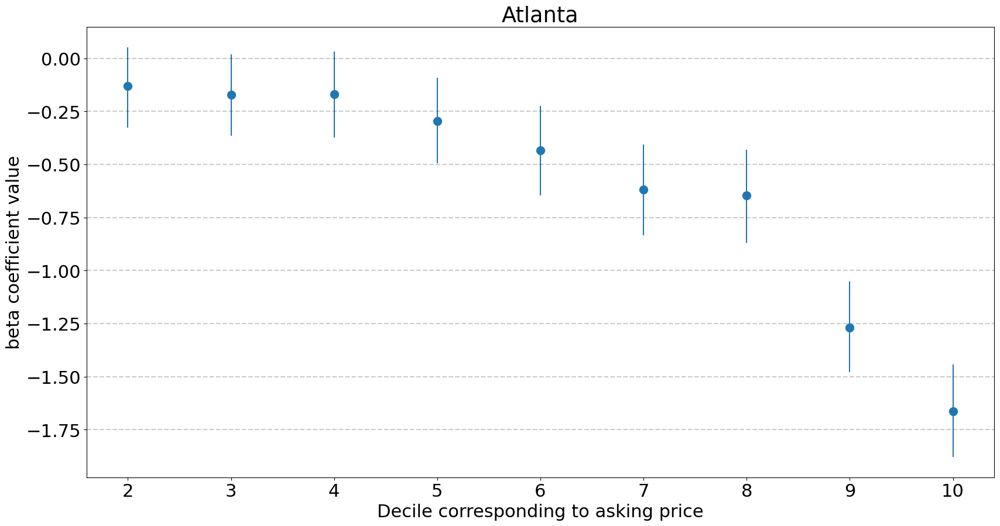

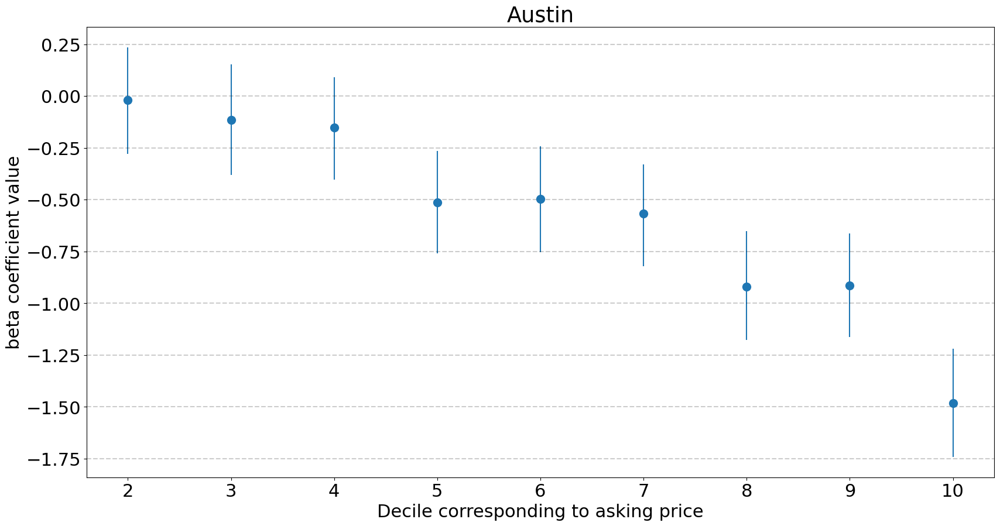

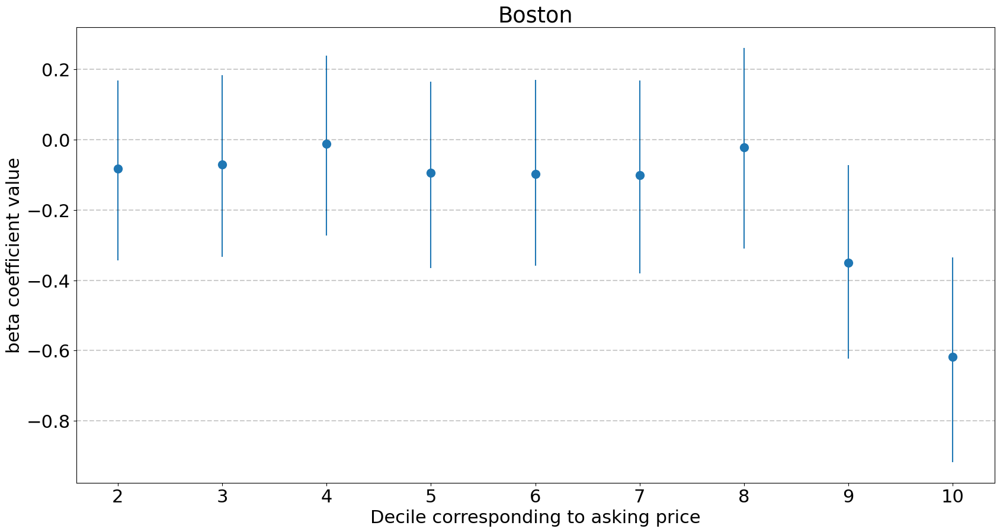

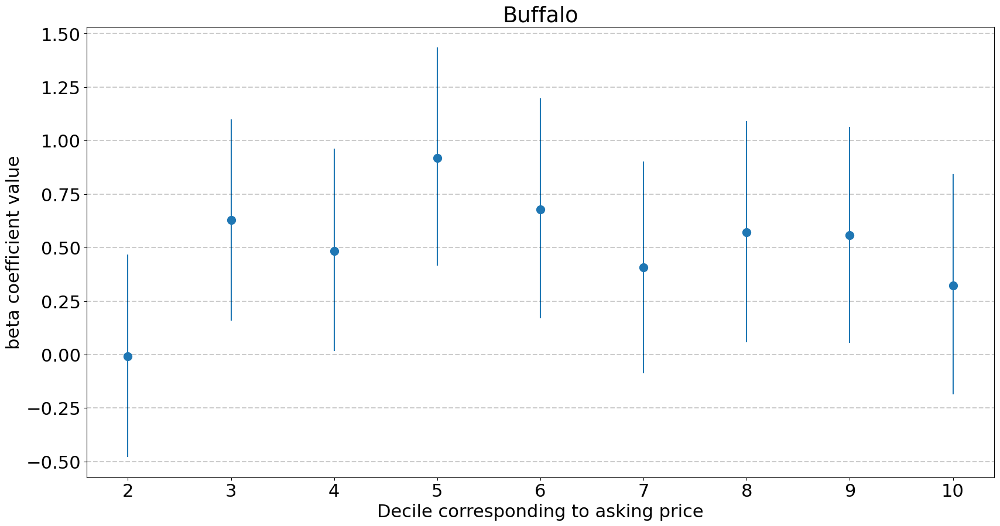

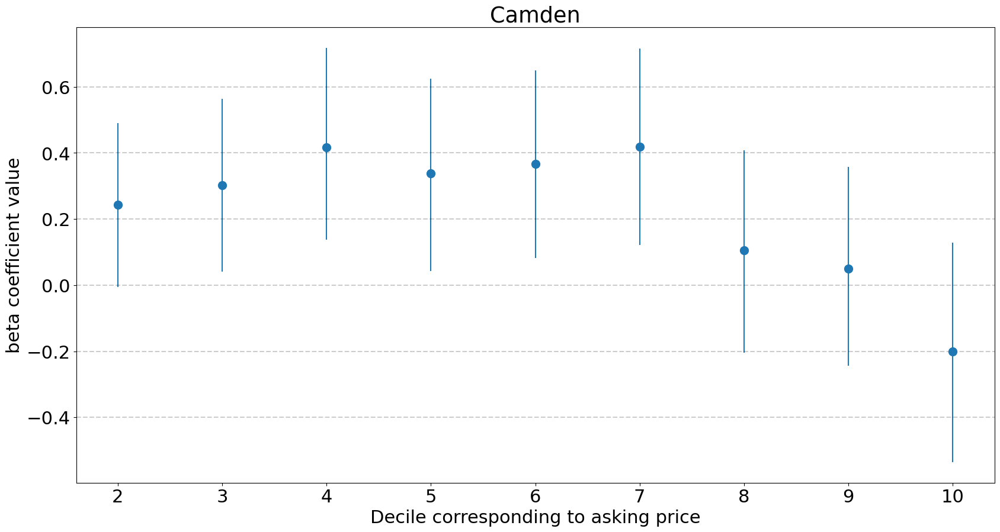

...

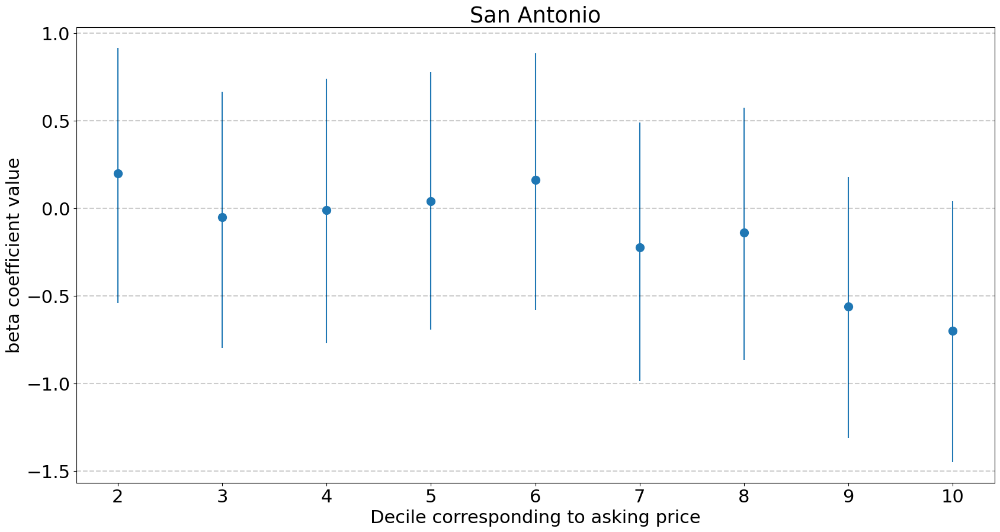

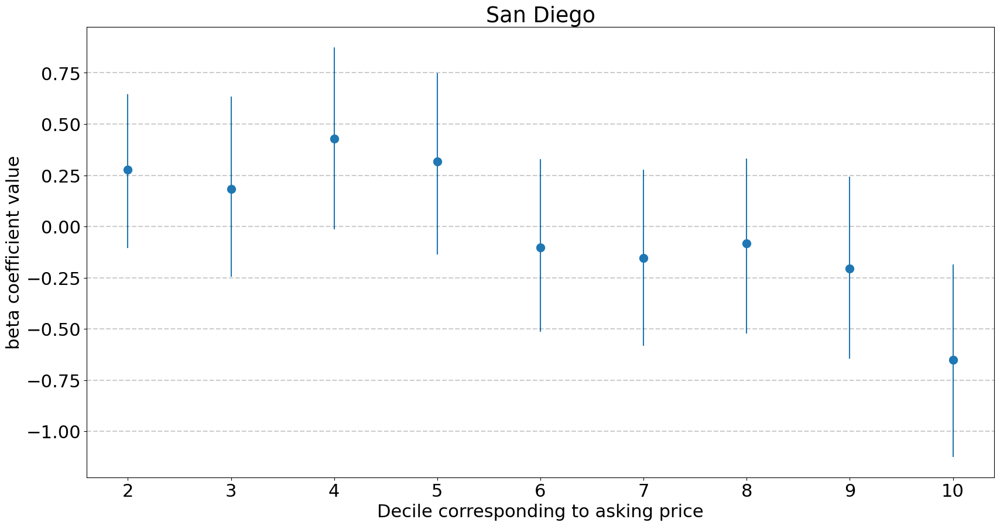

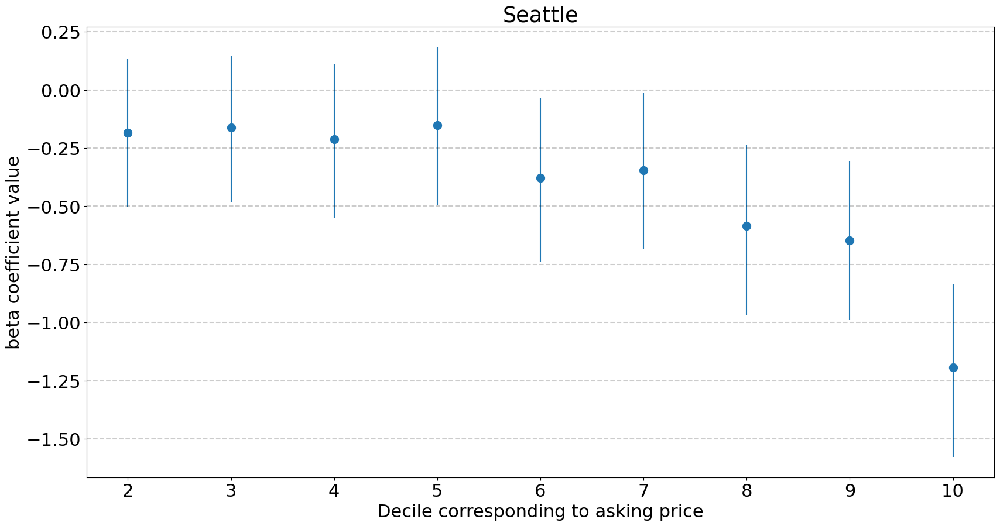

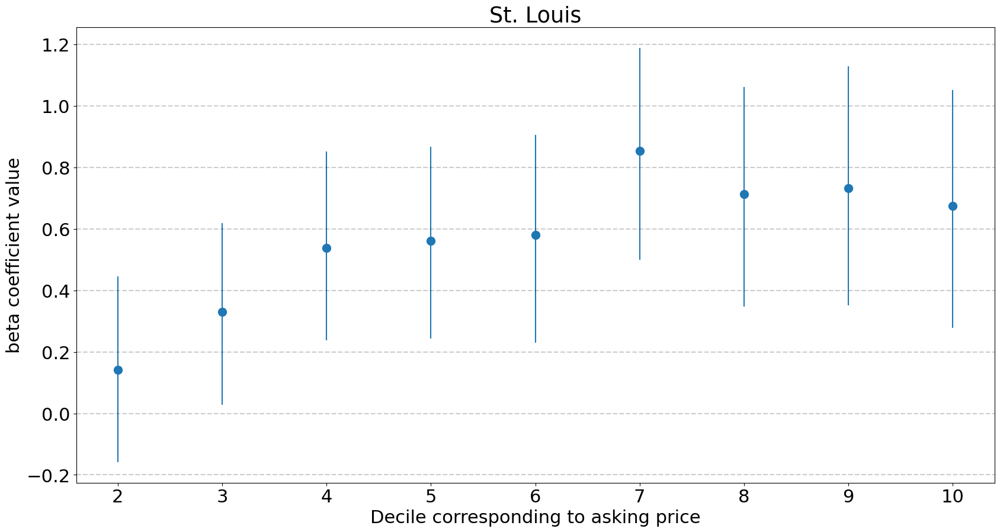

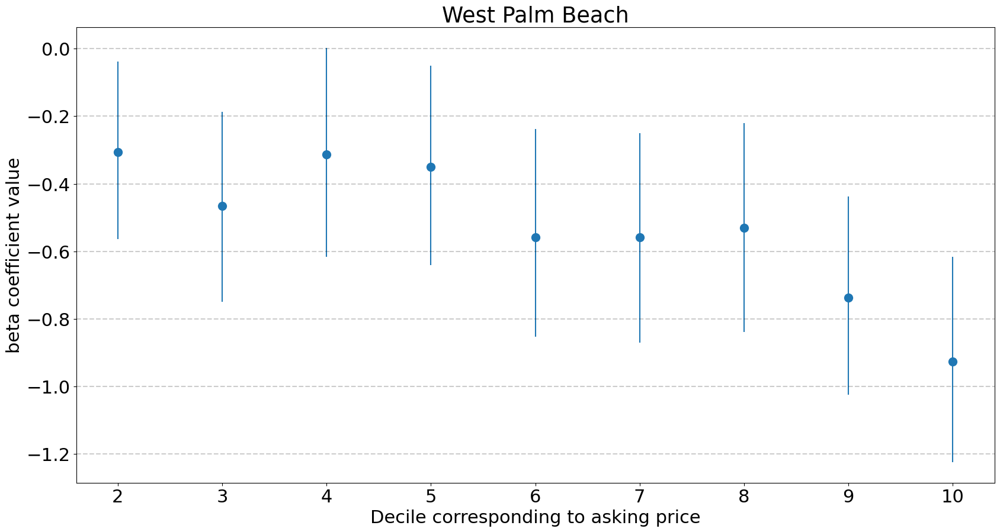

In [54]:
plot_effect_of_variables(
    'b_price', 
    x_label='Decile corresponding to asking price')

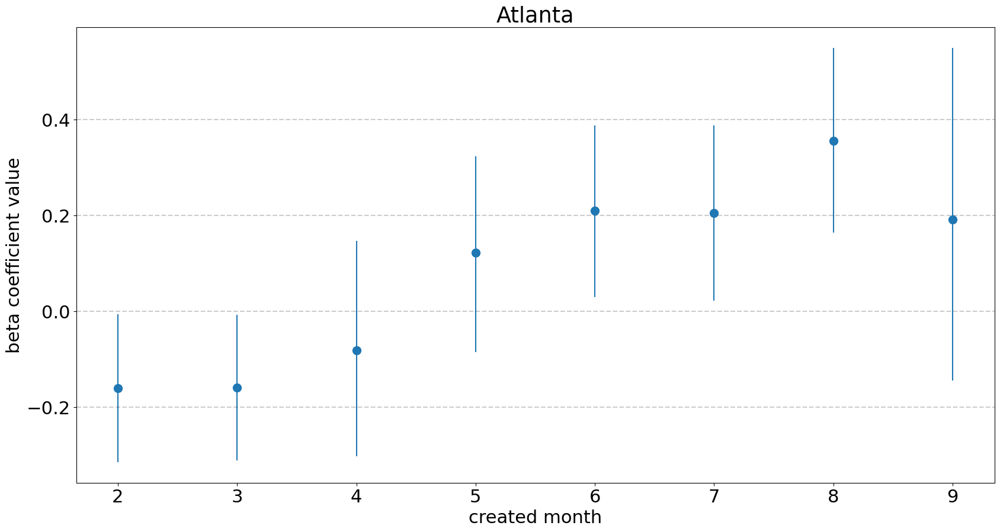

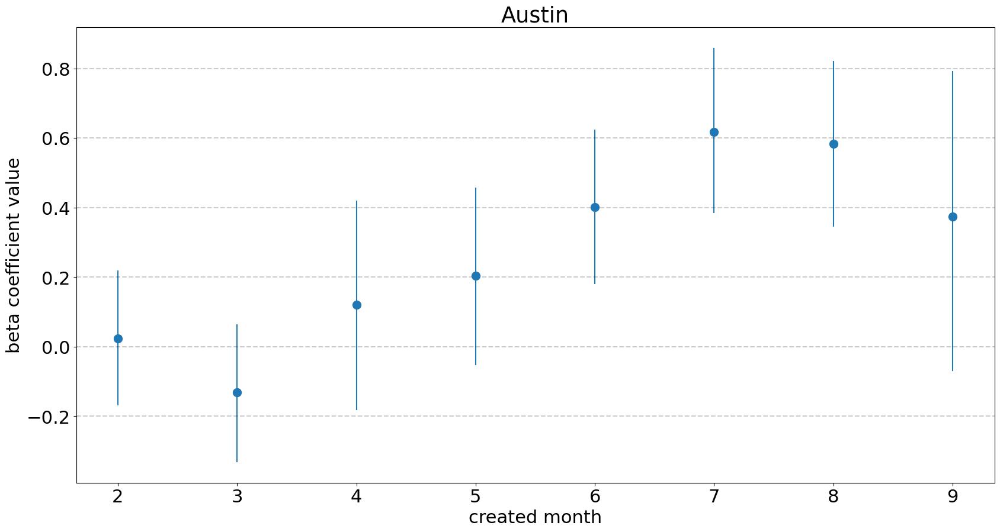

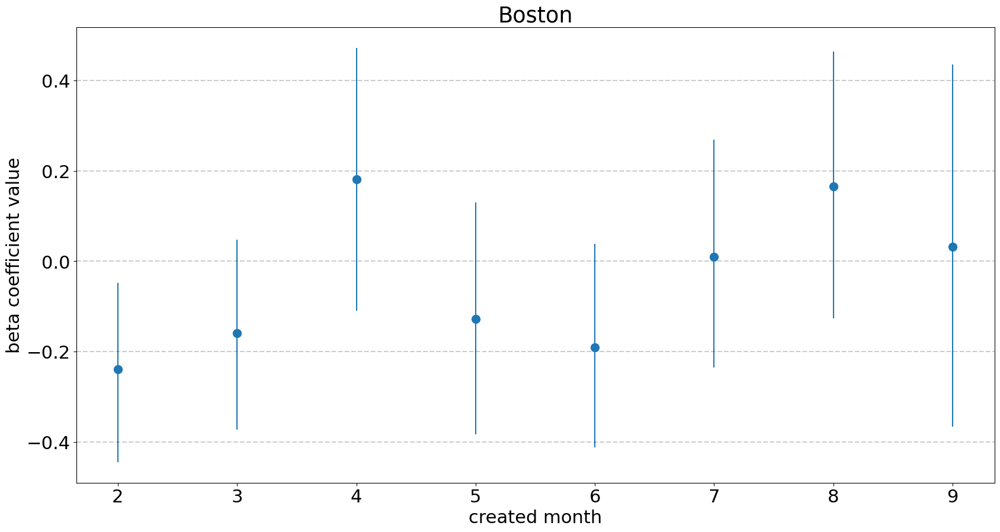

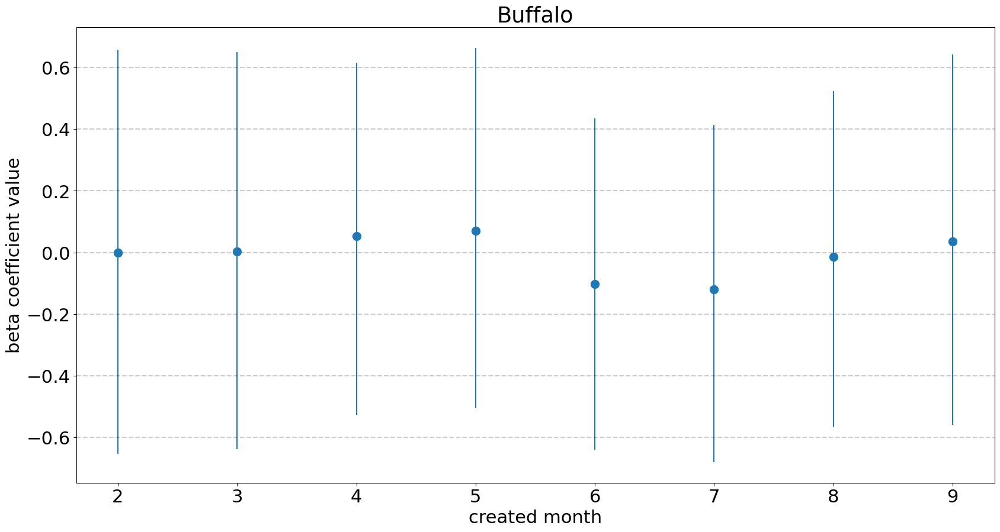

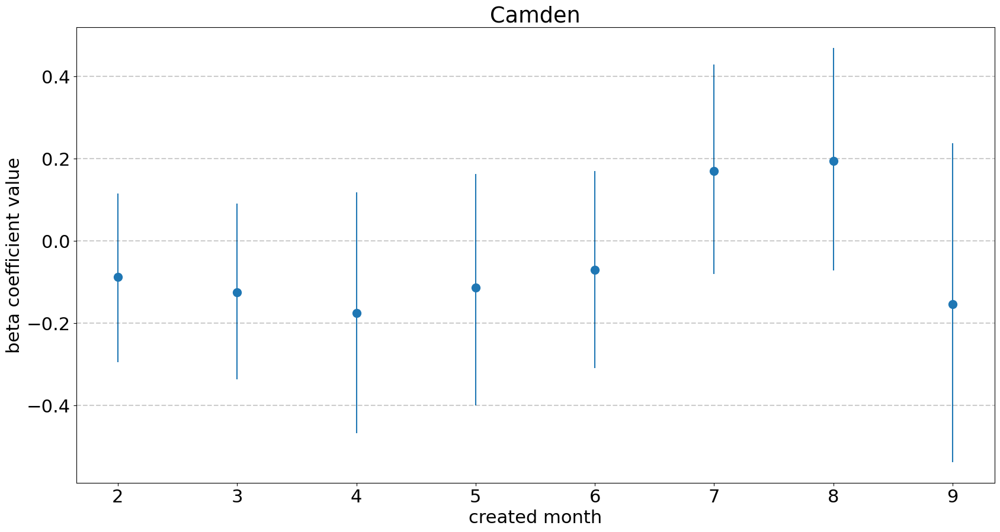

...

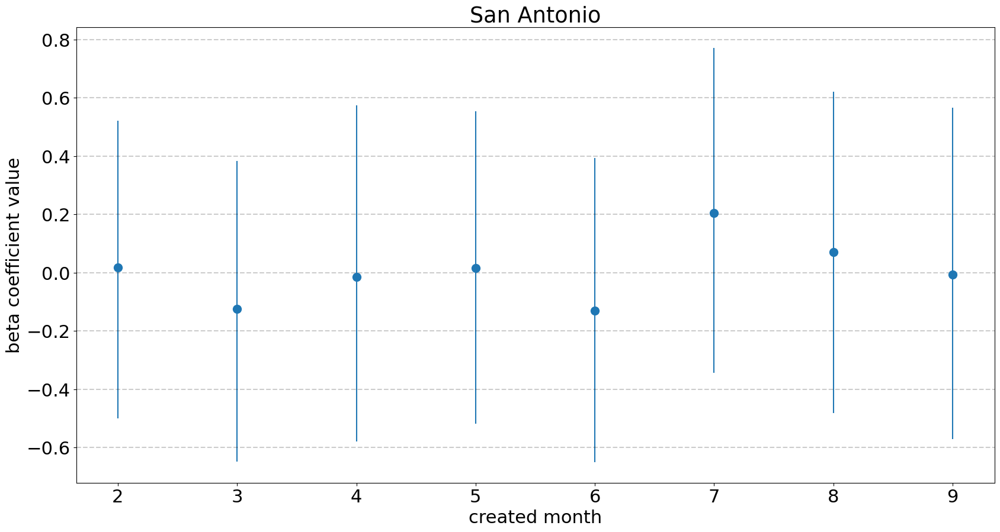

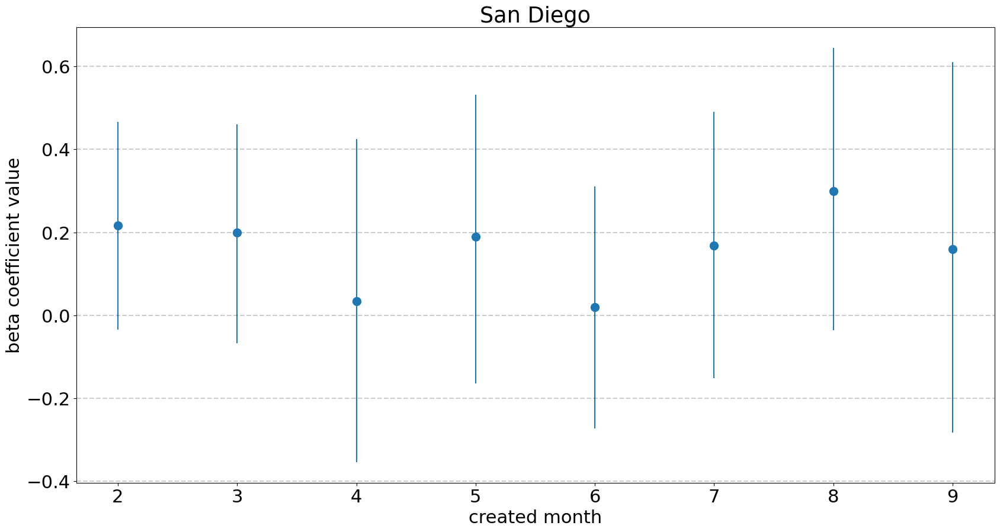

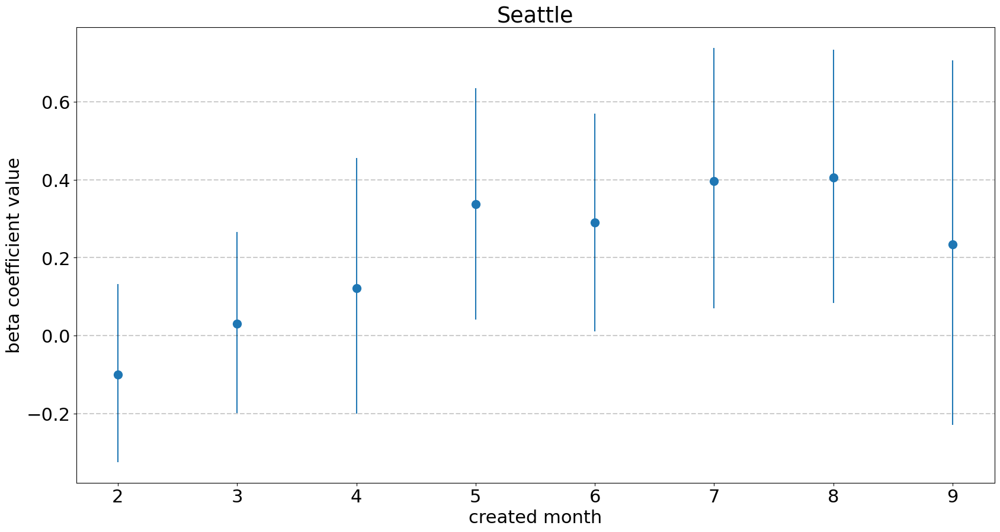

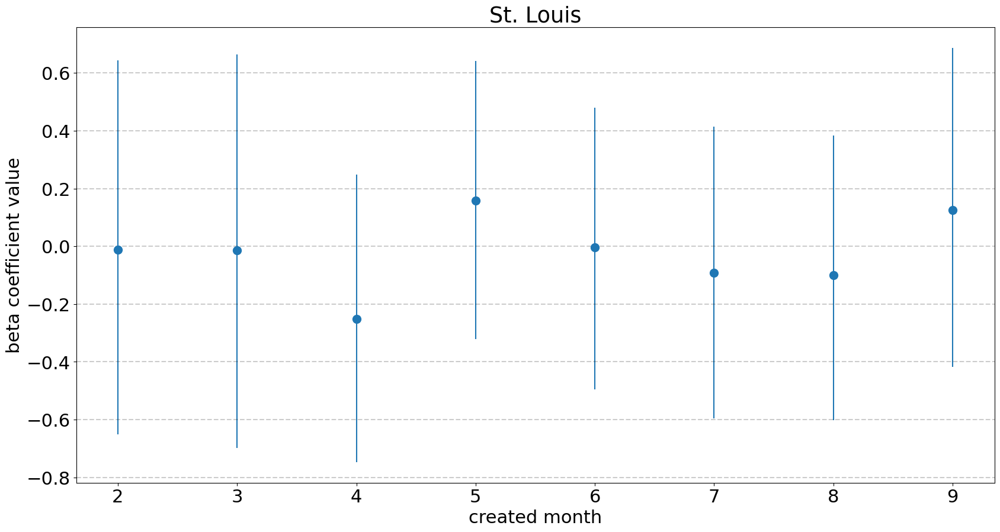

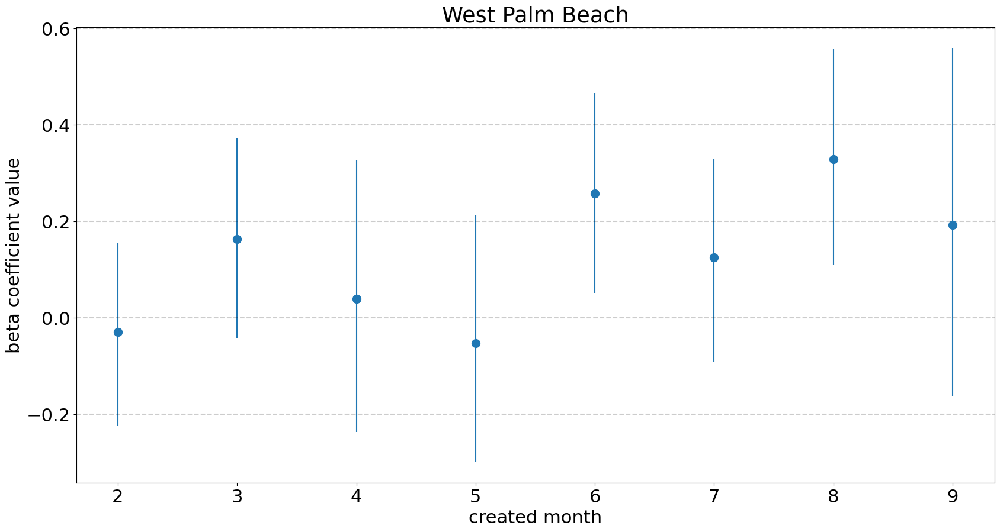

In [55]:
plot_effect_of_variables('b_created_month', 'created month')

## Limiting analysis to listings represented by agents willing to offer low buyer's agent commissions

In [65]:
entire_df = final_df_f.drop(columns=['market_area_index'])

In [66]:
entire_df['unique_agent_identifier'] = (
    entire_df['agent_name'] + entire_df['brokerage'] + entire_df['market_area']
)

In [67]:
discount_agents = entire_df[
    entire_df['buyside_commission_range'] > 0]['unique_agent_identifier'].unique()

In [68]:
discount_agent_df = entire_df[entire_df['unique_agent_identifier'].isin(discount_agents)]

In [69]:
unique_agent_count = len(entire_df['unique_agent_identifier'].unique())
discount_agent_count = len(discount_agents)

print('number of unique agents:', unique_agent_count)
print('number of discount agents:', discount_agent_count)
print('fraction of agents that are discount agents:', round(discount_agent_count / unique_agent_count, 3))
print('fraction of listings represented by discount agents:', round(len(discount_agent_df) / len(entire_df), 3))

number of unique agents: 130534
number of discount agents: 22585
fraction of agents that are discount agents: 0.173
fraction of listings represented by discount agents: 0.231


In [70]:
discount_agent_df['buyside_commission_range'].value_counts() / len(discount_agent_df)

2    0.427799
0    0.302864
1    0.223018
3    0.046319
Name: buyside_commission_range, dtype: float64

In [71]:
market_area_value_counts = discount_agent_df['market_area'].value_counts()
market_area_value_counts

Los Angeles          12319
Chicago               6658
Atlanta               5433
Houston               3836
Dallas                3618
DC metro area         2686
Denver                2427
San Diego             1995
Austin                1990
Philadelphia          1580
Portland, OR          1556
West Palm Beach       1367
Camden                1206
Fort Lauderdale       1074
Riverside             1006
Indianapolis           915
Phoenix                648
Kansas City            631
Seattle                532
Orange County          476
Orlando                471
St. Louis              437
Buffalo                436
Cleveland              371
Columbus               326
Research-Triangle      265
Jersey Shore           240
Hartford               233
Boston                 206
Pittsburgh             154
San Antonio            154
Providence              23
Name: market_area, dtype: int64

In [72]:
# remove markets with very few listings
small_market_area_threshold = 100
small_market_areas = market_area_value_counts[market_area_value_counts < small_market_area_threshold].index
discount_agent_df_final = discount_agent_df[
    ~discount_agent_df['market_area'].isin(small_market_areas)]

In [73]:
sorted_market_areas = sorted(list(discount_agent_df_final['market_area'].unique()))

In [74]:
market_area_to_index_df = pd.DataFrame.from_dict({'market_area': sorted_market_areas})
market_area_to_index_df['market_area_index'] = market_area_to_index_df.index

market_area_num = len(market_area_to_index_df)

In [75]:
discount_agent_df_final = discount_agent_df_final.merge(
    market_area_to_index_df, on='market_area', how='inner')

In [76]:
home_sale_values = discount_agent_df_final['home_sold'].to_numpy()
market_area_indices = discount_agent_df_final['market_area_index'].to_numpy()

In [77]:
commission_vals = discount_agent_df_final['buyside_commission_range'].nunique()
created_month_vals = discount_agent_df_final['created_month_index'].nunique()
property_category_vals = discount_agent_df_final['property_category_index'].nunique()

In [78]:
sigma_prior = 1000

np.random.seed(5555)
with pm.Model() as discount_model:
    mu_comm = pm.Normal('mu_comm', mu=0, sigma=100, shape=commission_vals)
    sigma_comm = pm.Exponential('sigma_comm', lam=0.001, shape=commission_vals)
    comm_offset = pm.Normal('comm_offset', mu=0, sigma=1, shape=(market_area_num, commission_vals))
    b_comm = pm.Deterministic('b_comm', mu_comm + comm_offset * sigma_comm)
    
    sigma_b = pm.Exponential('sigma_b', lam=0.001, shape=14)

    b_intercept = pm.Normal('b_intercept', mu=0, sigma=sigma_b[0], shape=market_area_num)
    b_hoa = pm.Normal('b_hoa', mu=0, sigma=sigma_b[1], shape=market_area_num)
    
    b_opendoor = pm.Normal('b_opendoor', mu=0, sigma=sigma_b[2], shape=market_area_num)
    b_zillow = pm.Normal('b_zillow', mu=0, sigma=sigma_b[3], shape=market_area_num)
    b_offerpad = pm.Normal('b_offerpad', mu=0, sigma=sigma_b[4], shape=market_area_num)
    
    b_avg_views_5 = pm.Normal('b_avg_views_5', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_10 = pm.Normal('b_avg_views_10', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_30 = pm.Normal('b_avg_views_30', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_100 = pm.Normal('b_avg_views_100', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_200 = pm.Normal('b_avg_views_200', mu=0, sigma=sigma_prior, shape=market_area_num)
    
    b_null_price = pm.Normal('b_null_price', mu=0, sigma=sigma_b[5], shape=market_area_num)
    b_price = pm.Normal('b_price', mu=0, sigma=sigma_b[6], shape=(market_area_num, feature_to_n_bins['price']))
    b_beds = pm.Normal('b_beds', mu=0, sigma=sigma_b[7], shape=(market_area_num, feature_to_n_bins['beds']))
    b_baths = pm.Normal('b_baths', mu=0, sigma=sigma_b[8], shape=(market_area_num, feature_to_n_bins['baths']))
    b_sqft = pm.Normal('b_sqft', mu=0, sigma=sigma_b[9], shape=(market_area_num, feature_to_n_bins['sqft']))
    b_year_built = pm.Normal('b_year_built', mu=0, sigma=sigma_b[10], 
                             shape=(market_area_num, feature_to_n_bins['year_built']))
    b_price_difference_pct = pm.Normal('b_price_difference_pct', mu=0, sigma=sigma_b[11], 
                                       shape=(market_area_num, feature_to_n_bins['price_difference_pct']))
    b_property_category = pm.Normal('b_property_category', mu=0, sigma=sigma_b[12], 
                                    shape=(market_area_num, property_category_vals))
    b_created_month = pm.Normal('b_created_month', mu=0, sigma=sigma_b[13], 
                                shape=(market_area_num, created_month_vals))

    lin_pred_func = pm.Deterministic(
        'lin_pred_func', 
        b_intercept[market_area_indices] +
        b_comm[market_area_indices, discount_agent_df_final['buyside_commission_range'].values] +
        b_hoa[market_area_indices] * discount_agent_df_final['hoa'] + 
        b_opendoor[market_area_indices] * discount_agent_df_final['opendoor'] +
        b_zillow[market_area_indices] * discount_agent_df_final['zillow'] +
        b_offerpad[market_area_indices] * discount_agent_df_final['offerpad'] +
        b_avg_views_5[market_area_indices] * discount_agent_df_final['avg_views_5'] + 
        b_avg_views_10[market_area_indices] * discount_agent_df_final['avg_views_10'] + 
        b_avg_views_30[market_area_indices] * discount_agent_df_final['avg_views_30'] +
        b_avg_views_100[market_area_indices] * discount_agent_df_final['avg_views_100'] +
        b_avg_views_200[market_area_indices] * discount_agent_df_final['avg_views_200'] +
        b_null_price[market_area_indices] * discount_agent_df_final['null_redfin_price_estimate'] + 
        b_price[market_area_indices, discount_agent_df_final['price_range'].values] + 
        b_beds[market_area_indices, discount_agent_df_final['beds_range'].values] + 
        b_baths[market_area_indices, discount_agent_df_final['baths_range'].values] + 
        b_sqft[market_area_indices, discount_agent_df_final['sqft_range'].values] + 
        b_year_built[market_area_indices, discount_agent_df_final['year_built_range'].values] + 
        b_price_difference_pct[market_area_indices, 
                               discount_agent_df_final['price_difference_pct_range'].values] +  
        b_property_category[market_area_indices, discount_agent_df_final['property_category_index'].values] +
        b_created_month[market_area_indices, discount_agent_df_final['created_month_index'].values]
    ) 

    p = pm.math.invlogit(lin_pred_func)
    
    home_sold = pm.Bernoulli('home_sold', p=p, observed=home_sale_values)

In [79]:
rerun_discount_sampler = False

In [80]:
# load trace (note: refitting the model will take around 7.5 hours)
with discount_model:
    if rerun_discount_sampler:
        discount_trace = pm.sample(500, tune=1000, chains=4, target_accept=0.9, init='advi+adapt_diag', 
                                   n_init=50_000)
    else:
        discount_trace = pm.load_trace('discount_prob_of_sale_120_days_trace')

In [74]:
var_names = [
    'b_price_difference_pct', 'b_year_built', 'b_price', 'b_avg_views_5', 'b_avg_views_10', 'b_avg_views_30', 
    'b_avg_views_100', 'b_avg_views_200', 'b_created_month', 'sigma_b', 'b_null_price', 'b_hoa', 
    'b_intercept', 'b_opendoor', 'b_zillow', 'b_offerpad', 'b_beds', 'b_baths', 'b_sqft', 'b_property_category',
    'b_comm', 'sigma_comm', 'mu_comm'
]

with discount_model:
    discount_summary_df = pm.summary(discount_trace, var_names=var_names).round(4)

In [75]:
discount_summary_df['r_hat'].value_counts()

1.00    1811
1.01     397
1.02      14
1.13       6
1.12       5
1.16       3
1.10       3
1.11       3
1.17       2
1.14       2
1.08       2
1.03       1
1.05       1
1.20       1
1.19       1
1.30       1
1.15       1
Name: r_hat, dtype: int64

In [81]:
mu_comm_samples_discount = discount_trace['mu_comm']
going_rate_samples_discount = mu_comm_samples_discount[:, 0]

90.0% credible interval: [0.81654576 1.04814758]
p value based on samples: 0.1515
p value based on normal distribution: 0.16216064616857728


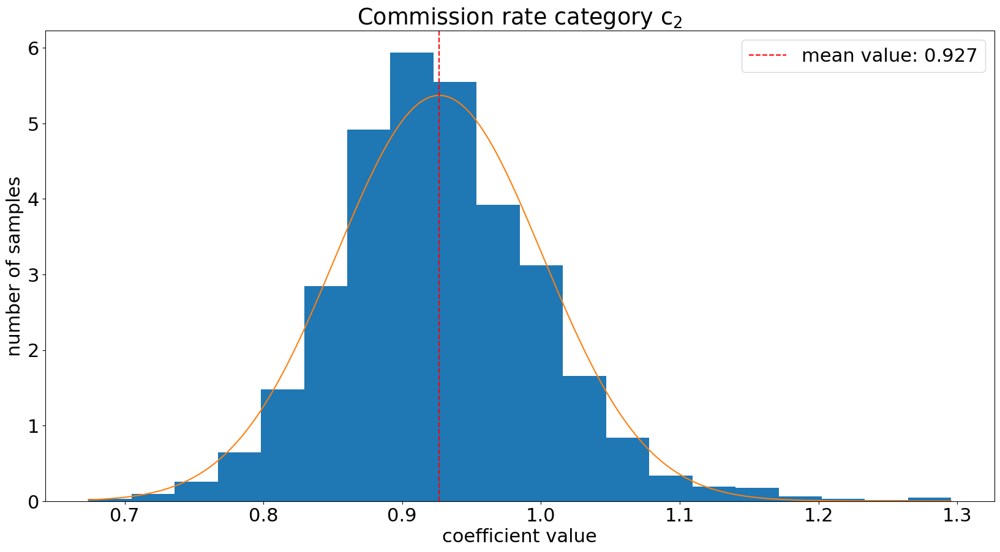

90.0% credible interval: [0.67672028 0.85638603]
p value based on samples: 0.0
p value based on normal distribution: 6.235322662528908e-06


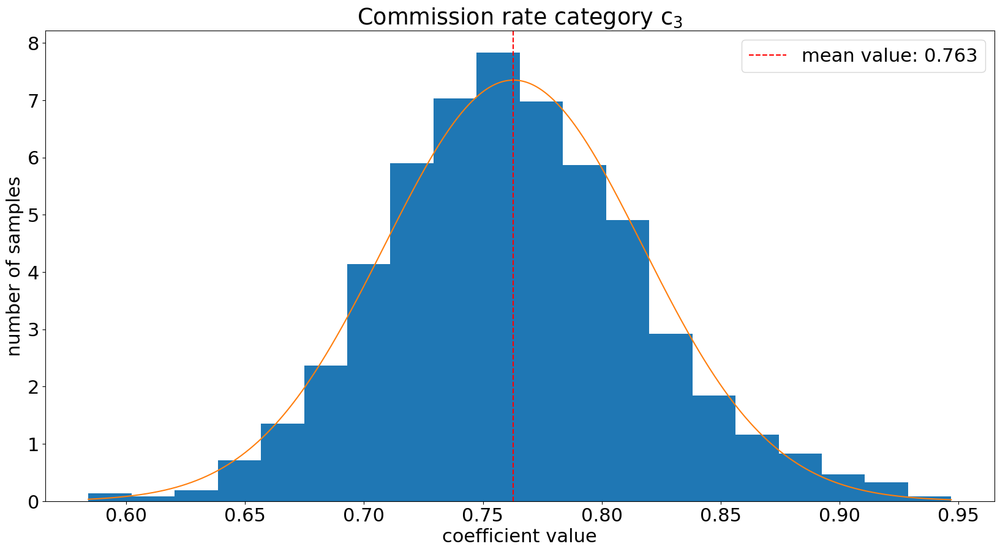

90.0% credible interval: [0.46403773 0.66121993]
p value based on samples: 0.0
p value based on normal distribution: 5.051514762044462e-14


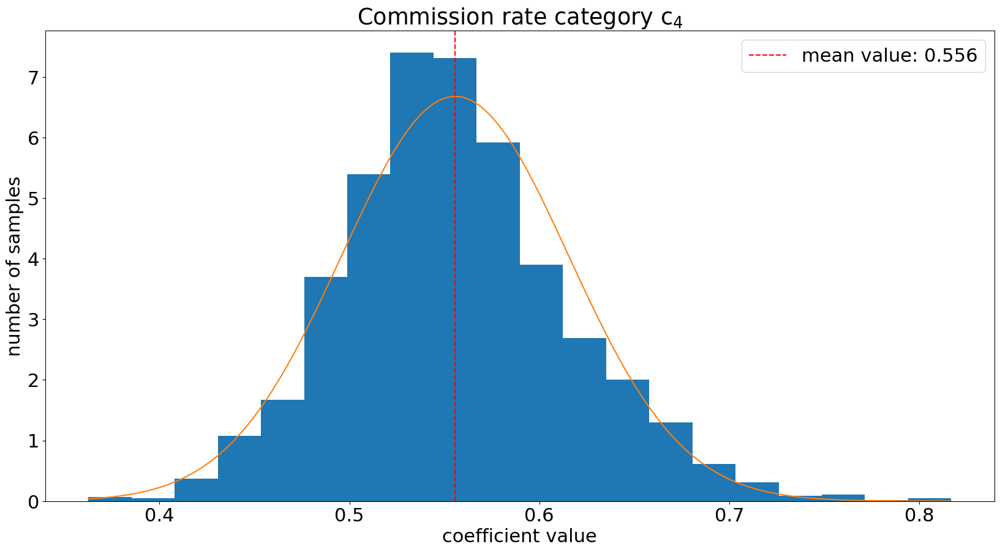

In [82]:
plot_distributions(mu_comm_samples_discount, going_rate_samples_discount)

In [83]:
b_comm_samples_discount = discount_trace['b_comm']

In [84]:
discount_effect_df = calculate_summary_statistics(
    b_comm_samples_discount, mu_comm_samples_discount, market_area_to_index_df)

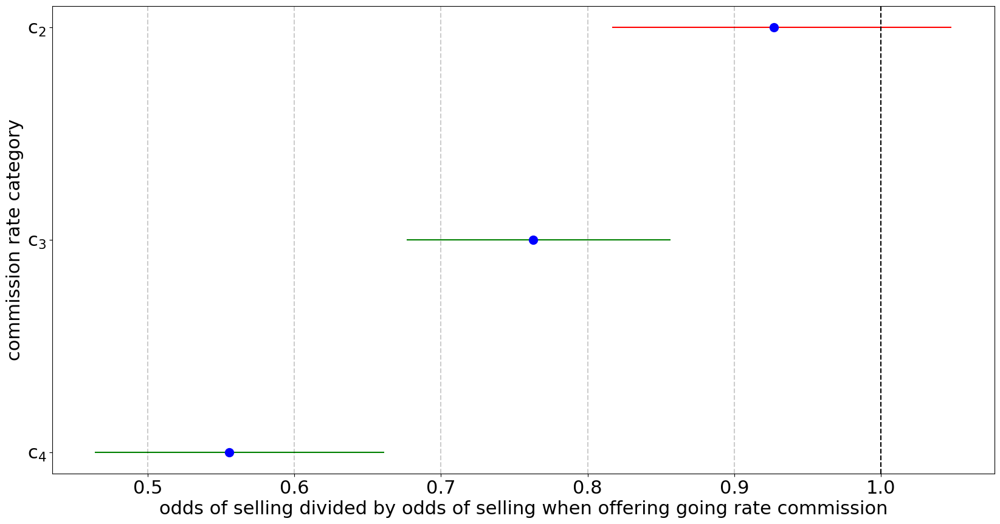

In [85]:
plot_national_effects(discount_effect_df)

In [117]:
alpha = 0.05
for i in range(3):
    print(i)
    sample_diffs = np.exp(mu_comm_samples[:, i + 1] - going_rate_samples)
    sample_diffs_discount = np.exp(mu_comm_samples_discount[:, i + 1] - going_rate_samples_discount)
    discount_diffs = sample_diffs_discount - sample_diffs
    print('mean difference:', discount_diffs.mean())
    print('95% credible interval:', np.quantile(discount_diffs, [alpha / 2, 1 - (alpha / 2)]))
    print('probability discount is lower:', (discount_diffs < 0).mean())

0
mean difference: 0.15154164391040242
95% credible interval: [-0.01689565  0.33197874]
probability discount is lower: 0.039
1
mean difference: 0.09306052205370306
95% credible interval: [-0.04394562  0.22981173]
probability discount is lower: 0.0845
2
mean difference: 0.0673052758447887
95% credible interval: [-0.07460789  0.21403966]
probability discount is lower: 0.181


In [87]:
non_discount_agents = entire_df[
    entire_df['buyside_commission_range'] == 0]['unique_agent_identifier'].unique()

In [88]:
both_agents = set(non_discount_agents).intersection(set(discount_agents))

In [89]:
both_agent_df = entire_df[entire_df['unique_agent_identifier'].isin(both_agents)]

In [128]:
unique_agent_count = len(entire_df['unique_agent_identifier'].unique())
both_agent_count = len(both_agents)

print('number of unique agents:', unique_agent_count)
print('number of discount agents:', both_agent_count)
print('fraction of agents that are both agents:', round(both_agent_count / unique_agent_count, 3))
print('fraction of listings represented by both agents:', round(len(both_agent_df) / len(entire_df), 3))

number of unique agents: 130534
number of discount agents: 6215
fraction of agents that are both agents: 0.048
fraction of listings represented by both agents: 0.118


In [91]:
both_agent_df['buyside_commission_range'].value_counts() / len(both_agent_df)

0    0.594214
2    0.260348
1    0.108555
3    0.036883
Name: buyside_commission_range, dtype: float64

In [92]:
market_area_value_counts = both_agent_df['market_area'].value_counts()
market_area_value_counts

Chicago              4957
Los Angeles          4408
Atlanta              2308
Houston              1978
DC metro area        1895
Philadelphia         1335
Dallas               1306
Austin               1182
West Palm Beach       950
Camden                902
San Diego             854
Denver                781
Riverside             725
Fort Lauderdale       697
Portland, OR          650
Kansas City           376
Seattle               336
Indianapolis          328
Orange County         319
St. Louis             260
Orlando               227
Jersey Shore          215
Cleveland             191
Buffalo               189
Boston                160
Columbus              153
Phoenix               124
San Antonio           116
Pittsburgh            109
Hartford               92
Research-Triangle      30
Providence             17
Name: market_area, dtype: int64

In [93]:
# remove markets with very few listings
small_market_area_threshold = 100
small_market_areas = market_area_value_counts[market_area_value_counts < small_market_area_threshold].index
both_agent_df_final = both_agent_df[
    ~both_agent_df['market_area'].isin(small_market_areas)]

In [94]:
sorted_market_areas = sorted(list(both_agent_df_final['market_area'].unique()))

In [95]:
market_area_to_index_df = pd.DataFrame.from_dict({'market_area': sorted_market_areas})
market_area_to_index_df['market_area_index'] = market_area_to_index_df.index

market_area_num = len(market_area_to_index_df)

In [96]:
both_agent_df_final = both_agent_df_final.merge(
    market_area_to_index_df, on='market_area', how='inner')

In [97]:
home_sale_values = both_agent_df_final['home_sold'].to_numpy()
market_area_indices = both_agent_df_final['market_area_index'].to_numpy()

In [98]:
sigma_prior = 1000

np.random.seed(5555)
with pm.Model() as both_model:
    mu_comm = pm.Normal('mu_comm', mu=0, sigma=100, shape=commission_vals)
    sigma_comm = pm.Exponential('sigma_comm', lam=0.001, shape=commission_vals)
    comm_offset = pm.Normal('comm_offset', mu=0, sigma=1, shape=(market_area_num, commission_vals))
    b_comm = pm.Deterministic('b_comm', mu_comm + comm_offset * sigma_comm)
    
    sigma_b = pm.Exponential('sigma_b', lam=0.001, shape=14)

    b_intercept = pm.Normal('b_intercept', mu=0, sigma=sigma_b[0], shape=market_area_num)
    b_hoa = pm.Normal('b_hoa', mu=0, sigma=sigma_b[1], shape=market_area_num)
    
    b_opendoor = pm.Normal('b_opendoor', mu=0, sigma=sigma_b[2], shape=market_area_num)
    b_zillow = pm.Normal('b_zillow', mu=0, sigma=sigma_b[3], shape=market_area_num)
    b_offerpad = pm.Normal('b_offerpad', mu=0, sigma=sigma_b[4], shape=market_area_num)
    
    b_avg_views_5 = pm.Normal('b_avg_views_5', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_10 = pm.Normal('b_avg_views_10', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_30 = pm.Normal('b_avg_views_30', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_100 = pm.Normal('b_avg_views_100', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_200 = pm.Normal('b_avg_views_200', mu=0, sigma=sigma_prior, shape=market_area_num)
    
    b_null_price = pm.Normal('b_null_price', mu=0, sigma=sigma_b[5], shape=market_area_num)
    b_price = pm.Normal('b_price', mu=0, sigma=sigma_b[6], shape=(market_area_num, feature_to_n_bins['price']))
    b_beds = pm.Normal('b_beds', mu=0, sigma=sigma_b[7], shape=(market_area_num, feature_to_n_bins['beds']))
    b_baths = pm.Normal('b_baths', mu=0, sigma=sigma_b[8], shape=(market_area_num, feature_to_n_bins['baths']))
    b_sqft = pm.Normal('b_sqft', mu=0, sigma=sigma_b[9], shape=(market_area_num, feature_to_n_bins['sqft']))
    b_year_built = pm.Normal('b_year_built', mu=0, sigma=sigma_b[10], 
                             shape=(market_area_num, feature_to_n_bins['year_built']))
    b_price_difference_pct = pm.Normal('b_price_difference_pct', mu=0, sigma=sigma_b[11], 
                                       shape=(market_area_num, feature_to_n_bins['price_difference_pct']))
    b_property_category = pm.Normal('b_property_category', mu=0, sigma=sigma_b[12], 
                                    shape=(market_area_num, property_category_vals))
    b_created_month = pm.Normal('b_created_month', mu=0, sigma=sigma_b[13], 
                                shape=(market_area_num, created_month_vals))

    lin_pred_func = pm.Deterministic(
        'lin_pred_func', 
        b_intercept[market_area_indices] +
        b_comm[market_area_indices, both_agent_df_final['buyside_commission_range'].values] +
        b_hoa[market_area_indices] * both_agent_df_final['hoa'] + 
        b_opendoor[market_area_indices] * both_agent_df_final['opendoor'] +
        b_zillow[market_area_indices] * both_agent_df_final['zillow'] +
        b_offerpad[market_area_indices] * both_agent_df_final['offerpad'] +
        b_avg_views_5[market_area_indices] * both_agent_df_final['avg_views_5'] + 
        b_avg_views_10[market_area_indices] * both_agent_df_final['avg_views_10'] + 
        b_avg_views_30[market_area_indices] * both_agent_df_final['avg_views_30'] +
        b_avg_views_100[market_area_indices] * both_agent_df_final['avg_views_100'] +
        b_avg_views_200[market_area_indices] * both_agent_df_final['avg_views_200'] +
        b_null_price[market_area_indices] * both_agent_df_final['null_redfin_price_estimate'] + 
        b_price[market_area_indices, both_agent_df_final['price_range'].values] + 
        b_beds[market_area_indices, both_agent_df_final['beds_range'].values] + 
        b_baths[market_area_indices, both_agent_df_final['baths_range'].values] + 
        b_sqft[market_area_indices, both_agent_df_final['sqft_range'].values] + 
        b_year_built[market_area_indices, both_agent_df_final['year_built_range'].values] + 
        b_price_difference_pct[market_area_indices, 
                               both_agent_df_final['price_difference_pct_range'].values] +  
        b_property_category[market_area_indices, both_agent_df_final['property_category_index'].values] +
        b_created_month[market_area_indices, both_agent_df_final['created_month_index'].values]
    ) 

    p = pm.math.invlogit(lin_pred_func)
    
    home_sold = pm.Bernoulli('home_sold', p=p, observed=home_sale_values)

In [101]:
rerun_both_sampler = False

In [102]:
# load trace (note: refitting the model will take around 7.5 hours)
with both_model:
    if rerun_both_sampler:
        both_trace = pm.sample(500, tune=1000, chains=4, target_accept=0.9, init='advi+adapt_diag', 
                                   n_init=50_000)
    else:
        both_trace = pm.load_trace('both_prob_of_sale_120_days_trace')

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...


Finished [100%]: Average Loss = 17,020
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b_created_month, b_property_category, b_price_difference_pct, b_year_built, b_sqft, b_baths, b_beds, b_price, b_null_price, b_avg_views_200, b_avg_views_100, b_avg_views_30, b_avg_views_10, b_avg_views_5, b_offerpad, b_zillow, b_opendoor, b_hoa, b_intercept, sigma_b, comm_offset, sigma_comm, mu_comm]
WARNING (theano.link.c.cmodule): install mkl with `conda install mkl-service`: No module named 'mkl'
WARNING (theano.link.c.cmodule): install mkl with `conda install mkl-service`: No module named 'mkl'
WARNING (theano.link.c.cmodule): install mkl with `conda install mkl-service`: No module named 'mkl'
WARNING (theano.link.c.cmodule): install mkl with `conda install mkl-service`: No module named 'mkl'


Sampling 4 chains for 1_000 tune and 500 draw iterations (4_000 + 2_000 draws total) took 11292 seconds.
The rhat statistic is larger than 1.2 for some parameters.
The estimated number of effective samples is smaller than 200 for some parameters.


In [104]:
var_names = [
    'b_price_difference_pct', 'b_year_built', 'b_price', 'b_avg_views_5', 'b_avg_views_10', 'b_avg_views_30', 
    'b_avg_views_100', 'b_avg_views_200', 'b_created_month', 'sigma_b', 'b_null_price', 'b_hoa', 
    'b_intercept', 'b_opendoor', 'b_zillow', 'b_offerpad', 'b_beds', 'b_baths', 'b_sqft', 'b_property_category',
    'b_comm', 'sigma_comm', 'mu_comm'
]

with both_model:
    both_summary_df = pm.summary(both_trace, var_names=var_names).round(4)

In [105]:
both_summary_df['r_hat'].value_counts()

1.00    1507
1.01     248
1.05      77
1.04      69
1.06      55
1.07      36
1.03      34
1.17      13
1.16      13
1.08      11
1.18      11
1.19      11
1.02       8
1.20       5
1.15       3
1.22       2
1.09       2
1.25       1
1.24       1
1.14       1
1.32       1
1.38       1
Name: r_hat, dtype: int64

In [106]:
mu_comm_samples_both = both_trace['mu_comm']
going_rate_samples_both = mu_comm_samples_both[:, 0]

90.0% credible interval: [0.84860023 1.20105216]
p value based on samples: 0.498
p value based on normal distribution: 0.5311110530101683


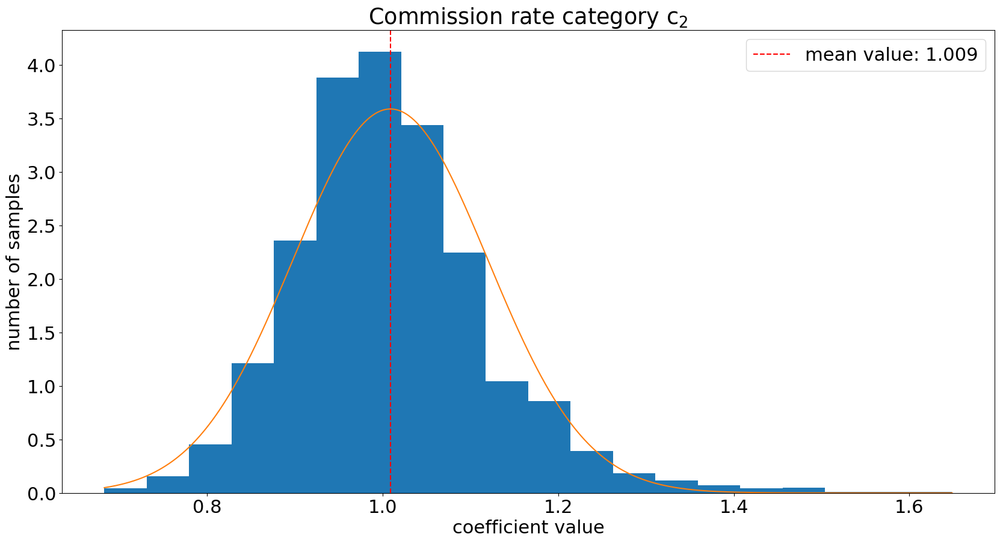

90.0% credible interval: [0.6815506  0.88638567]
p value based on samples: 0.0025
p value based on normal distribution: 0.00034023077314571104


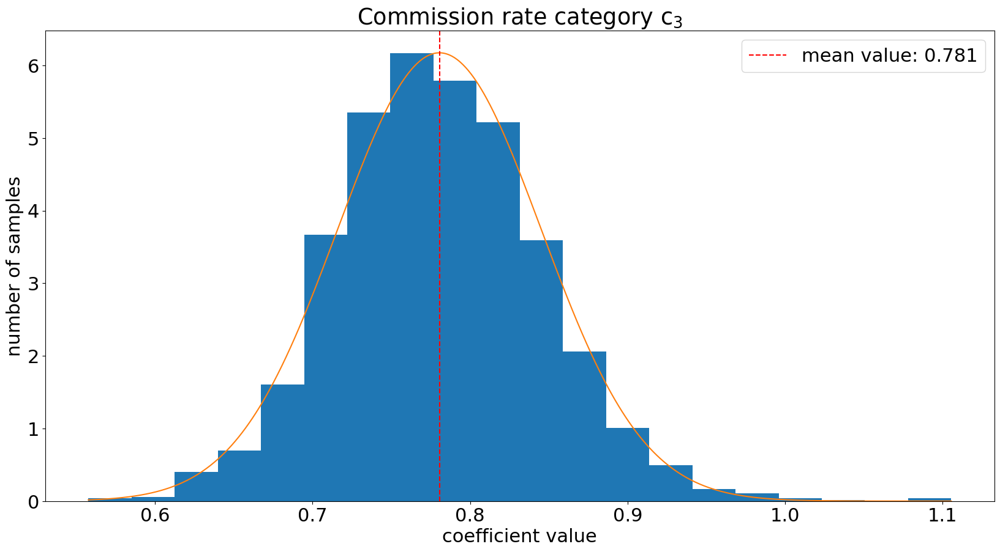

90.0% credible interval: [0.45077103 0.6944217 ]
p value based on samples: 0.0005
p value based on normal distribution: 4.548065146714464e-09


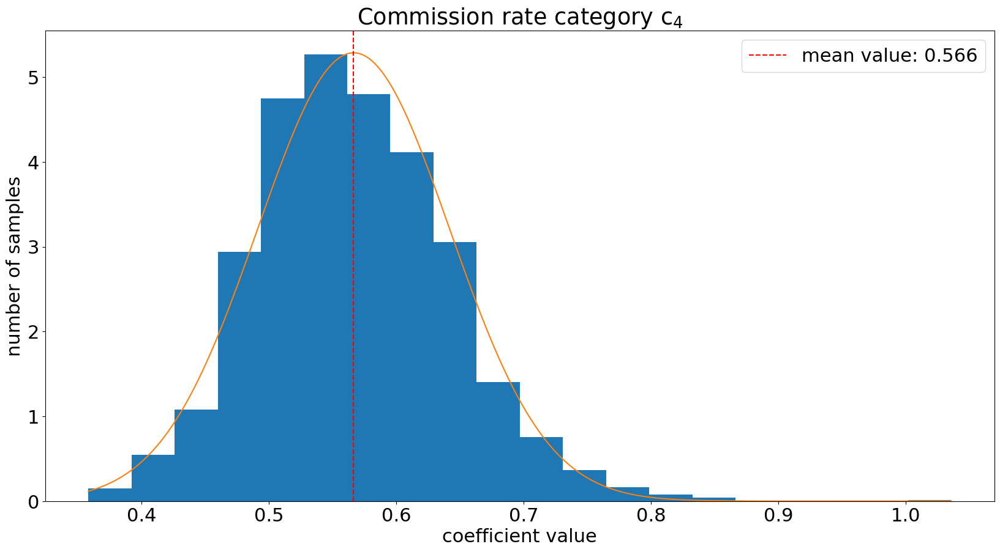

In [107]:
plot_distributions(mu_comm_samples_both, going_rate_samples_both)

In [109]:
b_comm_samples_both = both_trace['b_comm']

In [110]:
both_effect_df = calculate_summary_statistics(
    b_comm_samples_both, mu_comm_samples_both, market_area_to_index_df)

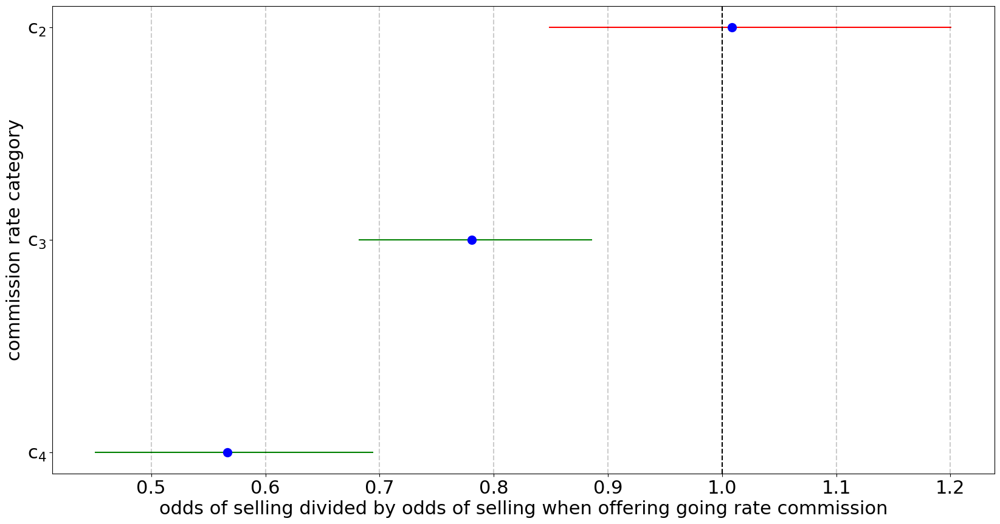

In [112]:
plot_national_effects(both_effect_df)

In [118]:
alpha = 0.05
for i in range(3):
    print(i)
    sample_diffs = np.exp(mu_comm_samples[:, i + 1] - going_rate_samples)
    sample_diffs_both = np.exp(mu_comm_samples_both[:, i + 1] - going_rate_samples_both)
    both_diffs = sample_diffs_both - sample_diffs
    print('mean difference:', both_diffs.mean())
    print('95% credible interval:', np.quantile(both_diffs, [alpha / 2, 1 - (alpha / 2)]))
    print('probability both is lower:', (both_diffs < 0).mean())

0
mean difference: 0.23344573260731494
95% credible interval: [0.01807261 0.49102832]
probability both is lower: 0.0185
1
mean difference: 0.11070632664404526
95% credible interval: [-0.03767723  0.2581811 ]
probability both is lower: 0.0715
2
mean difference: 0.07813284007659843
95% credible interval: [-0.07447824  0.25602443]
probability both is lower: 0.1845
